# Image-to-Image Translation with Conditional Adversarial Networks - summary
Author: Nikolay Chehlarov
date: 04.02.2022

paper: Image-to-Image Translation with Conditional Adversarial Networks

authors: Phillip Isola Jun-Yan Zhu Tinghui Zhou Alexei A. Efros Berkeley AI Research (BAIR) Laboratory, UC Berkeley

Link to paper: https://arxiv.org/abs/1611.07004<br>
Official implementation: https://github.com/phillipi/pix2pix.

# Abstract
The aim of the model is translate one to another image.
Given input (picture) in one modality, output in different modality is generated. Training is done on pairs of pictures in two different modalities. Example pairs include satellite image - Google maps image, day - night, sketch - bag, semantic segment mask - real image and many more. One can provide a semantic segmented mask and obtain a realistic picture for example.

An on-line implementation can be used https://affinelayer.com/pixsrv/ to test the approach.

Traditionally, this tasks has been tackled with separate, special-purpose machinery, despite the fact that the setting
is always the same: predict pixels from pixels. The goal in this paper is to develop a common framework for all these
problems.

![fig.1 ](figures/pix2pix_figure1.png)

# Highlights
- conditional GAN is used
- structured loss is learned during training
- suitable for wide variety of problems; the framework is not application specific
- U-net generator
- PatchGAN discriminator
- noise provided only in the form of dropout in generator at both training and test time.

# Model architecture

The pix2pix is based on conditional GAN architecture.
The main building block of the pix2pix architecture are:
- Generator: task - generate realistic looking pictures that fool the discriminator; In the case of pix2pix the generator is U-net (https://arxiv.org/abs/1505.04597)
- Discriminator: task - figure out if the image real or fake. The discriminator is convolutional patch GAN classifier, which only penalizes structure at the scale of image patches. It classifies patch by patch, finally the results are averaged.

Unlike typical cGAN, the generator accepts combination of two losses - one from the discriminator (GAN loss, binary cross entropy) and one for the difference between the generated output to the input pair (the mask). The second loss is mean absolute error, and is referred as L1 loss. In the paper the combined loss is weighted sum, with L1 having weight of 100. Unlike an unconditional GAN, both the generator and discriminator observe the input edge map.

The objective of a conditional GAN can be expressed as $$ \mathscr{L}_{cGAN}(G, D)=E_{x, y}[logD(x, y))] + E_{x, y}[log(1 - D(x, G(x, z)))]$$
where G tries to minimize this objective against an adversarial D that tries to maximize it.

![fig.2](figures/pix2pix_figure3.png)

The conditional GAN the loss is learned, and can, in theory, penalize any possible structure that differs between output and target. Conditional GANs learn a mapping from observed image xr and random noise vector z, to y.

# Key details from the paper

- Use of adam solver with a learning rate of 0.0002, and momentum parameters ß1 = 0.5, ß2 = 0.999
- batch size of 1 "...when the batch size is set to 1, has been termed “instance normalization” and has been demonstrated to be effective at image generation task"
- "70x70 PatchGAN forces outputs that are sharp"
- total loss = 100 x L1 + cGAN; L1 is mean absolute error and cGAN loss is binary cross entropy loss
- all activations are leaky RelU with slope 0.2 in the encoder; the decoder ReLUs are not leaky
- Unlike typical approach, dropout is applied during training and testing
- batch normalization is applied using statistics on the test batch, rather than aggregated statistics on the training batch.
- two metrics are used for model evaluation - AMT perceptual studies and FCN-score
- the tests performed on photo to map task fooled 6.1% of the participants in the AMT test. The poor performance of the generator may be because minor structural errors are more visible on map images.

# Implementation

The implementation is originated from https://github.com/bnsreenu/python_for_microscopists/tree/master/251_satellite_image_to_maps_translation with minimal modifications. This source is based on the code by Jason Brownlee from his blogs on https://machinelearningmastery.com/.  

The model is targeted to create maps from satellite images.
- source image is the satellite image
- target image is the maps image

Generator:  
Input - source image; Output - target image

The encoder-decoder architecture consists of:

encoder:
C64-C128-C256-C512-C512-C512-C512-C512

decoder:
CD512-CD512-CD512-C512-C256-C128-C64

Discriminator:

Input - pair of source and target image; output - probability between 0 and 1 that the inputs are actually a pair

C64-C128-C256-C512

After the last layer, a convolution is applied to map to a 1-dimensional output, followed by a Sigmoid function. 

In [1]:
from matplotlib import pyplot as plt
from os import listdir
from datetime import datetime 
import numpy as np
from numpy import asarray, load, vstack, savez_compressed, zeros, ones
from numpy.random import randint

In [2]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU, Activation, Concatenate, Dropout, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

## Function definition

In [3]:
#############################################################################
#Define generator, discriminator, gan and other helper functions
#We will use functional way of defining model and not sequential
#as we have multiple inputs; both images and corresponding labels. 
########################################################################


def define_discriminator(image_shape):
    
    # weight initialization
    init = RandomNormal(stddev=0.02) #As described in the original paper
    
    # source image input
    in_src_image = Input(shape=image_shape)  #Image we want to convert to another image
    # target image input
    in_target_image = Input(shape=image_shape)  #Image we want to generate after training. 
    
    # concatenate images, channel-wise
    merged = Concatenate()([in_src_image, in_target_image])
    
    # C64: 4x4 kernel Stride 2x2
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)
    # C128: 4x4 kernel Stride 2x2
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256: 4x4 kernel Stride 2x2
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512: 4x4 kernel Stride 2x2 
    # This block is not in the original paper. 
    # d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    # d = BatchNormalization()(d)
    # d = LeakyReLU(alpha=0.2)(d)
    # second last output layer : 4x4 kernel but Stride 1x1
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)
    # define model
    model = Model([in_src_image, in_target_image], patch_out)
    # compile model
    #The model is trained with a batch size of one image and Adam opt. 
    #with a small learning rate and 0.5 beta1. 
    #The loss for the discriminator is weighted by 50% for each model update.
    
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    
    return model

# disc_model = define_discriminator((256,256,3))
# disc_model.summary()

In [4]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
    # define an encoder block to be used in generator
    init = RandomNormal(stddev=0.02)
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    g = LeakyReLU(alpha=0.2)(g)
    return g


def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    # define a decoder block to be used in generator
    init = RandomNormal(stddev=0.02)
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    g = BatchNormalization()(g, training=True)
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    g = Activation('relu')(g)
    return g


def define_generator(image_shape=(256,256,3)):
    """
    Definint the generator, in this case U-net
    Inputs should be in the range -1 to 1; generated outputs are also in this range
    """
    init = RandomNormal(stddev=0.02)
    in_image = Input(shape=image_shape)
    
    # encoder model: C64-C128-C256-C512-C512-C512-C512-C512
    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e7 = define_encoder_block(e6, 512)
    
    # bottleneck, no batch norm 
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    
    # decoder model: CD512-CD512-CD512-C512-C256-C128-C64
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)
    # output
    g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7) 
    out_image = Activation('tanh')(g)  #Generates images in the range -1 to 1.
    
    # define model, without compile
    model = Model(in_image, out_image)
    return model

# gen_model = define_generator((256,256,3))
# gen_model.summary()

In [5]:
def define_gan(g_model, d_model, image_shape):
    # define the combined generator and discriminator model, for updating the generator
    # make weights in the discriminator not trainable
    for layer in d_model.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = False       #Descriminator layers set to untrainable in the combined GAN but 
                                                #standalone descriminator will be trainable.
            
    # define the source image
    in_src = Input(shape=image_shape)
    # suppy the image as input to the generator 
    gen_out = g_model(in_src)
    # supply the input image and generated image as inputs to the discriminator
    dis_out = d_model([in_src, gen_out])
    # src image as input, generated image and disc. output as outputs
    model = Model(in_src, [dis_out, gen_out])
    
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    
    #Total loss is the weighted sum of adversarial loss (BCE) and L1 loss (MAE)
    #Authors suggested weighting BCE vs L1 as 1:100.
    model.compile(loss=['binary_crossentropy', 'mae'], 
                  optimizer=opt,
                  loss_weights=[1, 100]
                 )
    return model


def generate_real_samples(dataset, n_samples, patch_shape, pic_idx=None):
    # select a batch of random samples, returns images and target
    # unpack dataset
    trainA, trainB = dataset # trainA is satellite image, trainB is coresponding maps image
    if pic_idx == None:
        # choose random instances
        ix = randint(0, trainA.shape[0], n_samples)
    else:
        ix = np.array(pic_idx)
    # retrieve selected images
    X1, X2 = trainA[ix], trainB[ix]
    # generate 'real' class labels (1)
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y


def generate_fake_samples(g_model, samples, patch_shape):
    # generate a batch of images, returns images and targets
    # generate fake instance
    X = g_model.predict(samples)
    # create 'fake' class labels (0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y


def summarize_performance(step, g_model, data_set, n_samples=3, pic_idx=None):
    """
    step : a strin gindicating the step of the trainning
    generate samples and save as a plot and save the model
    GAN models do not converge, we just want to find a good balance between
    the generator and the discriminator. Therefore, it makes sense to periodically
    save the generator model and check how good the generated image looks. 
    """
    # select a sample of input images
    [X_realA, X_realB], _ = generate_real_samples(data_set, n_samples, 1, pic_idx=pic_idx)
    # generate a batch of fake samples
    X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
    
    #     print("before")
    #     print(f"data_set max {data_set[0].max()}, min {data_set[0].min()}")
    #     print(f"shape {X_realA.shape}; min/max {X_realA.min()}/{X_realA.max()}")
    #     print(f"shape {X_realB.shape}; min/max {X_realB.min()}/{X_realB.max()}")
    #     print(f"shape {X_fakeB.shape}; min/max {X_fakeB.min()}/{X_fakeB.max()}")
    # scale all pixels from [-1,1] to [0,1]
    X_realA = (X_realA + 1) / 2.0
    X_realB = (X_realB + 1) / 2.0
    X_fakeB = (X_fakeB + 1) / 2.0
        
    # plot real source images
    fig = plt.figure(figsize=(10,10))
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + i)
        plt.axis('off')
        plt.imshow(X_realA[i])
    # plot generated target image
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.imshow(X_fakeB[i])
    # plot real target image
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples*2 + i)
        plt.axis('off')
        plt.imshow(X_realB[i])
    fig.suptitle(f'Model performance at {step} (src/gen/real)', fontsize=16)
    # save plot to file
    filename1 = 'plot_' + str(step) + '.png'
    plt.savefig(filename1)
    plt.show()
    plt.close()
    # save the generator model
    filename2 = 'model_' + str(step) + '.h5'
    g_model.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

    
def train(d_model, g_model, gan_model, d_train, d_test, n_epochs=100, n_batch=1):
    """
    train pix2pix models
    10 epochs need about 1h on Quadro T1000
    """
    
    # determine the output square shape of the discriminator
    n_patch = d_model.output_shape[1]
    # unpack dataset
    trainA, trainB = d_train
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    # manually enumerate epochs
    for i in range(n_steps):
        # select a batch of real samples
        [X_realA, X_realB], y_real = generate_real_samples(d_train, n_batch, n_patch)
        # generate a batch of fake samples
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
        # update discriminator for real samples
        d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
        # update discriminator for generated samples
        d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        # update the generator
        g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB]) #gan loss, d_model loss, g_model loss
        # summarize performance
        print(f'step{i+1}: d_loss_real[{d_loss1:.3f}] d_loss_fake[{d_loss2:.3f}] gan_loss[{g_loss:.3f}]')
        # summarize model performance
        if (i+1) % (bat_per_epo * 1) == 0:
            # every epoch
            step = "epoch" + str((i+1) / bat_per_epo)
            summarize_performance(step, g_model, d_test, n_samples=3, pic_idx=[0, 2, 9])

## Loading data

Data from: http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz<br>
Other datasets can be found here: http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/

In [9]:
def load_images(path, size=(256,512)):
    """
    Load all images from a directory into memory
    """
    src_list, tar_list = list(), list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        # load and resize the image
        pixels = load_img(path + filename, target_size=size)
        # convert to numpy array
        pixels = img_to_array(pixels)
        # split into satellite and map
        sat_img, map_img = pixels[:, :256], pixels[:, 256:]
        src_list.append(sat_img)
        tar_list.append(map_img)
    return [asarray(src_list), asarray(tar_list)]


def preprocess_data(data):
    # load compressed arrays
    # unpack arrays
    X1, X2 = data[0], data[1]
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

# train
path = 'maps/train/'
dataset_train = preprocess_data(load_images(path))
print('Loaded train: ', dataset_train[0].shape, dataset_train[1].shape)

# test dataset path
path = 'maps/test/'
dataset_test = preprocess_data(load_images(path))
print('Loaded train: ', dataset_test[0].shape, dataset_test[1].shape)

Loaded train:  (1096, 256, 256, 3) (1096, 256, 256, 3)
Loaded train:  (32, 256, 256, 3) (32, 256, 256, 3)


## Defining and training the model

In [11]:
# define input shape based on the loaded dataset
image_shape =  dataset_train[0].shape[1:]

# define the models
d_model = define_discriminator(image_shape) # model
g_model = define_generator(image_shape) # model_1
gan_model = define_gan(g_model, d_model, image_shape) # model_2

step1: d_loss_real[0.470] d_loss_fake[0.750] gan_loss[78.880]
step2: d_loss_real[0.336] d_loss_fake[0.632] gan_loss[70.351]
step3: d_loss_real[0.350] d_loss_fake[0.468] gan_loss[71.716]
step4: d_loss_real[0.339] d_loss_fake[0.430] gan_loss[67.774]
step5: d_loss_real[0.343] d_loss_fake[0.415] gan_loss[63.780]
step6: d_loss_real[0.329] d_loss_fake[0.387] gan_loss[54.318]
step7: d_loss_real[0.312] d_loss_fake[0.385] gan_loss[62.359]
step8: d_loss_real[0.355] d_loss_fake[0.370] gan_loss[60.752]
step9: d_loss_real[0.398] d_loss_fake[0.384] gan_loss[41.801]
step10: d_loss_real[0.298] d_loss_fake[0.354] gan_loss[51.232]
step11: d_loss_real[0.425] d_loss_fake[0.909] gan_loss[40.961]
step12: d_loss_real[0.482] d_loss_fake[0.676] gan_loss[42.712]
step13: d_loss_real[0.326] d_loss_fake[0.424] gan_loss[47.103]
step14: d_loss_real[0.253] d_loss_fake[0.335] gan_loss[44.522]
step15: d_loss_real[0.203] d_loss_fake[0.311] gan_loss[42.421]
step16: d_loss_real[0.253] d_loss_fake[0.479] gan_loss[26.772]
s

step131: d_loss_real[0.102] d_loss_fake[0.073] gan_loss[10.318]
step132: d_loss_real[0.033] d_loss_fake[0.074] gan_loss[11.873]
step133: d_loss_real[0.029] d_loss_fake[0.070] gan_loss[14.785]
step134: d_loss_real[0.027] d_loss_fake[0.062] gan_loss[17.667]
step135: d_loss_real[1.135] d_loss_fake[0.103] gan_loss[26.836]
step136: d_loss_real[0.017] d_loss_fake[0.337] gan_loss[13.603]
step137: d_loss_real[0.022] d_loss_fake[0.107] gan_loss[17.120]
step138: d_loss_real[0.053] d_loss_fake[0.093] gan_loss[14.483]
step139: d_loss_real[0.975] d_loss_fake[0.120] gan_loss[9.367]
step140: d_loss_real[0.044] d_loss_fake[0.159] gan_loss[14.550]
step141: d_loss_real[0.406] d_loss_fake[0.188] gan_loss[9.489]
step142: d_loss_real[0.039] d_loss_fake[0.237] gan_loss[10.099]
step143: d_loss_real[0.124] d_loss_fake[0.252] gan_loss[14.748]
step144: d_loss_real[0.020] d_loss_fake[0.132] gan_loss[29.486]
step145: d_loss_real[0.158] d_loss_fake[0.091] gan_loss[10.712]
step146: d_loss_real[0.858] d_loss_fake[0.

step260: d_loss_real[0.017] d_loss_fake[0.177] gan_loss[11.407]
step261: d_loss_real[0.083] d_loss_fake[0.105] gan_loss[10.608]
step262: d_loss_real[0.077] d_loss_fake[0.080] gan_loss[9.996]
step263: d_loss_real[0.442] d_loss_fake[0.503] gan_loss[8.397]
step264: d_loss_real[0.524] d_loss_fake[0.256] gan_loss[19.573]
step265: d_loss_real[0.309] d_loss_fake[0.230] gan_loss[7.892]
step266: d_loss_real[0.177] d_loss_fake[0.168] gan_loss[10.680]
step267: d_loss_real[0.007] d_loss_fake[0.152] gan_loss[22.766]
step268: d_loss_real[0.322] d_loss_fake[0.306] gan_loss[21.527]
step269: d_loss_real[0.120] d_loss_fake[0.379] gan_loss[9.518]
step270: d_loss_real[0.101] d_loss_fake[0.150] gan_loss[17.699]
step271: d_loss_real[0.025] d_loss_fake[0.064] gan_loss[16.409]
step272: d_loss_real[0.737] d_loss_fake[0.127] gan_loss[8.569]
step273: d_loss_real[0.017] d_loss_fake[0.119] gan_loss[13.992]
step274: d_loss_real[0.206] d_loss_fake[0.165] gan_loss[9.406]
step275: d_loss_real[0.048] d_loss_fake[0.115]

step389: d_loss_real[0.015] d_loss_fake[0.101] gan_loss[19.767]
step390: d_loss_real[0.437] d_loss_fake[0.169] gan_loss[10.211]
step391: d_loss_real[0.211] d_loss_fake[0.227] gan_loss[10.095]
step392: d_loss_real[0.010] d_loss_fake[0.098] gan_loss[21.655]
step393: d_loss_real[0.428] d_loss_fake[0.178] gan_loss[20.714]
step394: d_loss_real[0.199] d_loss_fake[0.440] gan_loss[10.391]
step395: d_loss_real[0.092] d_loss_fake[0.286] gan_loss[11.714]
step396: d_loss_real[0.195] d_loss_fake[0.165] gan_loss[11.381]
step397: d_loss_real[0.029] d_loss_fake[0.084] gan_loss[15.414]
step398: d_loss_real[0.024] d_loss_fake[0.111] gan_loss[23.232]
step399: d_loss_real[0.050] d_loss_fake[0.069] gan_loss[19.431]
step400: d_loss_real[1.223] d_loss_fake[0.177] gan_loss[17.698]
step401: d_loss_real[0.021] d_loss_fake[1.285] gan_loss[14.958]
step402: d_loss_real[0.063] d_loss_fake[0.478] gan_loss[16.198]
step403: d_loss_real[0.974] d_loss_fake[0.139] gan_loss[15.330]
step404: d_loss_real[0.696] d_loss_fake[

step518: d_loss_real[0.213] d_loss_fake[0.181] gan_loss[13.246]
step519: d_loss_real[0.214] d_loss_fake[0.152] gan_loss[11.387]
step520: d_loss_real[0.359] d_loss_fake[0.232] gan_loss[11.658]
step521: d_loss_real[0.251] d_loss_fake[0.351] gan_loss[13.600]
step522: d_loss_real[0.048] d_loss_fake[0.146] gan_loss[12.039]
step523: d_loss_real[0.362] d_loss_fake[0.148] gan_loss[10.252]
step524: d_loss_real[0.025] d_loss_fake[0.101] gan_loss[21.774]
step525: d_loss_real[0.482] d_loss_fake[0.465] gan_loss[15.316]
step526: d_loss_real[0.034] d_loss_fake[0.118] gan_loss[14.410]
step527: d_loss_real[0.015] d_loss_fake[0.058] gan_loss[20.253]
step528: d_loss_real[0.496] d_loss_fake[0.090] gan_loss[10.533]
step529: d_loss_real[0.377] d_loss_fake[0.231] gan_loss[8.144]
step530: d_loss_real[0.006] d_loss_fake[0.166] gan_loss[21.468]
step531: d_loss_real[0.006] d_loss_fake[0.143] gan_loss[14.770]
step532: d_loss_real[0.800] d_loss_fake[0.185] gan_loss[6.429]
step533: d_loss_real[0.007] d_loss_fake[0.

step647: d_loss_real[0.451] d_loss_fake[0.266] gan_loss[9.893]
step648: d_loss_real[0.281] d_loss_fake[0.263] gan_loss[9.000]
step649: d_loss_real[0.145] d_loss_fake[0.202] gan_loss[9.375]
step650: d_loss_real[0.089] d_loss_fake[0.101] gan_loss[14.490]
step651: d_loss_real[0.110] d_loss_fake[0.103] gan_loss[12.065]
step652: d_loss_real[0.118] d_loss_fake[0.111] gan_loss[14.986]
step653: d_loss_real[0.039] d_loss_fake[0.088] gan_loss[14.747]
step654: d_loss_real[0.060] d_loss_fake[0.142] gan_loss[10.649]
step655: d_loss_real[0.655] d_loss_fake[0.184] gan_loss[8.153]
step656: d_loss_real[0.051] d_loss_fake[0.221] gan_loss[11.393]
step657: d_loss_real[0.146] d_loss_fake[0.195] gan_loss[10.736]
step658: d_loss_real[0.015] d_loss_fake[0.149] gan_loss[26.715]
step659: d_loss_real[0.201] d_loss_fake[0.169] gan_loss[14.712]
step660: d_loss_real[0.280] d_loss_fake[0.258] gan_loss[9.922]
step661: d_loss_real[0.313] d_loss_fake[0.559] gan_loss[20.018]
step662: d_loss_real[0.405] d_loss_fake[0.239

step776: d_loss_real[0.272] d_loss_fake[0.114] gan_loss[11.532]
step777: d_loss_real[0.079] d_loss_fake[0.383] gan_loss[9.210]
step778: d_loss_real[0.466] d_loss_fake[0.149] gan_loss[9.003]
step779: d_loss_real[0.091] d_loss_fake[0.095] gan_loss[16.709]
step780: d_loss_real[0.349] d_loss_fake[0.230] gan_loss[9.684]
step781: d_loss_real[0.182] d_loss_fake[0.111] gan_loss[22.073]
step782: d_loss_real[0.006] d_loss_fake[0.266] gan_loss[12.212]
step783: d_loss_real[0.167] d_loss_fake[0.216] gan_loss[9.686]
step784: d_loss_real[0.235] d_loss_fake[0.322] gan_loss[8.921]
step785: d_loss_real[0.004] d_loss_fake[0.135] gan_loss[16.889]
step786: d_loss_real[0.006] d_loss_fake[0.067] gan_loss[23.609]
step787: d_loss_real[0.036] d_loss_fake[0.077] gan_loss[15.448]
step788: d_loss_real[0.021] d_loss_fake[0.094] gan_loss[23.078]
step789: d_loss_real[1.514] d_loss_fake[0.162] gan_loss[14.368]
step790: d_loss_real[0.774] d_loss_fake[0.468] gan_loss[10.853]
step791: d_loss_real[0.012] d_loss_fake[0.176

step905: d_loss_real[0.209] d_loss_fake[0.262] gan_loss[14.446]
step906: d_loss_real[0.388] d_loss_fake[0.097] gan_loss[9.198]
step907: d_loss_real[0.156] d_loss_fake[0.218] gan_loss[8.454]
step908: d_loss_real[0.089] d_loss_fake[0.172] gan_loss[10.222]
step909: d_loss_real[0.009] d_loss_fake[0.097] gan_loss[14.687]
step910: d_loss_real[0.280] d_loss_fake[0.256] gan_loss[8.877]
step911: d_loss_real[0.124] d_loss_fake[0.210] gan_loss[15.505]
step912: d_loss_real[0.280] d_loss_fake[0.240] gan_loss[10.295]
step913: d_loss_real[0.005] d_loss_fake[0.278] gan_loss[13.401]
step914: d_loss_real[0.432] d_loss_fake[0.260] gan_loss[13.604]
step915: d_loss_real[0.025] d_loss_fake[0.230] gan_loss[15.528]
step916: d_loss_real[0.519] d_loss_fake[0.138] gan_loss[9.375]
step917: d_loss_real[0.019] d_loss_fake[0.276] gan_loss[17.123]
step918: d_loss_real[0.299] d_loss_fake[0.110] gan_loss[11.768]
step919: d_loss_real[0.011] d_loss_fake[0.143] gan_loss[14.066]
step920: d_loss_real[0.033] d_loss_fake[0.07

step1034: d_loss_real[0.187] d_loss_fake[0.164] gan_loss[8.836]
step1035: d_loss_real[0.138] d_loss_fake[0.207] gan_loss[8.550]
step1036: d_loss_real[0.124] d_loss_fake[0.263] gan_loss[8.383]
step1037: d_loss_real[0.195] d_loss_fake[0.136] gan_loss[11.038]
step1038: d_loss_real[0.014] d_loss_fake[0.093] gan_loss[14.435]
step1039: d_loss_real[0.026] d_loss_fake[0.036] gan_loss[15.484]
step1040: d_loss_real[0.130] d_loss_fake[0.097] gan_loss[12.825]
step1041: d_loss_real[0.002] d_loss_fake[0.100] gan_loss[14.324]
step1042: d_loss_real[0.367] d_loss_fake[0.273] gan_loss[9.802]
step1043: d_loss_real[0.023] d_loss_fake[0.135] gan_loss[22.585]
step1044: d_loss_real[0.069] d_loss_fake[0.139] gan_loss[16.359]
step1045: d_loss_real[0.206] d_loss_fake[0.177] gan_loss[9.602]
step1046: d_loss_real[0.352] d_loss_fake[0.543] gan_loss[9.484]
step1047: d_loss_real[0.003] d_loss_fake[0.099] gan_loss[19.143]
step1048: d_loss_real[0.006] d_loss_fake[0.062] gan_loss[13.919]
step1049: d_loss_real[0.067] d_

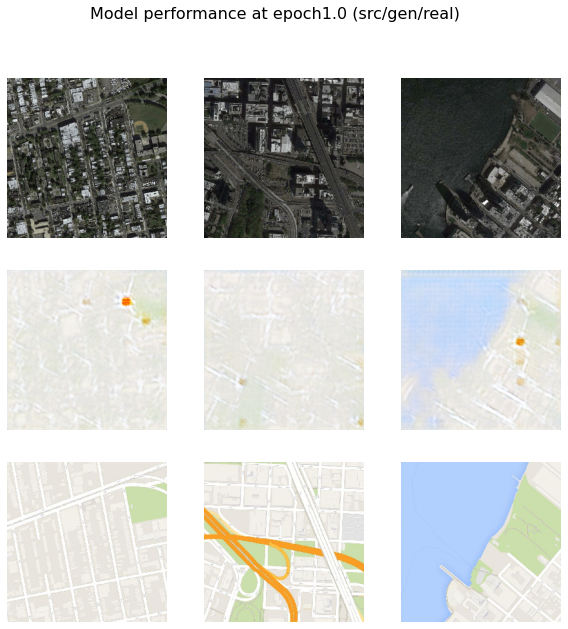

>Saved: plot_epoch1.0.png and model_epoch1.0.h5
step1097: d_loss_real[0.181] d_loss_fake[0.154] gan_loss[11.148]
step1098: d_loss_real[0.093] d_loss_fake[0.221] gan_loss[8.800]
step1099: d_loss_real[0.017] d_loss_fake[0.183] gan_loss[12.020]
step1100: d_loss_real[0.098] d_loss_fake[0.096] gan_loss[19.342]
step1101: d_loss_real[0.683] d_loss_fake[0.502] gan_loss[8.919]
step1102: d_loss_real[0.217] d_loss_fake[0.159] gan_loss[13.078]
step1103: d_loss_real[0.212] d_loss_fake[0.464] gan_loss[8.603]
step1104: d_loss_real[0.167] d_loss_fake[0.149] gan_loss[8.347]
step1105: d_loss_real[0.130] d_loss_fake[0.211] gan_loss[9.407]
step1106: d_loss_real[0.030] d_loss_fake[0.105] gan_loss[19.328]
step1107: d_loss_real[0.029] d_loss_fake[0.084] gan_loss[13.405]
step1108: d_loss_real[0.105] d_loss_fake[0.085] gan_loss[11.545]
step1109: d_loss_real[0.151] d_loss_fake[0.132] gan_loss[20.158]
step1110: d_loss_real[0.027] d_loss_fake[0.116] gan_loss[10.489]
step1111: d_loss_real[0.009] d_loss_fake[0.086]

step1221: d_loss_real[0.031] d_loss_fake[0.075] gan_loss[10.198]
step1222: d_loss_real[0.706] d_loss_fake[0.125] gan_loss[9.942]
step1223: d_loss_real[0.319] d_loss_fake[0.203] gan_loss[8.035]
step1224: d_loss_real[0.009] d_loss_fake[0.219] gan_loss[9.438]
step1225: d_loss_real[0.001] d_loss_fake[0.125] gan_loss[14.233]
step1226: d_loss_real[0.089] d_loss_fake[0.103] gan_loss[10.737]
step1227: d_loss_real[0.195] d_loss_fake[0.116] gan_loss[8.755]
step1228: d_loss_real[0.076] d_loss_fake[0.201] gan_loss[9.195]
step1229: d_loss_real[0.011] d_loss_fake[0.271] gan_loss[17.349]
step1230: d_loss_real[0.001] d_loss_fake[0.056] gan_loss[30.563]
step1231: d_loss_real[0.004] d_loss_fake[0.077] gan_loss[15.912]
step1232: d_loss_real[0.379] d_loss_fake[0.197] gan_loss[13.156]
step1233: d_loss_real[0.008] d_loss_fake[0.059] gan_loss[14.297]
step1234: d_loss_real[0.048] d_loss_fake[0.063] gan_loss[11.150]
step1235: d_loss_real[0.519] d_loss_fake[0.063] gan_loss[9.492]
step1236: d_loss_real[0.372] d_

step1348: d_loss_real[0.001] d_loss_fake[0.072] gan_loss[19.729]
step1349: d_loss_real[0.711] d_loss_fake[0.179] gan_loss[7.913]
step1350: d_loss_real[0.001] d_loss_fake[0.116] gan_loss[13.537]
step1351: d_loss_real[0.204] d_loss_fake[0.095] gan_loss[15.048]
step1352: d_loss_real[0.099] d_loss_fake[0.288] gan_loss[13.640]
step1353: d_loss_real[0.155] d_loss_fake[0.170] gan_loss[12.620]
step1354: d_loss_real[0.002] d_loss_fake[0.095] gan_loss[13.312]
step1355: d_loss_real[0.003] d_loss_fake[0.096] gan_loss[13.434]
step1356: d_loss_real[0.417] d_loss_fake[0.183] gan_loss[8.526]
step1357: d_loss_real[0.003] d_loss_fake[0.143] gan_loss[11.384]
step1358: d_loss_real[0.007] d_loss_fake[0.111] gan_loss[22.106]
step1359: d_loss_real[0.463] d_loss_fake[0.143] gan_loss[8.151]
step1360: d_loss_real[0.237] d_loss_fake[0.308] gan_loss[7.975]
step1361: d_loss_real[0.004] d_loss_fake[0.147] gan_loss[18.342]
step1362: d_loss_real[0.004] d_loss_fake[0.111] gan_loss[15.415]
step1363: d_loss_real[0.005] 

step1475: d_loss_real[0.090] d_loss_fake[0.187] gan_loss[10.531]
step1476: d_loss_real[0.022] d_loss_fake[0.134] gan_loss[11.223]
step1477: d_loss_real[0.003] d_loss_fake[0.085] gan_loss[13.678]
step1478: d_loss_real[0.037] d_loss_fake[0.059] gan_loss[9.910]
step1479: d_loss_real[0.165] d_loss_fake[0.086] gan_loss[10.536]
step1480: d_loss_real[0.003] d_loss_fake[0.054] gan_loss[14.705]
step1481: d_loss_real[0.101] d_loss_fake[0.088] gan_loss[14.870]
step1482: d_loss_real[0.027] d_loss_fake[0.090] gan_loss[11.441]
step1483: d_loss_real[0.604] d_loss_fake[0.811] gan_loss[13.567]
step1484: d_loss_real[0.636] d_loss_fake[0.200] gan_loss[8.120]
step1485: d_loss_real[0.003] d_loss_fake[0.314] gan_loss[13.183]
step1486: d_loss_real[0.181] d_loss_fake[0.185] gan_loss[8.240]
step1487: d_loss_real[0.317] d_loss_fake[0.290] gan_loss[9.421]
step1488: d_loss_real[0.137] d_loss_fake[0.177] gan_loss[10.654]
step1489: d_loss_real[0.002] d_loss_fake[0.100] gan_loss[13.870]
step1490: d_loss_real[0.356] 

step1602: d_loss_real[0.017] d_loss_fake[0.280] gan_loss[11.540]
step1603: d_loss_real[0.234] d_loss_fake[0.207] gan_loss[10.103]
step1604: d_loss_real[0.003] d_loss_fake[0.124] gan_loss[12.412]
step1605: d_loss_real[0.097] d_loss_fake[0.116] gan_loss[12.242]
step1606: d_loss_real[0.465] d_loss_fake[0.259] gan_loss[14.915]
step1607: d_loss_real[0.007] d_loss_fake[0.156] gan_loss[11.244]
step1608: d_loss_real[0.003] d_loss_fake[0.150] gan_loss[19.729]
step1609: d_loss_real[0.394] d_loss_fake[0.151] gan_loss[10.633]
step1610: d_loss_real[0.069] d_loss_fake[0.150] gan_loss[10.816]
step1611: d_loss_real[0.002] d_loss_fake[0.105] gan_loss[17.774]
step1612: d_loss_real[0.014] d_loss_fake[0.076] gan_loss[10.850]
step1613: d_loss_real[0.004] d_loss_fake[0.060] gan_loss[15.605]
step1614: d_loss_real[0.151] d_loss_fake[0.324] gan_loss[9.009]
step1615: d_loss_real[0.039] d_loss_fake[0.050] gan_loss[10.307]
step1616: d_loss_real[0.200] d_loss_fake[0.129] gan_loss[14.816]
step1617: d_loss_real[0.35

step1729: d_loss_real[0.230] d_loss_fake[0.278] gan_loss[7.268]
step1730: d_loss_real[0.009] d_loss_fake[0.194] gan_loss[10.367]
step1731: d_loss_real[0.457] d_loss_fake[0.231] gan_loss[7.293]
step1732: d_loss_real[0.281] d_loss_fake[0.268] gan_loss[6.770]
step1733: d_loss_real[0.152] d_loss_fake[0.210] gan_loss[10.058]
step1734: d_loss_real[0.168] d_loss_fake[0.176] gan_loss[8.433]
step1735: d_loss_real[0.159] d_loss_fake[0.200] gan_loss[8.726]
step1736: d_loss_real[0.003] d_loss_fake[0.178] gan_loss[12.313]
step1737: d_loss_real[0.034] d_loss_fake[0.210] gan_loss[9.933]
step1738: d_loss_real[0.137] d_loss_fake[0.107] gan_loss[12.031]
step1739: d_loss_real[0.009] d_loss_fake[0.104] gan_loss[16.650]
step1740: d_loss_real[0.049] d_loss_fake[0.082] gan_loss[14.434]
step1741: d_loss_real[0.414] d_loss_fake[0.233] gan_loss[8.046]
step1742: d_loss_real[0.175] d_loss_fake[0.320] gan_loss[8.154]
step1743: d_loss_real[0.006] d_loss_fake[0.141] gan_loss[14.005]
step1744: d_loss_real[0.328] d_lo

step1856: d_loss_real[0.049] d_loss_fake[0.205] gan_loss[9.221]
step1857: d_loss_real[0.750] d_loss_fake[0.280] gan_loss[7.994]
step1858: d_loss_real[0.131] d_loss_fake[0.349] gan_loss[12.881]
step1859: d_loss_real[0.024] d_loss_fake[0.091] gan_loss[22.329]
step1860: d_loss_real[0.432] d_loss_fake[0.181] gan_loss[9.506]
step1861: d_loss_real[0.500] d_loss_fake[0.131] gan_loss[9.356]
step1862: d_loss_real[0.587] d_loss_fake[0.236] gan_loss[11.067]
step1863: d_loss_real[0.072] d_loss_fake[0.161] gan_loss[9.550]
step1864: d_loss_real[0.014] d_loss_fake[0.211] gan_loss[13.091]
step1865: d_loss_real[0.180] d_loss_fake[0.454] gan_loss[11.509]
step1866: d_loss_real[0.049] d_loss_fake[0.114] gan_loss[11.151]
step1867: d_loss_real[0.319] d_loss_fake[0.122] gan_loss[8.030]
step1868: d_loss_real[0.135] d_loss_fake[0.116] gan_loss[17.547]
step1869: d_loss_real[0.244] d_loss_fake[0.092] gan_loss[24.345]
step1870: d_loss_real[0.066] d_loss_fake[0.362] gan_loss[8.326]
step1871: d_loss_real[0.024] d_l

step1983: d_loss_real[0.002] d_loss_fake[0.114] gan_loss[12.791]
step1984: d_loss_real[0.007] d_loss_fake[0.092] gan_loss[10.521]
step1985: d_loss_real[0.468] d_loss_fake[0.187] gan_loss[7.855]
step1986: d_loss_real[0.479] d_loss_fake[0.184] gan_loss[8.738]
step1987: d_loss_real[0.005] d_loss_fake[0.142] gan_loss[9.415]
step1988: d_loss_real[0.003] d_loss_fake[0.135] gan_loss[31.018]
step1989: d_loss_real[0.399] d_loss_fake[0.176] gan_loss[12.342]
step1990: d_loss_real[0.250] d_loss_fake[0.391] gan_loss[7.908]
step1991: d_loss_real[0.546] d_loss_fake[0.270] gan_loss[9.243]
step1992: d_loss_real[0.155] d_loss_fake[0.193] gan_loss[9.027]
step1993: d_loss_real[0.005] d_loss_fake[0.191] gan_loss[18.476]
step1994: d_loss_real[0.573] d_loss_fake[0.182] gan_loss[10.610]
step1995: d_loss_real[0.003] d_loss_fake[0.150] gan_loss[15.324]
step1996: d_loss_real[0.012] d_loss_fake[0.160] gan_loss[9.909]
step1997: d_loss_real[0.004] d_loss_fake[0.097] gan_loss[30.447]
step1998: d_loss_real[0.005] d_l

step2111: d_loss_real[0.549] d_loss_fake[0.276] gan_loss[11.535]
step2112: d_loss_real[0.012] d_loss_fake[0.164] gan_loss[9.699]
step2113: d_loss_real[0.005] d_loss_fake[0.062] gan_loss[21.176]
step2114: d_loss_real[0.693] d_loss_fake[0.614] gan_loss[11.470]
step2115: d_loss_real[0.209] d_loss_fake[0.269] gan_loss[9.644]
step2116: d_loss_real[0.836] d_loss_fake[0.408] gan_loss[11.566]
step2117: d_loss_real[0.065] d_loss_fake[0.132] gan_loss[13.700]
step2118: d_loss_real[0.617] d_loss_fake[0.366] gan_loss[9.893]
step2119: d_loss_real[0.157] d_loss_fake[0.355] gan_loss[9.916]
step2120: d_loss_real[0.698] d_loss_fake[0.194] gan_loss[11.228]
step2121: d_loss_real[0.139] d_loss_fake[0.280] gan_loss[8.980]
step2122: d_loss_real[0.418] d_loss_fake[0.290] gan_loss[7.986]
step2123: d_loss_real[0.004] d_loss_fake[0.103] gan_loss[17.753]
step2124: d_loss_real[0.313] d_loss_fake[0.107] gan_loss[9.452]
step2125: d_loss_real[0.228] d_loss_fake[0.404] gan_loss[9.859]
step2126: d_loss_real[0.381] d_lo

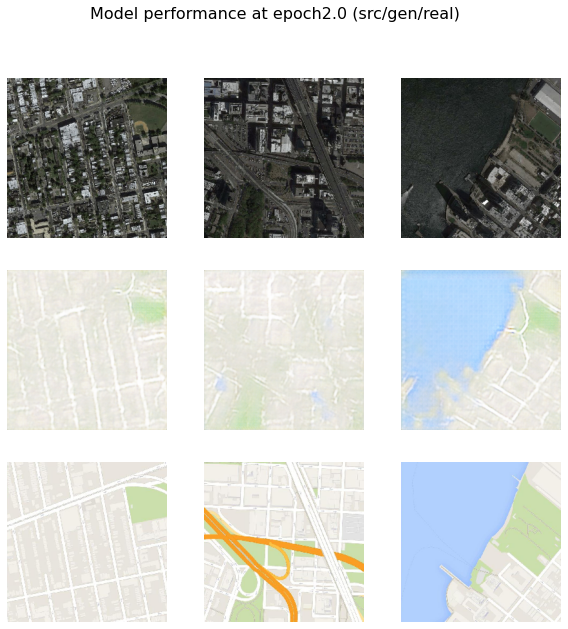

>Saved: plot_epoch2.0.png and model_epoch2.0.h5
step2193: d_loss_real[0.166] d_loss_fake[0.246] gan_loss[12.453]
step2194: d_loss_real[0.133] d_loss_fake[0.207] gan_loss[8.483]
step2195: d_loss_real[0.034] d_loss_fake[0.206] gan_loss[12.797]
step2196: d_loss_real[0.131] d_loss_fake[0.170] gan_loss[12.861]
step2197: d_loss_real[0.006] d_loss_fake[0.168] gan_loss[18.121]
step2198: d_loss_real[0.512] d_loss_fake[0.190] gan_loss[6.985]
step2199: d_loss_real[0.071] d_loss_fake[0.179] gan_loss[8.717]
step2200: d_loss_real[0.003] d_loss_fake[0.104] gan_loss[13.238]
step2201: d_loss_real[0.004] d_loss_fake[0.071] gan_loss[18.537]
step2202: d_loss_real[0.261] d_loss_fake[0.296] gan_loss[6.155]
step2203: d_loss_real[0.137] d_loss_fake[0.340] gan_loss[6.124]
step2204: d_loss_real[0.581] d_loss_fake[0.158] gan_loss[9.372]
step2205: d_loss_real[0.009] d_loss_fake[0.117] gan_loss[10.551]
step2206: d_loss_real[0.048] d_loss_fake[0.255] gan_loss[6.223]
step2207: d_loss_real[0.008] d_loss_fake[0.052] g

step2317: d_loss_real[0.207] d_loss_fake[0.390] gan_loss[8.240]
step2318: d_loss_real[0.235] d_loss_fake[0.375] gan_loss[6.656]
step2319: d_loss_real[0.010] d_loss_fake[0.085] gan_loss[11.790]
step2320: d_loss_real[0.032] d_loss_fake[0.134] gan_loss[14.253]
step2321: d_loss_real[0.260] d_loss_fake[0.112] gan_loss[8.728]
step2322: d_loss_real[0.166] d_loss_fake[0.206] gan_loss[5.271]
step2323: d_loss_real[0.187] d_loss_fake[0.224] gan_loss[8.946]
step2324: d_loss_real[0.005] d_loss_fake[0.077] gan_loss[17.797]
step2325: d_loss_real[0.446] d_loss_fake[0.167] gan_loss[8.114]
step2326: d_loss_real[0.206] d_loss_fake[0.169] gan_loss[8.027]
step2327: d_loss_real[0.079] d_loss_fake[0.100] gan_loss[7.197]
step2328: d_loss_real[0.031] d_loss_fake[0.226] gan_loss[7.967]
step2329: d_loss_real[0.060] d_loss_fake[0.108] gan_loss[16.861]
step2330: d_loss_real[0.004] d_loss_fake[0.149] gan_loss[11.600]
step2331: d_loss_real[0.246] d_loss_fake[0.239] gan_loss[8.497]
step2332: d_loss_real[0.677] d_loss

step2444: d_loss_real[0.056] d_loss_fake[0.184] gan_loss[16.522]
step2445: d_loss_real[0.045] d_loss_fake[0.159] gan_loss[28.355]
step2446: d_loss_real[0.111] d_loss_fake[0.103] gan_loss[14.458]
step2447: d_loss_real[0.129] d_loss_fake[0.108] gan_loss[8.219]
step2448: d_loss_real[0.480] d_loss_fake[0.100] gan_loss[10.398]
step2449: d_loss_real[0.193] d_loss_fake[0.167] gan_loss[7.529]
step2450: d_loss_real[0.134] d_loss_fake[0.283] gan_loss[8.732]
step2451: d_loss_real[0.210] d_loss_fake[0.277] gan_loss[11.870]
step2452: d_loss_real[0.082] d_loss_fake[0.166] gan_loss[9.056]
step2453: d_loss_real[0.247] d_loss_fake[0.229] gan_loss[8.315]
step2454: d_loss_real[0.141] d_loss_fake[0.198] gan_loss[6.896]
step2455: d_loss_real[0.012] d_loss_fake[0.138] gan_loss[18.347]
step2456: d_loss_real[0.011] d_loss_fake[0.093] gan_loss[20.451]
step2457: d_loss_real[0.018] d_loss_fake[0.104] gan_loss[12.688]
step2458: d_loss_real[0.010] d_loss_fake[0.078] gan_loss[23.051]
step2459: d_loss_real[0.021] d_

step2572: d_loss_real[0.178] d_loss_fake[0.109] gan_loss[22.762]
step2573: d_loss_real[0.168] d_loss_fake[0.128] gan_loss[9.638]
step2574: d_loss_real[0.004] d_loss_fake[0.157] gan_loss[15.765]
step2575: d_loss_real[0.005] d_loss_fake[0.137] gan_loss[13.467]
step2576: d_loss_real[0.204] d_loss_fake[0.104] gan_loss[9.756]
step2577: d_loss_real[0.934] d_loss_fake[0.174] gan_loss[7.322]
step2578: d_loss_real[0.113] d_loss_fake[0.240] gan_loss[6.732]
step2579: d_loss_real[0.157] d_loss_fake[0.236] gan_loss[7.147]
step2580: d_loss_real[0.007] d_loss_fake[0.146] gan_loss[16.581]
step2581: d_loss_real[0.458] d_loss_fake[0.203] gan_loss[7.469]
step2582: d_loss_real[0.012] d_loss_fake[0.171] gan_loss[14.513]
step2583: d_loss_real[0.291] d_loss_fake[0.333] gan_loss[7.545]
step2584: d_loss_real[0.407] d_loss_fake[0.461] gan_loss[8.567]
step2585: d_loss_real[0.004] d_loss_fake[0.111] gan_loss[27.714]
step2586: d_loss_real[0.241] d_loss_fake[0.180] gan_loss[8.860]
step2587: d_loss_real[0.288] d_los

step2700: d_loss_real[0.215] d_loss_fake[0.261] gan_loss[7.488]
step2701: d_loss_real[0.005] d_loss_fake[0.161] gan_loss[27.657]
step2702: d_loss_real[0.021] d_loss_fake[0.122] gan_loss[11.208]
step2703: d_loss_real[0.211] d_loss_fake[0.107] gan_loss[11.760]
step2704: d_loss_real[0.008] d_loss_fake[0.121] gan_loss[12.007]
step2705: d_loss_real[0.499] d_loss_fake[0.195] gan_loss[7.455]
step2706: d_loss_real[0.004] d_loss_fake[0.123] gan_loss[10.673]
step2707: d_loss_real[0.007] d_loss_fake[0.124] gan_loss[9.297]
step2708: d_loss_real[0.006] d_loss_fake[0.073] gan_loss[12.838]
step2709: d_loss_real[0.206] d_loss_fake[0.103] gan_loss[10.566]
step2710: d_loss_real[0.006] d_loss_fake[0.092] gan_loss[11.749]
step2711: d_loss_real[0.294] d_loss_fake[0.256] gan_loss[8.298]
step2712: d_loss_real[0.288] d_loss_fake[0.226] gan_loss[8.447]
step2713: d_loss_real[0.007] d_loss_fake[0.144] gan_loss[14.889]
step2714: d_loss_real[0.076] d_loss_fake[0.135] gan_loss[5.469]
step2715: d_loss_real[0.006] d_

step2827: d_loss_real[0.018] d_loss_fake[0.151] gan_loss[11.710]
step2828: d_loss_real[0.468] d_loss_fake[0.245] gan_loss[6.147]
step2829: d_loss_real[0.399] d_loss_fake[0.383] gan_loss[9.209]
step2830: d_loss_real[0.009] d_loss_fake[0.201] gan_loss[12.697]
step2831: d_loss_real[0.714] d_loss_fake[0.122] gan_loss[7.030]
step2832: d_loss_real[0.006] d_loss_fake[0.118] gan_loss[26.628]
step2833: d_loss_real[0.011] d_loss_fake[0.118] gan_loss[16.292]
step2834: d_loss_real[0.413] d_loss_fake[0.280] gan_loss[12.679]
step2835: d_loss_real[0.680] d_loss_fake[0.441] gan_loss[6.822]
step2836: d_loss_real[0.231] d_loss_fake[0.140] gan_loss[7.593]
step2837: d_loss_real[0.420] d_loss_fake[0.171] gan_loss[5.910]
step2838: d_loss_real[0.005] d_loss_fake[0.225] gan_loss[20.621]
step2839: d_loss_real[0.031] d_loss_fake[0.179] gan_loss[14.464]
step2840: d_loss_real[0.238] d_loss_fake[0.264] gan_loss[8.970]
step2841: d_loss_real[0.086] d_loss_fake[0.144] gan_loss[13.011]
step2842: d_loss_real[0.285] d_l

step2954: d_loss_real[0.622] d_loss_fake[0.392] gan_loss[9.810]
step2955: d_loss_real[0.013] d_loss_fake[0.089] gan_loss[10.697]
step2956: d_loss_real[0.354] d_loss_fake[0.174] gan_loss[9.400]
step2957: d_loss_real[0.436] d_loss_fake[0.800] gan_loss[7.940]
step2958: d_loss_real[0.195] d_loss_fake[0.635] gan_loss[9.864]
step2959: d_loss_real[0.150] d_loss_fake[0.178] gan_loss[9.035]
step2960: d_loss_real[0.018] d_loss_fake[0.072] gan_loss[12.883]
step2961: d_loss_real[0.782] d_loss_fake[0.145] gan_loss[8.654]
step2962: d_loss_real[0.019] d_loss_fake[0.264] gan_loss[12.866]
step2963: d_loss_real[0.394] d_loss_fake[0.197] gan_loss[9.245]
step2964: d_loss_real[0.149] d_loss_fake[0.187] gan_loss[9.302]
step2965: d_loss_real[0.314] d_loss_fake[0.180] gan_loss[11.152]
step2966: d_loss_real[0.014] d_loss_fake[0.202] gan_loss[14.203]
step2967: d_loss_real[0.376] d_loss_fake[0.240] gan_loss[10.488]
step2968: d_loss_real[0.310] d_loss_fake[0.249] gan_loss[9.685]
step2969: d_loss_real[0.075] d_los

step3082: d_loss_real[0.527] d_loss_fake[0.143] gan_loss[7.690]
step3083: d_loss_real[0.012] d_loss_fake[0.106] gan_loss[14.651]
step3084: d_loss_real[0.255] d_loss_fake[0.311] gan_loss[5.297]
step3085: d_loss_real[0.164] d_loss_fake[0.159] gan_loss[8.038]
step3086: d_loss_real[0.016] d_loss_fake[0.082] gan_loss[17.438]
step3087: d_loss_real[0.250] d_loss_fake[0.248] gan_loss[7.386]
step3088: d_loss_real[0.011] d_loss_fake[0.139] gan_loss[13.010]
step3089: d_loss_real[0.364] d_loss_fake[0.166] gan_loss[7.436]
step3090: d_loss_real[0.399] d_loss_fake[0.307] gan_loss[7.738]
step3091: d_loss_real[0.009] d_loss_fake[0.149] gan_loss[11.178]
step3092: d_loss_real[0.307] d_loss_fake[0.390] gan_loss[7.465]
step3093: d_loss_real[0.019] d_loss_fake[0.081] gan_loss[10.283]
step3094: d_loss_real[0.773] d_loss_fake[0.295] gan_loss[8.114]
step3095: d_loss_real[0.012] d_loss_fake[0.093] gan_loss[10.364]
step3096: d_loss_real[0.214] d_loss_fake[0.130] gan_loss[8.910]
step3097: d_loss_real[0.021] d_los

step3210: d_loss_real[0.318] d_loss_fake[0.107] gan_loss[11.424]
step3211: d_loss_real[0.016] d_loss_fake[0.107] gan_loss[26.260]
step3212: d_loss_real[0.011] d_loss_fake[0.128] gan_loss[12.295]
step3213: d_loss_real[0.390] d_loss_fake[0.311] gan_loss[7.879]
step3214: d_loss_real[0.123] d_loss_fake[0.097] gan_loss[14.958]
step3215: d_loss_real[0.128] d_loss_fake[0.184] gan_loss[9.208]
step3216: d_loss_real[0.010] d_loss_fake[0.086] gan_loss[12.889]
step3217: d_loss_real[0.400] d_loss_fake[0.157] gan_loss[9.200]
step3218: d_loss_real[0.015] d_loss_fake[0.115] gan_loss[18.247]
step3219: d_loss_real[0.303] d_loss_fake[0.409] gan_loss[8.585]
step3220: d_loss_real[0.014] d_loss_fake[0.077] gan_loss[13.229]
step3221: d_loss_real[0.353] d_loss_fake[0.111] gan_loss[8.568]
step3222: d_loss_real[0.365] d_loss_fake[0.314] gan_loss[13.276]
step3223: d_loss_real[0.055] d_loss_fake[0.411] gan_loss[8.484]
step3224: d_loss_real[0.319] d_loss_fake[0.184] gan_loss[10.887]
step3225: d_loss_real[0.399] d_

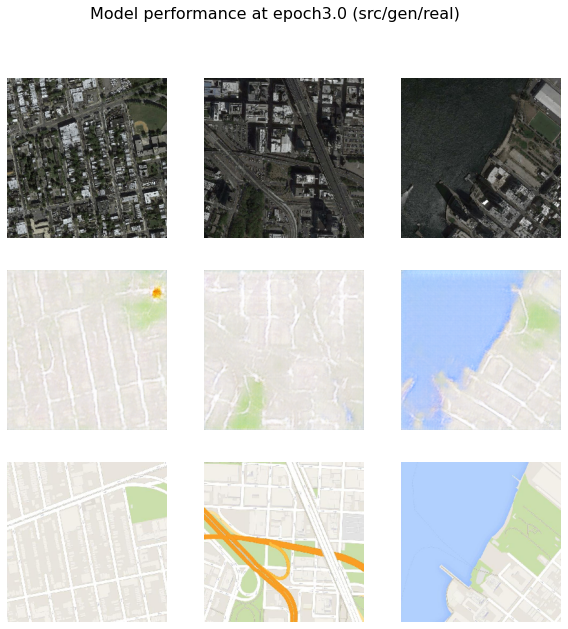

>Saved: plot_epoch3.0.png and model_epoch3.0.h5
step3289: d_loss_real[0.044] d_loss_fake[0.215] gan_loss[13.007]
step3290: d_loss_real[0.066] d_loss_fake[0.102] gan_loss[13.495]
step3291: d_loss_real[0.114] d_loss_fake[0.175] gan_loss[10.541]
step3292: d_loss_real[0.144] d_loss_fake[0.429] gan_loss[5.134]
step3293: d_loss_real[0.375] d_loss_fake[0.413] gan_loss[10.827]
step3294: d_loss_real[0.362] d_loss_fake[0.258] gan_loss[9.041]
step3295: d_loss_real[0.253] d_loss_fake[0.101] gan_loss[10.397]
step3296: d_loss_real[0.469] d_loss_fake[0.133] gan_loss[15.378]
step3297: d_loss_real[0.067] d_loss_fake[0.488] gan_loss[8.092]
step3298: d_loss_real[0.422] d_loss_fake[0.181] gan_loss[12.068]
step3299: d_loss_real[0.427] d_loss_fake[0.235] gan_loss[7.396]
step3300: d_loss_real[0.029] d_loss_fake[0.130] gan_loss[11.968]
step3301: d_loss_real[0.417] d_loss_fake[0.217] gan_loss[12.907]
step3302: d_loss_real[0.197] d_loss_fake[0.317] gan_loss[8.736]
step3303: d_loss_real[0.214] d_loss_fake[0.371]

step3413: d_loss_real[0.043] d_loss_fake[0.249] gan_loss[8.680]
step3414: d_loss_real[0.011] d_loss_fake[0.134] gan_loss[17.944]
step3415: d_loss_real[0.036] d_loss_fake[0.108] gan_loss[14.434]
step3416: d_loss_real[0.049] d_loss_fake[0.078] gan_loss[16.548]
step3417: d_loss_real[0.137] d_loss_fake[0.102] gan_loss[10.275]
step3418: d_loss_real[0.315] d_loss_fake[0.152] gan_loss[10.784]
step3419: d_loss_real[0.098] d_loss_fake[0.250] gan_loss[8.987]
step3420: d_loss_real[0.196] d_loss_fake[0.204] gan_loss[9.709]
step3421: d_loss_real[0.270] d_loss_fake[0.161] gan_loss[16.424]
step3422: d_loss_real[0.168] d_loss_fake[0.338] gan_loss[11.819]
step3423: d_loss_real[0.013] d_loss_fake[0.131] gan_loss[19.537]
step3424: d_loss_real[0.845] d_loss_fake[0.108] gan_loss[12.884]
step3425: d_loss_real[0.194] d_loss_fake[0.153] gan_loss[20.303]
step3426: d_loss_real[0.243] d_loss_fake[0.216] gan_loss[8.605]
step3427: d_loss_real[0.012] d_loss_fake[0.122] gan_loss[21.658]
step3428: d_loss_real[0.013] 

step3541: d_loss_real[0.177] d_loss_fake[0.353] gan_loss[11.383]
step3542: d_loss_real[0.136] d_loss_fake[0.120] gan_loss[10.465]
step3543: d_loss_real[0.080] d_loss_fake[0.090] gan_loss[8.102]
step3544: d_loss_real[0.068] d_loss_fake[0.125] gan_loss[12.934]
step3545: d_loss_real[0.477] d_loss_fake[0.164] gan_loss[23.145]
step3546: d_loss_real[0.021] d_loss_fake[0.346] gan_loss[19.668]
step3547: d_loss_real[0.089] d_loss_fake[0.158] gan_loss[10.968]
step3548: d_loss_real[0.053] d_loss_fake[0.097] gan_loss[12.799]
step3549: d_loss_real[0.283] d_loss_fake[0.192] gan_loss[7.686]
step3550: d_loss_real[0.769] d_loss_fake[0.250] gan_loss[9.103]
step3551: d_loss_real[0.101] d_loss_fake[0.312] gan_loss[8.062]
step3552: d_loss_real[0.112] d_loss_fake[0.143] gan_loss[18.352]
step3553: d_loss_real[0.029] d_loss_fake[0.130] gan_loss[12.055]
step3554: d_loss_real[0.364] d_loss_fake[0.181] gan_loss[9.402]
step3555: d_loss_real[0.123] d_loss_fake[0.125] gan_loss[11.599]
step3556: d_loss_real[0.169] d

step3669: d_loss_real[0.122] d_loss_fake[0.111] gan_loss[19.321]
step3670: d_loss_real[0.325] d_loss_fake[0.322] gan_loss[8.993]
step3671: d_loss_real[0.015] d_loss_fake[0.146] gan_loss[14.051]
step3672: d_loss_real[0.728] d_loss_fake[0.176] gan_loss[7.287]
step3673: d_loss_real[0.110] d_loss_fake[0.246] gan_loss[8.133]
step3674: d_loss_real[0.176] d_loss_fake[0.264] gan_loss[9.263]
step3675: d_loss_real[0.197] d_loss_fake[0.137] gan_loss[8.567]
step3676: d_loss_real[0.034] d_loss_fake[0.103] gan_loss[13.600]
step3677: d_loss_real[0.171] d_loss_fake[0.267] gan_loss[9.297]
step3678: d_loss_real[0.856] d_loss_fake[0.153] gan_loss[6.551]
step3679: d_loss_real[0.677] d_loss_fake[0.313] gan_loss[3.295]
step3680: d_loss_real[0.011] d_loss_fake[0.261] gan_loss[10.147]
step3681: d_loss_real[0.009] d_loss_fake[0.150] gan_loss[15.120]
step3682: d_loss_real[0.480] d_loss_fake[0.222] gan_loss[10.386]
step3683: d_loss_real[0.012] d_loss_fake[0.191] gan_loss[10.515]
step3684: d_loss_real[0.206] d_lo

step3797: d_loss_real[0.155] d_loss_fake[0.434] gan_loss[6.256]
step3798: d_loss_real[0.127] d_loss_fake[0.240] gan_loss[7.668]
step3799: d_loss_real[0.013] d_loss_fake[0.140] gan_loss[16.948]
step3800: d_loss_real[0.022] d_loss_fake[0.079] gan_loss[12.832]
step3801: d_loss_real[0.254] d_loss_fake[0.124] gan_loss[7.295]
step3802: d_loss_real[0.573] d_loss_fake[0.289] gan_loss[5.243]
step3803: d_loss_real[0.027] d_loss_fake[0.208] gan_loss[14.441]
step3804: d_loss_real[0.203] d_loss_fake[0.182] gan_loss[10.156]
step3805: d_loss_real[0.019] d_loss_fake[0.162] gan_loss[11.327]
step3806: d_loss_real[0.228] d_loss_fake[0.289] gan_loss[6.324]
step3807: d_loss_real[0.028] d_loss_fake[0.087] gan_loss[14.929]
step3808: d_loss_real[0.024] d_loss_fake[0.089] gan_loss[11.595]
step3809: d_loss_real[0.322] d_loss_fake[0.094] gan_loss[8.461]
step3810: d_loss_real[0.156] d_loss_fake[0.157] gan_loss[8.629]
step3811: d_loss_real[0.014] d_loss_fake[0.117] gan_loss[12.446]
step3812: d_loss_real[0.236] d_l

step3925: d_loss_real[0.169] d_loss_fake[0.264] gan_loss[10.893]
step3926: d_loss_real[0.074] d_loss_fake[0.083] gan_loss[14.174]
step3927: d_loss_real[0.018] d_loss_fake[0.136] gan_loss[12.506]
step3928: d_loss_real[0.014] d_loss_fake[0.080] gan_loss[17.939]
step3929: d_loss_real[0.283] d_loss_fake[0.118] gan_loss[8.483]
step3930: d_loss_real[0.033] d_loss_fake[0.121] gan_loss[11.148]
step3931: d_loss_real[0.050] d_loss_fake[0.115] gan_loss[10.446]
step3932: d_loss_real[0.141] d_loss_fake[0.141] gan_loss[7.992]
step3933: d_loss_real[0.430] d_loss_fake[0.344] gan_loss[6.402]
step3934: d_loss_real[0.029] d_loss_fake[0.170] gan_loss[17.982]
step3935: d_loss_real[0.027] d_loss_fake[0.097] gan_loss[12.607]
step3936: d_loss_real[0.021] d_loss_fake[0.101] gan_loss[15.932]
step3937: d_loss_real[0.539] d_loss_fake[0.091] gan_loss[8.765]
step3938: d_loss_real[0.749] d_loss_fake[0.430] gan_loss[7.993]
step3939: d_loss_real[0.215] d_loss_fake[0.438] gan_loss[10.207]
step3940: d_loss_real[0.015] d

step4052: d_loss_real[0.222] d_loss_fake[0.108] gan_loss[11.572]
step4053: d_loss_real[0.129] d_loss_fake[0.279] gan_loss[8.192]
step4054: d_loss_real[0.291] d_loss_fake[0.239] gan_loss[8.624]
step4055: d_loss_real[0.048] d_loss_fake[0.132] gan_loss[15.673]
step4056: d_loss_real[0.024] d_loss_fake[0.083] gan_loss[15.099]
step4057: d_loss_real[0.344] d_loss_fake[0.174] gan_loss[12.941]
step4058: d_loss_real[0.300] d_loss_fake[0.734] gan_loss[10.055]
step4059: d_loss_real[0.025] d_loss_fake[0.461] gan_loss[16.429]
step4060: d_loss_real[0.506] d_loss_fake[0.109] gan_loss[8.293]
step4061: d_loss_real[0.816] d_loss_fake[0.274] gan_loss[6.717]
step4062: d_loss_real[0.069] d_loss_fake[0.163] gan_loss[15.482]
step4063: d_loss_real[0.105] d_loss_fake[0.484] gan_loss[6.970]
step4064: d_loss_real[0.475] d_loss_fake[0.604] gan_loss[7.988]
step4065: d_loss_real[0.544] d_loss_fake[0.165] gan_loss[8.305]
step4066: d_loss_real[0.150] d_loss_fake[0.205] gan_loss[10.473]
step4067: d_loss_real[0.399] d_l

step4180: d_loss_real[0.010] d_loss_fake[0.111] gan_loss[14.804]
step4181: d_loss_real[0.069] d_loss_fake[0.095] gan_loss[5.015]
step4182: d_loss_real[0.017] d_loss_fake[0.099] gan_loss[20.321]
step4183: d_loss_real[0.452] d_loss_fake[0.139] gan_loss[8.859]
step4184: d_loss_real[0.011] d_loss_fake[0.170] gan_loss[25.517]
step4185: d_loss_real[0.196] d_loss_fake[0.148] gan_loss[11.163]
step4186: d_loss_real[0.013] d_loss_fake[0.186] gan_loss[14.775]
step4187: d_loss_real[0.551] d_loss_fake[0.153] gan_loss[10.789]
step4188: d_loss_real[0.351] d_loss_fake[0.327] gan_loss[9.310]
step4189: d_loss_real[0.170] d_loss_fake[0.287] gan_loss[9.685]
step4190: d_loss_real[0.282] d_loss_fake[0.185] gan_loss[8.222]
step4191: d_loss_real[0.205] d_loss_fake[0.200] gan_loss[8.947]
step4192: d_loss_real[0.013] d_loss_fake[0.121] gan_loss[16.299]
step4193: d_loss_real[0.255] d_loss_fake[0.185] gan_loss[5.141]
step4194: d_loss_real[0.210] d_loss_fake[0.233] gan_loss[8.054]
step4195: d_loss_real[0.132] d_lo

step4308: d_loss_real[0.025] d_loss_fake[0.150] gan_loss[12.690]
step4309: d_loss_real[0.041] d_loss_fake[0.146] gan_loss[12.987]
step4310: d_loss_real[0.188] d_loss_fake[0.158] gan_loss[8.385]
step4311: d_loss_real[0.363] d_loss_fake[0.291] gan_loss[5.682]
step4312: d_loss_real[0.013] d_loss_fake[0.127] gan_loss[19.524]
step4313: d_loss_real[0.080] d_loss_fake[0.124] gan_loss[9.714]
step4314: d_loss_real[0.305] d_loss_fake[0.218] gan_loss[10.481]
step4315: d_loss_real[0.156] d_loss_fake[0.143] gan_loss[9.752]
step4316: d_loss_real[0.028] d_loss_fake[0.173] gan_loss[14.665]
step4317: d_loss_real[0.556] d_loss_fake[0.211] gan_loss[10.349]
step4318: d_loss_real[0.027] d_loss_fake[0.239] gan_loss[13.115]
step4319: d_loss_real[0.301] d_loss_fake[0.165] gan_loss[7.561]
step4320: d_loss_real[0.544] d_loss_fake[0.280] gan_loss[9.224]
step4321: d_loss_real[0.014] d_loss_fake[0.193] gan_loss[13.205]
step4322: d_loss_real[0.275] d_loss_fake[0.138] gan_loss[8.023]
step4323: d_loss_real[0.279] d_l

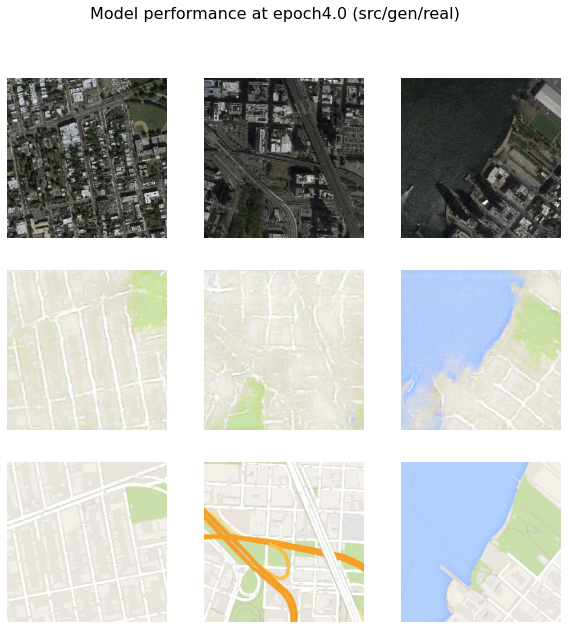

>Saved: plot_epoch4.0.png and model_epoch4.0.h5
step4385: d_loss_real[0.175] d_loss_fake[0.130] gan_loss[11.502]
step4386: d_loss_real[0.295] d_loss_fake[0.287] gan_loss[7.816]
step4387: d_loss_real[0.051] d_loss_fake[0.095] gan_loss[12.727]
step4388: d_loss_real[0.041] d_loss_fake[0.061] gan_loss[13.386]
step4389: d_loss_real[0.017] d_loss_fake[0.085] gan_loss[13.068]
step4390: d_loss_real[0.241] d_loss_fake[0.131] gan_loss[8.271]
step4391: d_loss_real[0.407] d_loss_fake[0.203] gan_loss[11.037]
step4392: d_loss_real[0.220] d_loss_fake[0.373] gan_loss[7.385]
step4393: d_loss_real[0.075] d_loss_fake[0.193] gan_loss[8.477]
step4394: d_loss_real[0.217] d_loss_fake[0.200] gan_loss[7.797]
step4395: d_loss_real[0.021] d_loss_fake[0.121] gan_loss[15.642]
step4396: d_loss_real[0.161] d_loss_fake[0.101] gan_loss[10.387]
step4397: d_loss_real[0.012] d_loss_fake[0.087] gan_loss[12.785]
step4398: d_loss_real[0.021] d_loss_fake[0.059] gan_loss[16.097]
step4399: d_loss_real[0.085] d_loss_fake[0.070]

step4509: d_loss_real[0.292] d_loss_fake[0.176] gan_loss[10.487]
step4510: d_loss_real[0.313] d_loss_fake[0.237] gan_loss[7.678]
step4511: d_loss_real[0.344] d_loss_fake[0.248] gan_loss[13.796]
step4512: d_loss_real[0.297] d_loss_fake[0.295] gan_loss[15.887]
step4513: d_loss_real[0.014] d_loss_fake[0.195] gan_loss[10.431]
step4514: d_loss_real[0.123] d_loss_fake[0.245] gan_loss[14.410]
step4515: d_loss_real[0.039] d_loss_fake[0.062] gan_loss[12.172]
step4516: d_loss_real[0.697] d_loss_fake[0.402] gan_loss[15.181]
step4517: d_loss_real[0.220] d_loss_fake[0.169] gan_loss[11.161]
step4518: d_loss_real[0.226] d_loss_fake[0.148] gan_loss[9.469]
step4519: d_loss_real[0.129] d_loss_fake[0.235] gan_loss[12.421]
step4520: d_loss_real[0.220] d_loss_fake[0.241] gan_loss[8.145]
step4521: d_loss_real[0.357] d_loss_fake[0.217] gan_loss[10.267]
step4522: d_loss_real[0.114] d_loss_fake[0.132] gan_loss[9.149]
step4523: d_loss_real[0.226] d_loss_fake[0.163] gan_loss[8.053]
step4524: d_loss_real[0.089] d

step4637: d_loss_real[0.417] d_loss_fake[0.487] gan_loss[8.008]
step4638: d_loss_real[0.404] d_loss_fake[0.515] gan_loss[5.182]
step4639: d_loss_real[0.237] d_loss_fake[0.171] gan_loss[8.158]
step4640: d_loss_real[0.130] d_loss_fake[0.355] gan_loss[8.486]
step4641: d_loss_real[0.028] d_loss_fake[0.093] gan_loss[12.819]
step4642: d_loss_real[0.031] d_loss_fake[0.113] gan_loss[20.008]
step4643: d_loss_real[0.986] d_loss_fake[0.171] gan_loss[3.575]
step4644: d_loss_real[0.240] d_loss_fake[0.290] gan_loss[7.310]
step4645: d_loss_real[0.061] d_loss_fake[0.348] gan_loss[12.325]
step4646: d_loss_real[0.279] d_loss_fake[0.192] gan_loss[6.789]
step4647: d_loss_real[0.229] d_loss_fake[0.208] gan_loss[7.053]
step4648: d_loss_real[0.441] d_loss_fake[0.233] gan_loss[10.267]
step4649: d_loss_real[0.182] d_loss_fake[0.141] gan_loss[9.045]
step4650: d_loss_real[0.076] d_loss_fake[0.317] gan_loss[7.616]
step4651: d_loss_real[0.416] d_loss_fake[0.109] gan_loss[4.445]
step4652: d_loss_real[0.380] d_loss_

step4765: d_loss_real[0.451] d_loss_fake[0.618] gan_loss[4.264]
step4766: d_loss_real[0.048] d_loss_fake[0.143] gan_loss[11.259]
step4767: d_loss_real[0.194] d_loss_fake[0.159] gan_loss[9.841]
step4768: d_loss_real[0.034] d_loss_fake[0.255] gan_loss[11.035]
step4769: d_loss_real[0.073] d_loss_fake[0.073] gan_loss[14.551]
step4770: d_loss_real[0.441] d_loss_fake[0.222] gan_loss[6.741]
step4771: d_loss_real[0.334] d_loss_fake[0.178] gan_loss[8.853]
step4772: d_loss_real[0.229] d_loss_fake[0.282] gan_loss[8.121]
step4773: d_loss_real[0.086] d_loss_fake[0.202] gan_loss[11.968]
step4774: d_loss_real[0.111] d_loss_fake[0.223] gan_loss[11.183]
step4775: d_loss_real[0.259] d_loss_fake[0.131] gan_loss[8.010]
step4776: d_loss_real[0.024] d_loss_fake[0.099] gan_loss[15.220]
step4777: d_loss_real[0.027] d_loss_fake[0.262] gan_loss[11.603]
step4778: d_loss_real[0.063] d_loss_fake[0.133] gan_loss[12.223]
step4779: d_loss_real[0.582] d_loss_fake[0.150] gan_loss[8.280]
step4780: d_loss_real[0.036] d_l

step4893: d_loss_real[0.148] d_loss_fake[0.096] gan_loss[9.805]
step4894: d_loss_real[0.311] d_loss_fake[0.493] gan_loss[8.660]
step4895: d_loss_real[0.010] d_loss_fake[0.176] gan_loss[15.968]
step4896: d_loss_real[0.043] d_loss_fake[0.088] gan_loss[14.064]
step4897: d_loss_real[0.439] d_loss_fake[0.113] gan_loss[8.756]
step4898: d_loss_real[0.107] d_loss_fake[0.202] gan_loss[14.597]
step4899: d_loss_real[0.112] d_loss_fake[0.262] gan_loss[7.241]
step4900: d_loss_real[0.063] d_loss_fake[0.109] gan_loss[10.137]
step4901: d_loss_real[0.075] d_loss_fake[0.087] gan_loss[10.921]
step4902: d_loss_real[0.272] d_loss_fake[0.165] gan_loss[13.012]
step4903: d_loss_real[0.010] d_loss_fake[0.396] gan_loss[11.994]
step4904: d_loss_real[0.013] d_loss_fake[0.091] gan_loss[19.086]
step4905: d_loss_real[0.188] d_loss_fake[0.163] gan_loss[13.239]
step4906: d_loss_real[0.426] d_loss_fake[0.209] gan_loss[7.997]
step4907: d_loss_real[0.057] d_loss_fake[0.254] gan_loss[10.582]
step4908: d_loss_real[0.011] d

step5020: d_loss_real[0.622] d_loss_fake[0.337] gan_loss[11.786]
step5021: d_loss_real[0.193] d_loss_fake[0.285] gan_loss[11.275]
step5022: d_loss_real[0.685] d_loss_fake[0.226] gan_loss[13.084]
step5023: d_loss_real[0.144] d_loss_fake[0.186] gan_loss[11.572]
step5024: d_loss_real[0.186] d_loss_fake[0.308] gan_loss[7.409]
step5025: d_loss_real[0.268] d_loss_fake[0.168] gan_loss[9.911]
step5026: d_loss_real[0.218] d_loss_fake[0.195] gan_loss[7.813]
step5027: d_loss_real[0.017] d_loss_fake[0.096] gan_loss[15.862]
step5028: d_loss_real[0.010] d_loss_fake[0.072] gan_loss[16.881]
step5029: d_loss_real[0.219] d_loss_fake[0.111] gan_loss[15.595]
step5030: d_loss_real[0.225] d_loss_fake[0.290] gan_loss[7.590]
step5031: d_loss_real[0.102] d_loss_fake[0.214] gan_loss[10.172]
step5032: d_loss_real[0.068] d_loss_fake[0.119] gan_loss[11.648]
step5033: d_loss_real[0.260] d_loss_fake[0.101] gan_loss[9.511]
step5034: d_loss_real[0.025] d_loss_fake[0.437] gan_loss[11.953]
step5035: d_loss_real[0.176] d

step5148: d_loss_real[0.227] d_loss_fake[0.223] gan_loss[8.305]
step5149: d_loss_real[0.016] d_loss_fake[0.100] gan_loss[14.139]
step5150: d_loss_real[0.006] d_loss_fake[0.097] gan_loss[21.026]
step5151: d_loss_real[0.009] d_loss_fake[0.177] gan_loss[24.189]
step5152: d_loss_real[0.427] d_loss_fake[0.122] gan_loss[10.542]
step5153: d_loss_real[0.330] d_loss_fake[0.247] gan_loss[9.196]
step5154: d_loss_real[0.036] d_loss_fake[0.231] gan_loss[18.917]
step5155: d_loss_real[0.204] d_loss_fake[0.243] gan_loss[10.021]
step5156: d_loss_real[0.118] d_loss_fake[0.067] gan_loss[16.420]
step5157: d_loss_real[0.092] d_loss_fake[0.066] gan_loss[14.243]
step5158: d_loss_real[0.296] d_loss_fake[0.146] gan_loss[10.326]
step5159: d_loss_real[0.085] d_loss_fake[0.127] gan_loss[17.769]
step5160: d_loss_real[0.062] d_loss_fake[0.202] gan_loss[8.079]
step5161: d_loss_real[0.017] d_loss_fake[0.438] gan_loss[13.667]
step5162: d_loss_real[0.348] d_loss_fake[0.071] gan_loss[15.027]
step5163: d_loss_real[0.059]

step5276: d_loss_real[0.198] d_loss_fake[0.159] gan_loss[9.769]
step5277: d_loss_real[0.311] d_loss_fake[0.512] gan_loss[6.498]
step5278: d_loss_real[0.120] d_loss_fake[0.173] gan_loss[9.308]
step5279: d_loss_real[0.150] d_loss_fake[0.161] gan_loss[8.317]
step5280: d_loss_real[0.032] d_loss_fake[0.140] gan_loss[10.323]
step5281: d_loss_real[0.188] d_loss_fake[0.139] gan_loss[9.079]
step5282: d_loss_real[0.244] d_loss_fake[0.161] gan_loss[8.316]
step5283: d_loss_real[0.123] d_loss_fake[0.225] gan_loss[8.005]
step5284: d_loss_real[0.016] d_loss_fake[0.166] gan_loss[18.563]
step5285: d_loss_real[0.153] d_loss_fake[0.170] gan_loss[9.106]
step5286: d_loss_real[0.036] d_loss_fake[0.106] gan_loss[12.874]
step5287: d_loss_real[0.043] d_loss_fake[0.188] gan_loss[12.274]
step5288: d_loss_real[0.376] d_loss_fake[0.149] gan_loss[9.243]
step5289: d_loss_real[0.517] d_loss_fake[0.416] gan_loss[5.857]
step5290: d_loss_real[0.546] d_loss_fake[0.407] gan_loss[7.887]
step5291: d_loss_real[0.106] d_loss_

step5404: d_loss_real[0.198] d_loss_fake[0.289] gan_loss[7.290]
step5405: d_loss_real[0.286] d_loss_fake[0.292] gan_loss[7.861]
step5406: d_loss_real[0.240] d_loss_fake[0.150] gan_loss[9.064]
step5407: d_loss_real[0.156] d_loss_fake[0.222] gan_loss[7.496]
step5408: d_loss_real[0.107] d_loss_fake[0.092] gan_loss[10.209]
step5409: d_loss_real[0.085] d_loss_fake[0.170] gan_loss[9.401]
step5410: d_loss_real[0.143] d_loss_fake[0.161] gan_loss[8.724]
step5411: d_loss_real[0.213] d_loss_fake[0.202] gan_loss[9.461]
step5412: d_loss_real[0.022] d_loss_fake[0.128] gan_loss[15.554]
step5413: d_loss_real[0.228] d_loss_fake[0.179] gan_loss[10.643]
step5414: d_loss_real[0.028] d_loss_fake[0.145] gan_loss[13.786]
step5415: d_loss_real[0.180] d_loss_fake[0.245] gan_loss[7.630]
step5416: d_loss_real[0.225] d_loss_fake[0.210] gan_loss[8.065]
step5417: d_loss_real[0.278] d_loss_fake[0.189] gan_loss[8.007]
step5418: d_loss_real[0.119] d_loss_fake[0.314] gan_loss[11.337]
step5419: d_loss_real[0.240] d_loss

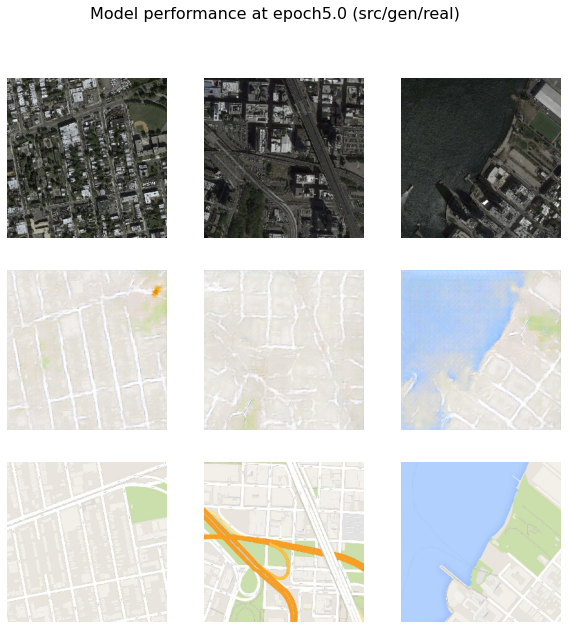

>Saved: plot_epoch5.0.png and model_epoch5.0.h5
step5481: d_loss_real[0.287] d_loss_fake[0.269] gan_loss[7.658]
step5482: d_loss_real[0.010] d_loss_fake[0.164] gan_loss[13.395]
step5483: d_loss_real[0.331] d_loss_fake[0.122] gan_loss[9.388]
step5484: d_loss_real[0.173] d_loss_fake[0.466] gan_loss[5.478]
step5485: d_loss_real[0.035] d_loss_fake[0.129] gan_loss[11.047]
step5486: d_loss_real[0.333] d_loss_fake[0.286] gan_loss[8.208]
step5487: d_loss_real[0.120] d_loss_fake[0.296] gan_loss[11.719]
step5488: d_loss_real[0.227] d_loss_fake[0.138] gan_loss[10.499]
step5489: d_loss_real[0.019] d_loss_fake[0.095] gan_loss[12.813]
step5490: d_loss_real[0.263] d_loss_fake[0.152] gan_loss[7.578]
step5491: d_loss_real[0.258] d_loss_fake[0.150] gan_loss[7.494]
step5492: d_loss_real[0.097] d_loss_fake[0.519] gan_loss[11.181]
step5493: d_loss_real[0.122] d_loss_fake[0.124] gan_loss[7.911]
step5494: d_loss_real[0.305] d_loss_fake[0.287] gan_loss[7.266]
step5495: d_loss_real[0.324] d_loss_fake[0.118] ga

step5605: d_loss_real[0.062] d_loss_fake[0.204] gan_loss[8.321]
step5606: d_loss_real[0.187] d_loss_fake[0.220] gan_loss[5.481]
step5607: d_loss_real[0.010] d_loss_fake[0.132] gan_loss[11.779]
step5608: d_loss_real[0.230] d_loss_fake[0.183] gan_loss[7.923]
step5609: d_loss_real[0.019] d_loss_fake[0.109] gan_loss[15.154]
step5610: d_loss_real[0.077] d_loss_fake[0.101] gan_loss[15.336]
step5611: d_loss_real[0.175] d_loss_fake[0.115] gan_loss[8.049]
step5612: d_loss_real[0.046] d_loss_fake[0.169] gan_loss[10.360]
step5613: d_loss_real[0.057] d_loss_fake[0.060] gan_loss[10.495]
step5614: d_loss_real[0.002] d_loss_fake[0.243] gan_loss[15.870]
step5615: d_loss_real[0.196] d_loss_fake[0.102] gan_loss[10.944]
step5616: d_loss_real[0.131] d_loss_fake[0.078] gan_loss[10.351]
step5617: d_loss_real[0.063] d_loss_fake[0.096] gan_loss[4.737]
step5618: d_loss_real[0.035] d_loss_fake[0.132] gan_loss[9.722]
step5619: d_loss_real[0.040] d_loss_fake[0.160] gan_loss[10.332]
step5620: d_loss_real[0.007] d_

step5733: d_loss_real[0.269] d_loss_fake[0.175] gan_loss[7.156]
step5734: d_loss_real[0.322] d_loss_fake[0.288] gan_loss[7.176]
step5735: d_loss_real[0.138] d_loss_fake[0.133] gan_loss[13.634]
step5736: d_loss_real[0.045] d_loss_fake[0.245] gan_loss[10.979]
step5737: d_loss_real[0.138] d_loss_fake[0.276] gan_loss[9.470]
step5738: d_loss_real[0.543] d_loss_fake[0.184] gan_loss[13.378]
step5739: d_loss_real[0.205] d_loss_fake[0.199] gan_loss[9.899]
step5740: d_loss_real[0.364] d_loss_fake[0.312] gan_loss[7.460]
step5741: d_loss_real[0.255] d_loss_fake[0.231] gan_loss[8.079]
step5742: d_loss_real[0.006] d_loss_fake[0.181] gan_loss[12.872]
step5743: d_loss_real[0.112] d_loss_fake[0.124] gan_loss[9.316]
step5744: d_loss_real[0.308] d_loss_fake[0.280] gan_loss[7.859]
step5745: d_loss_real[0.159] d_loss_fake[0.151] gan_loss[11.424]
step5746: d_loss_real[0.013] d_loss_fake[0.094] gan_loss[11.722]
step5747: d_loss_real[0.007] d_loss_fake[0.170] gan_loss[17.107]
step5748: d_loss_real[0.017] d_lo

step5861: d_loss_real[0.031] d_loss_fake[0.180] gan_loss[12.422]
step5862: d_loss_real[0.173] d_loss_fake[0.126] gan_loss[8.507]
step5863: d_loss_real[0.082] d_loss_fake[0.277] gan_loss[9.355]
step5864: d_loss_real[0.306] d_loss_fake[0.143] gan_loss[9.109]
step5865: d_loss_real[0.046] d_loss_fake[0.123] gan_loss[13.211]
step5866: d_loss_real[0.210] d_loss_fake[0.151] gan_loss[8.541]
step5867: d_loss_real[0.191] d_loss_fake[0.231] gan_loss[7.866]
step5868: d_loss_real[0.685] d_loss_fake[0.214] gan_loss[9.038]
step5869: d_loss_real[0.088] d_loss_fake[0.247] gan_loss[4.814]
step5870: d_loss_real[0.050] d_loss_fake[0.192] gan_loss[10.954]
step5871: d_loss_real[0.051] d_loss_fake[0.189] gan_loss[8.438]
step5872: d_loss_real[0.277] d_loss_fake[0.159] gan_loss[8.840]
step5873: d_loss_real[0.064] d_loss_fake[0.170] gan_loss[9.949]
step5874: d_loss_real[0.181] d_loss_fake[0.204] gan_loss[7.369]
step5875: d_loss_real[0.012] d_loss_fake[0.158] gan_loss[11.011]
step5876: d_loss_real[0.022] d_loss_

step5989: d_loss_real[0.334] d_loss_fake[0.341] gan_loss[4.720]
step5990: d_loss_real[0.018] d_loss_fake[0.184] gan_loss[14.374]
step5991: d_loss_real[0.801] d_loss_fake[0.288] gan_loss[7.568]
step5992: d_loss_real[0.348] d_loss_fake[0.698] gan_loss[5.258]
step5993: d_loss_real[0.343] d_loss_fake[0.121] gan_loss[9.242]
step5994: d_loss_real[0.276] d_loss_fake[0.110] gan_loss[9.685]
step5995: d_loss_real[0.023] d_loss_fake[0.180] gan_loss[14.744]
step5996: d_loss_real[0.071] d_loss_fake[0.207] gan_loss[6.992]
step5997: d_loss_real[0.123] d_loss_fake[0.108] gan_loss[13.818]
step5998: d_loss_real[0.241] d_loss_fake[0.213] gan_loss[8.348]
step5999: d_loss_real[0.006] d_loss_fake[0.178] gan_loss[12.887]
step6000: d_loss_real[0.080] d_loss_fake[0.158] gan_loss[9.738]
step6001: d_loss_real[0.417] d_loss_fake[0.234] gan_loss[7.206]
step6002: d_loss_real[0.145] d_loss_fake[0.149] gan_loss[10.397]
step6003: d_loss_real[0.082] d_loss_fake[0.164] gan_loss[4.300]
step6004: d_loss_real[0.003] d_loss

step6117: d_loss_real[0.745] d_loss_fake[0.121] gan_loss[7.355]
step6118: d_loss_real[0.037] d_loss_fake[0.190] gan_loss[10.713]
step6119: d_loss_real[0.233] d_loss_fake[0.439] gan_loss[7.161]
step6120: d_loss_real[0.051] d_loss_fake[0.078] gan_loss[14.195]
step6121: d_loss_real[0.299] d_loss_fake[0.103] gan_loss[9.399]
step6122: d_loss_real[0.234] d_loss_fake[0.202] gan_loss[8.288]
step6123: d_loss_real[0.057] d_loss_fake[0.258] gan_loss[5.377]
step6124: d_loss_real[0.411] d_loss_fake[0.187] gan_loss[8.487]
step6125: d_loss_real[0.021] d_loss_fake[0.242] gan_loss[13.950]
step6126: d_loss_real[0.036] d_loss_fake[0.174] gan_loss[17.814]
step6127: d_loss_real[0.480] d_loss_fake[0.254] gan_loss[8.111]
step6128: d_loss_real[0.452] d_loss_fake[0.114] gan_loss[11.972]
step6129: d_loss_real[0.339] d_loss_fake[0.220] gan_loss[7.119]
step6130: d_loss_real[0.133] d_loss_fake[0.323] gan_loss[7.075]
step6131: d_loss_real[0.111] d_loss_fake[0.327] gan_loss[8.061]
step6132: d_loss_real[0.072] d_loss

step6245: d_loss_real[0.119] d_loss_fake[0.256] gan_loss[8.095]
step6246: d_loss_real[0.144] d_loss_fake[0.263] gan_loss[8.746]
step6247: d_loss_real[0.032] d_loss_fake[0.106] gan_loss[12.923]
step6248: d_loss_real[0.364] d_loss_fake[0.142] gan_loss[7.276]
step6249: d_loss_real[0.019] d_loss_fake[0.207] gan_loss[10.880]
step6250: d_loss_real[0.021] d_loss_fake[0.107] gan_loss[14.759]
step6251: d_loss_real[0.204] d_loss_fake[0.261] gan_loss[7.389]
step6252: d_loss_real[0.081] d_loss_fake[0.159] gan_loss[8.709]
step6253: d_loss_real[0.058] d_loss_fake[0.133] gan_loss[10.232]
step6254: d_loss_real[0.027] d_loss_fake[0.104] gan_loss[17.979]
step6255: d_loss_real[0.033] d_loss_fake[0.256] gan_loss[13.450]
step6256: d_loss_real[0.237] d_loss_fake[0.076] gan_loss[13.288]
step6257: d_loss_real[0.098] d_loss_fake[0.093] gan_loss[14.291]
step6258: d_loss_real[0.071] d_loss_fake[0.141] gan_loss[12.580]
step6259: d_loss_real[0.016] d_loss_fake[0.145] gan_loss[13.244]
step6260: d_loss_real[0.668] d

step6373: d_loss_real[0.076] d_loss_fake[0.086] gan_loss[15.325]
step6374: d_loss_real[0.017] d_loss_fake[0.230] gan_loss[12.536]
step6375: d_loss_real[0.059] d_loss_fake[0.236] gan_loss[10.330]
step6376: d_loss_real[0.548] d_loss_fake[0.119] gan_loss[8.019]
step6377: d_loss_real[0.221] d_loss_fake[0.370] gan_loss[8.884]
step6378: d_loss_real[0.198] d_loss_fake[0.145] gan_loss[8.854]
step6379: d_loss_real[0.329] d_loss_fake[0.264] gan_loss[6.891]
step6380: d_loss_real[0.351] d_loss_fake[0.319] gan_loss[8.947]
step6381: d_loss_real[0.456] d_loss_fake[0.894] gan_loss[5.725]
step6382: d_loss_real[0.370] d_loss_fake[0.353] gan_loss[7.703]
step6383: d_loss_real[0.117] d_loss_fake[0.146] gan_loss[9.447]
step6384: d_loss_real[0.065] d_loss_fake[0.175] gan_loss[4.146]
step6385: d_loss_real[0.047] d_loss_fake[0.205] gan_loss[12.651]
step6386: d_loss_real[0.255] d_loss_fake[0.165] gan_loss[8.012]
step6387: d_loss_real[0.116] d_loss_fake[0.154] gan_loss[9.422]
step6388: d_loss_real[0.063] d_loss_

step6501: d_loss_real[0.396] d_loss_fake[0.450] gan_loss[6.175]
step6502: d_loss_real[0.247] d_loss_fake[0.334] gan_loss[7.483]
step6503: d_loss_real[0.013] d_loss_fake[0.105] gan_loss[13.088]
step6504: d_loss_real[0.136] d_loss_fake[0.130] gan_loss[11.733]
step6505: d_loss_real[0.007] d_loss_fake[0.229] gan_loss[15.346]
step6506: d_loss_real[0.516] d_loss_fake[0.126] gan_loss[7.178]
step6507: d_loss_real[0.381] d_loss_fake[0.345] gan_loss[8.245]
step6508: d_loss_real[0.027] d_loss_fake[0.314] gan_loss[12.685]
step6509: d_loss_real[0.170] d_loss_fake[0.106] gan_loss[14.678]
step6510: d_loss_real[0.138] d_loss_fake[0.126] gan_loss[11.719]
step6511: d_loss_real[0.634] d_loss_fake[0.536] gan_loss[7.126]
step6512: d_loss_real[0.122] d_loss_fake[0.144] gan_loss[11.887]
step6513: d_loss_real[0.031] d_loss_fake[0.258] gan_loss[11.353]
step6514: d_loss_real[0.047] d_loss_fake[0.069] gan_loss[15.656]
step6515: d_loss_real[0.611] d_loss_fake[0.164] gan_loss[11.697]
step6516: d_loss_real[0.418] d

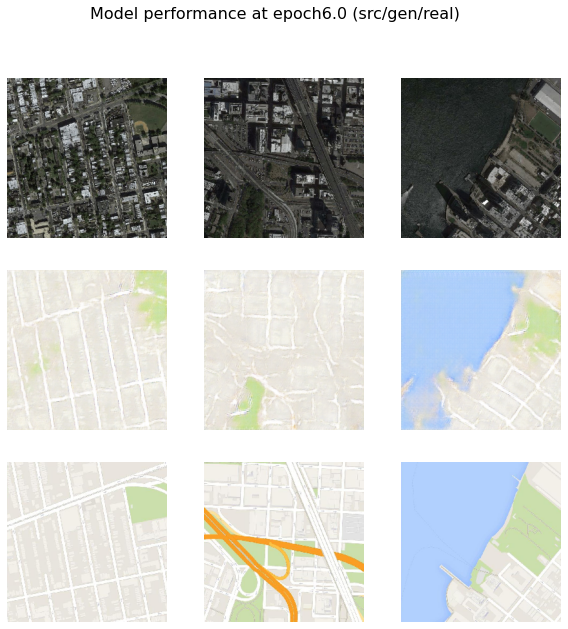

>Saved: plot_epoch6.0.png and model_epoch6.0.h5
step6577: d_loss_real[0.184] d_loss_fake[0.351] gan_loss[7.573]
step6578: d_loss_real[0.163] d_loss_fake[0.213] gan_loss[7.215]
step6579: d_loss_real[0.124] d_loss_fake[0.122] gan_loss[10.866]
step6580: d_loss_real[0.254] d_loss_fake[0.119] gan_loss[8.163]
step6581: d_loss_real[0.091] d_loss_fake[0.190] gan_loss[8.251]
step6582: d_loss_real[0.188] d_loss_fake[0.348] gan_loss[7.936]
step6583: d_loss_real[0.040] d_loss_fake[0.244] gan_loss[4.397]
step6584: d_loss_real[0.483] d_loss_fake[0.235] gan_loss[7.720]
step6585: d_loss_real[0.132] d_loss_fake[0.126] gan_loss[8.567]
step6586: d_loss_real[0.251] d_loss_fake[0.185] gan_loss[9.465]
step6587: d_loss_real[0.124] d_loss_fake[0.262] gan_loss[7.740]
step6588: d_loss_real[0.035] d_loss_fake[0.124] gan_loss[10.532]
step6589: d_loss_real[0.037] d_loss_fake[0.113] gan_loss[10.530]
step6590: d_loss_real[0.381] d_loss_fake[0.165] gan_loss[7.490]
step6591: d_loss_real[0.089] d_loss_fake[0.125] gan_l

step6701: d_loss_real[0.242] d_loss_fake[0.124] gan_loss[5.520]
step6702: d_loss_real[0.208] d_loss_fake[0.387] gan_loss[7.718]
step6703: d_loss_real[0.235] d_loss_fake[0.303] gan_loss[9.256]
step6704: d_loss_real[0.210] d_loss_fake[0.356] gan_loss[8.712]
step6705: d_loss_real[0.215] d_loss_fake[0.184] gan_loss[10.621]
step6706: d_loss_real[0.043] d_loss_fake[0.128] gan_loss[12.701]
step6707: d_loss_real[0.187] d_loss_fake[0.130] gan_loss[8.467]
step6708: d_loss_real[0.194] d_loss_fake[0.107] gan_loss[9.685]
step6709: d_loss_real[0.275] d_loss_fake[0.473] gan_loss[6.593]
step6710: d_loss_real[0.172] d_loss_fake[0.251] gan_loss[7.840]
step6711: d_loss_real[0.065] d_loss_fake[0.214] gan_loss[4.719]
step6712: d_loss_real[0.008] d_loss_fake[0.192] gan_loss[14.661]
step6713: d_loss_real[0.605] d_loss_fake[0.202] gan_loss[15.253]
step6714: d_loss_real[0.363] d_loss_fake[0.251] gan_loss[12.747]
step6715: d_loss_real[0.212] d_loss_fake[0.187] gan_loss[14.379]
step6716: d_loss_real[0.250] d_los

step6829: d_loss_real[0.008] d_loss_fake[0.447] gan_loss[13.500]
step6830: d_loss_real[0.049] d_loss_fake[0.400] gan_loss[9.009]
step6831: d_loss_real[0.185] d_loss_fake[0.109] gan_loss[4.472]
step6832: d_loss_real[0.111] d_loss_fake[0.064] gan_loss[13.554]
step6833: d_loss_real[0.587] d_loss_fake[0.185] gan_loss[12.159]
step6834: d_loss_real[0.454] d_loss_fake[0.198] gan_loss[6.803]
step6835: d_loss_real[0.090] d_loss_fake[0.185] gan_loss[12.776]
step6836: d_loss_real[0.082] d_loss_fake[0.392] gan_loss[9.850]
step6837: d_loss_real[0.076] d_loss_fake[0.117] gan_loss[9.500]
step6838: d_loss_real[0.415] d_loss_fake[0.172] gan_loss[8.115]
step6839: d_loss_real[0.030] d_loss_fake[0.279] gan_loss[10.968]
step6840: d_loss_real[0.349] d_loss_fake[0.155] gan_loss[8.095]
step6841: d_loss_real[0.102] d_loss_fake[0.493] gan_loss[7.437]
step6842: d_loss_real[0.055] d_loss_fake[0.150] gan_loss[14.626]
step6843: d_loss_real[0.527] d_loss_fake[0.126] gan_loss[13.319]
step6844: d_loss_real[0.152] d_lo

step6957: d_loss_real[0.010] d_loss_fake[0.094] gan_loss[12.432]
step6958: d_loss_real[0.040] d_loss_fake[0.226] gan_loss[12.144]
step6959: d_loss_real[0.671] d_loss_fake[0.196] gan_loss[9.259]
step6960: d_loss_real[0.421] d_loss_fake[0.174] gan_loss[8.997]
step6961: d_loss_real[0.028] d_loss_fake[0.137] gan_loss[11.877]
step6962: d_loss_real[0.367] d_loss_fake[0.320] gan_loss[14.653]
step6963: d_loss_real[0.012] d_loss_fake[0.191] gan_loss[16.348]
step6964: d_loss_real[0.449] d_loss_fake[0.256] gan_loss[9.946]
step6965: d_loss_real[0.014] d_loss_fake[0.158] gan_loss[12.434]
step6966: d_loss_real[0.136] d_loss_fake[0.153] gan_loss[10.486]
step6967: d_loss_real[0.158] d_loss_fake[0.206] gan_loss[9.123]
step6968: d_loss_real[0.128] d_loss_fake[0.162] gan_loss[8.850]
step6969: d_loss_real[0.347] d_loss_fake[0.226] gan_loss[7.298]
step6970: d_loss_real[0.301] d_loss_fake[0.377] gan_loss[7.445]
step6971: d_loss_real[0.145] d_loss_fake[0.229] gan_loss[7.676]
step6972: d_loss_real[0.388] d_lo

step7085: d_loss_real[0.052] d_loss_fake[0.206] gan_loss[10.334]
step7086: d_loss_real[0.149] d_loss_fake[0.300] gan_loss[7.192]
step7087: d_loss_real[0.083] d_loss_fake[0.103] gan_loss[13.711]
step7088: d_loss_real[0.372] d_loss_fake[0.358] gan_loss[7.507]
step7089: d_loss_real[0.119] d_loss_fake[0.092] gan_loss[11.294]
step7090: d_loss_real[0.303] d_loss_fake[0.184] gan_loss[8.253]
step7091: d_loss_real[0.159] d_loss_fake[0.161] gan_loss[11.777]
step7092: d_loss_real[0.363] d_loss_fake[0.145] gan_loss[5.420]
step7093: d_loss_real[0.155] d_loss_fake[0.396] gan_loss[7.499]
step7094: d_loss_real[0.016] d_loss_fake[0.295] gan_loss[11.688]
step7095: d_loss_real[0.193] d_loss_fake[0.221] gan_loss[7.777]
step7096: d_loss_real[0.717] d_loss_fake[0.161] gan_loss[7.117]
step7097: d_loss_real[0.691] d_loss_fake[0.168] gan_loss[8.014]
step7098: d_loss_real[0.023] d_loss_fake[0.256] gan_loss[12.396]
step7099: d_loss_real[0.062] d_loss_fake[0.425] gan_loss[8.152]
step7100: d_loss_real[0.158] d_los

step7213: d_loss_real[0.114] d_loss_fake[0.110] gan_loss[11.171]
step7214: d_loss_real[0.409] d_loss_fake[0.151] gan_loss[7.542]
step7215: d_loss_real[0.020] d_loss_fake[1.482] gan_loss[2.678]
step7216: d_loss_real[0.285] d_loss_fake[0.262] gan_loss[5.738]
step7217: d_loss_real[0.644] d_loss_fake[0.108] gan_loss[7.499]
step7218: d_loss_real[0.205] d_loss_fake[0.086] gan_loss[6.084]
step7219: d_loss_real[0.120] d_loss_fake[0.212] gan_loss[7.369]
step7220: d_loss_real[0.070] d_loss_fake[0.528] gan_loss[9.572]
step7221: d_loss_real[0.027] d_loss_fake[0.270] gan_loss[12.624]
step7222: d_loss_real[0.492] d_loss_fake[0.137] gan_loss[9.822]
step7223: d_loss_real[0.423] d_loss_fake[0.212] gan_loss[8.215]
step7224: d_loss_real[0.262] d_loss_fake[0.317] gan_loss[7.896]
step7225: d_loss_real[0.291] d_loss_fake[0.144] gan_loss[10.651]
step7226: d_loss_real[0.059] d_loss_fake[0.238] gan_loss[10.388]
step7227: d_loss_real[0.019] d_loss_fake[0.154] gan_loss[14.727]
step7228: d_loss_real[0.036] d_loss

step7341: d_loss_real[0.474] d_loss_fake[0.105] gan_loss[12.050]
step7342: d_loss_real[0.010] d_loss_fake[0.206] gan_loss[9.794]
step7343: d_loss_real[0.142] d_loss_fake[0.080] gan_loss[5.784]
step7344: d_loss_real[0.194] d_loss_fake[0.365] gan_loss[7.517]
step7345: d_loss_real[0.246] d_loss_fake[0.117] gan_loss[9.019]
step7346: d_loss_real[0.016] d_loss_fake[0.148] gan_loss[10.136]
step7347: d_loss_real[0.371] d_loss_fake[0.281] gan_loss[7.540]
step7348: d_loss_real[0.044] d_loss_fake[0.060] gan_loss[4.103]
step7349: d_loss_real[0.059] d_loss_fake[0.130] gan_loss[8.797]
step7350: d_loss_real[0.032] d_loss_fake[0.145] gan_loss[7.371]
step7351: d_loss_real[0.070] d_loss_fake[0.441] gan_loss[9.155]
step7352: d_loss_real[0.396] d_loss_fake[0.126] gan_loss[8.201]
step7353: d_loss_real[0.112] d_loss_fake[0.116] gan_loss[10.240]
step7354: d_loss_real[0.048] d_loss_fake[0.162] gan_loss[9.871]
step7355: d_loss_real[0.030] d_loss_fake[0.093] gan_loss[9.437]
step7356: d_loss_real[0.692] d_loss_f

step7469: d_loss_real[0.183] d_loss_fake[0.191] gan_loss[9.228]
step7470: d_loss_real[0.231] d_loss_fake[0.241] gan_loss[7.994]
step7471: d_loss_real[0.511] d_loss_fake[0.388] gan_loss[11.503]
step7472: d_loss_real[0.532] d_loss_fake[0.129] gan_loss[9.352]
step7473: d_loss_real[0.210] d_loss_fake[0.317] gan_loss[6.961]
step7474: d_loss_real[0.118] d_loss_fake[0.152] gan_loss[9.612]
step7475: d_loss_real[0.128] d_loss_fake[0.161] gan_loss[7.981]
step7476: d_loss_real[0.089] d_loss_fake[0.309] gan_loss[7.115]
step7477: d_loss_real[0.193] d_loss_fake[0.227] gan_loss[6.958]
step7478: d_loss_real[0.243] d_loss_fake[0.940] gan_loss[8.389]
step7479: d_loss_real[0.353] d_loss_fake[0.120] gan_loss[7.047]
step7480: d_loss_real[0.337] d_loss_fake[0.195] gan_loss[9.197]
step7481: d_loss_real[0.069] d_loss_fake[0.082] gan_loss[10.010]
step7482: d_loss_real[0.223] d_loss_fake[0.148] gan_loss[8.175]
step7483: d_loss_real[0.079] d_loss_fake[0.193] gan_loss[8.752]
step7484: d_loss_real[0.129] d_loss_fa

step7597: d_loss_real[0.035] d_loss_fake[0.221] gan_loss[11.665]
step7598: d_loss_real[0.135] d_loss_fake[0.118] gan_loss[9.748]
step7599: d_loss_real[0.519] d_loss_fake[0.164] gan_loss[8.157]
step7600: d_loss_real[0.050] d_loss_fake[0.271] gan_loss[10.695]
step7601: d_loss_real[0.991] d_loss_fake[0.174] gan_loss[7.311]
step7602: d_loss_real[0.206] d_loss_fake[0.427] gan_loss[7.160]
step7603: d_loss_real[0.205] d_loss_fake[0.200] gan_loss[8.740]
step7604: d_loss_real[0.422] d_loss_fake[0.730] gan_loss[5.578]
step7605: d_loss_real[0.040] d_loss_fake[0.169] gan_loss[10.148]
step7606: d_loss_real[0.080] d_loss_fake[0.159] gan_loss[13.655]
step7607: d_loss_real[0.222] d_loss_fake[0.102] gan_loss[9.137]
step7608: d_loss_real[0.026] d_loss_fake[0.086] gan_loss[12.698]
step7609: d_loss_real[0.370] d_loss_fake[0.201] gan_loss[8.682]
step7610: d_loss_real[0.036] d_loss_fake[0.259] gan_loss[8.606]
step7611: d_loss_real[0.573] d_loss_fake[0.172] gan_loss[9.241]
step7612: d_loss_real[0.042] d_loss

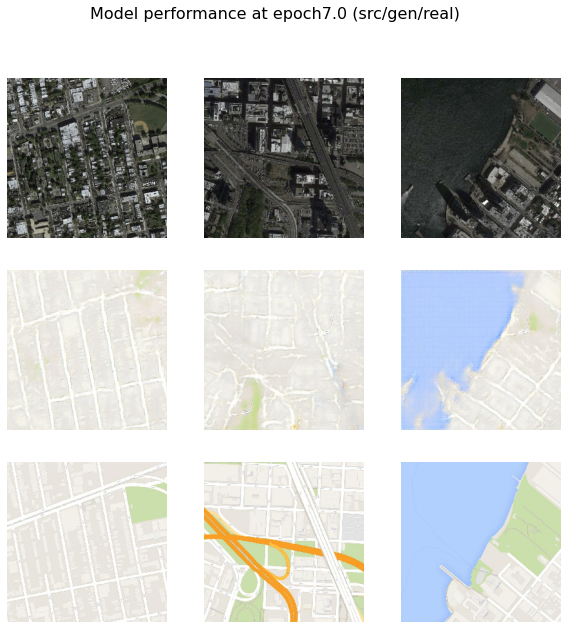

>Saved: plot_epoch7.0.png and model_epoch7.0.h5
step7673: d_loss_real[0.099] d_loss_fake[0.167] gan_loss[8.493]
step7674: d_loss_real[0.377] d_loss_fake[0.188] gan_loss[8.857]
step7675: d_loss_real[0.139] d_loss_fake[0.526] gan_loss[4.589]
step7676: d_loss_real[0.049] d_loss_fake[0.275] gan_loss[10.251]
step7677: d_loss_real[0.602] d_loss_fake[0.127] gan_loss[4.356]
step7678: d_loss_real[0.148] d_loss_fake[0.223] gan_loss[10.692]
step7679: d_loss_real[0.382] d_loss_fake[0.328] gan_loss[7.474]
step7680: d_loss_real[0.241] d_loss_fake[0.269] gan_loss[7.105]
step7681: d_loss_real[0.376] d_loss_fake[0.183] gan_loss[6.515]
step7682: d_loss_real[0.034] d_loss_fake[0.282] gan_loss[9.776]
step7683: d_loss_real[0.176] d_loss_fake[0.213] gan_loss[8.526]
step7684: d_loss_real[0.013] d_loss_fake[0.128] gan_loss[21.462]
step7685: d_loss_real[0.301] d_loss_fake[0.189] gan_loss[7.823]
step7686: d_loss_real[0.282] d_loss_fake[0.344] gan_loss[7.371]
step7687: d_loss_real[0.299] d_loss_fake[0.228] gan_l

step7798: d_loss_real[0.529] d_loss_fake[0.175] gan_loss[7.122]
step7799: d_loss_real[0.204] d_loss_fake[0.213] gan_loss[7.509]
step7800: d_loss_real[0.213] d_loss_fake[0.175] gan_loss[11.079]
step7801: d_loss_real[0.086] d_loss_fake[0.349] gan_loss[8.377]
step7802: d_loss_real[0.351] d_loss_fake[0.198] gan_loss[8.363]
step7803: d_loss_real[0.097] d_loss_fake[0.282] gan_loss[9.089]
step7804: d_loss_real[0.122] d_loss_fake[0.179] gan_loss[9.409]
step7805: d_loss_real[0.032] d_loss_fake[0.056] gan_loss[14.854]
step7806: d_loss_real[0.426] d_loss_fake[0.327] gan_loss[3.959]
step7807: d_loss_real[0.626] d_loss_fake[0.219] gan_loss[8.071]
step7808: d_loss_real[0.165] d_loss_fake[0.569] gan_loss[4.466]
step7809: d_loss_real[0.100] d_loss_fake[0.073] gan_loss[15.370]
step7810: d_loss_real[0.183] d_loss_fake[0.230] gan_loss[8.991]
step7811: d_loss_real[0.538] d_loss_fake[0.212] gan_loss[7.950]
step7812: d_loss_real[0.156] d_loss_fake[0.298] gan_loss[6.801]
step7813: d_loss_real[0.435] d_loss_f

step7926: d_loss_real[0.112] d_loss_fake[0.284] gan_loss[10.934]
step7927: d_loss_real[0.047] d_loss_fake[0.321] gan_loss[11.583]
step7928: d_loss_real[0.438] d_loss_fake[0.077] gan_loss[9.031]
step7929: d_loss_real[0.518] d_loss_fake[0.288] gan_loss[6.512]
step7930: d_loss_real[0.300] d_loss_fake[0.286] gan_loss[7.938]
step7931: d_loss_real[0.385] d_loss_fake[0.295] gan_loss[9.942]
step7932: d_loss_real[0.083] d_loss_fake[0.235] gan_loss[10.070]
step7933: d_loss_real[0.276] d_loss_fake[0.256] gan_loss[10.127]
step7934: d_loss_real[0.417] d_loss_fake[0.845] gan_loss[7.640]
step7935: d_loss_real[0.086] d_loss_fake[0.144] gan_loss[10.237]
step7936: d_loss_real[0.313] d_loss_fake[0.302] gan_loss[7.483]
step7937: d_loss_real[0.100] d_loss_fake[0.186] gan_loss[9.620]
step7938: d_loss_real[0.646] d_loss_fake[0.436] gan_loss[6.055]
step7939: d_loss_real[0.334] d_loss_fake[0.181] gan_loss[9.122]
step7940: d_loss_real[0.149] d_loss_fake[0.398] gan_loss[6.865]
step7941: d_loss_real[0.069] d_loss

step8054: d_loss_real[0.529] d_loss_fake[0.308] gan_loss[6.224]
step8055: d_loss_real[0.425] d_loss_fake[0.126] gan_loss[10.159]
step8056: d_loss_real[0.039] d_loss_fake[0.180] gan_loss[12.322]
step8057: d_loss_real[0.127] d_loss_fake[0.152] gan_loss[10.613]
step8058: d_loss_real[0.154] d_loss_fake[0.127] gan_loss[13.712]
step8059: d_loss_real[0.849] d_loss_fake[0.349] gan_loss[5.569]
step8060: d_loss_real[0.286] d_loss_fake[0.450] gan_loss[13.491]
step8061: d_loss_real[0.240] d_loss_fake[0.290] gan_loss[8.934]
step8062: d_loss_real[0.148] d_loss_fake[0.263] gan_loss[10.991]
step8063: d_loss_real[0.175] d_loss_fake[0.188] gan_loss[11.266]
step8064: d_loss_real[0.068] d_loss_fake[0.123] gan_loss[11.660]
step8065: d_loss_real[0.086] d_loss_fake[0.114] gan_loss[10.468]
step8066: d_loss_real[0.249] d_loss_fake[0.226] gan_loss[6.053]
step8067: d_loss_real[0.135] d_loss_fake[0.309] gan_loss[7.624]
step8068: d_loss_real[0.094] d_loss_fake[0.124] gan_loss[10.433]
step8069: d_loss_real[0.342] d

step8182: d_loss_real[0.270] d_loss_fake[0.234] gan_loss[10.432]
step8183: d_loss_real[0.260] d_loss_fake[0.312] gan_loss[7.109]
step8184: d_loss_real[0.178] d_loss_fake[0.398] gan_loss[6.323]
step8185: d_loss_real[0.108] d_loss_fake[0.167] gan_loss[8.155]
step8186: d_loss_real[0.238] d_loss_fake[0.201] gan_loss[7.334]
step8187: d_loss_real[0.107] d_loss_fake[0.240] gan_loss[9.216]
step8188: d_loss_real[0.057] d_loss_fake[0.197] gan_loss[12.229]
step8189: d_loss_real[0.240] d_loss_fake[0.147] gan_loss[8.300]
step8190: d_loss_real[0.351] d_loss_fake[0.268] gan_loss[6.828]
step8191: d_loss_real[0.346] d_loss_fake[0.277] gan_loss[6.940]
step8192: d_loss_real[0.235] d_loss_fake[0.316] gan_loss[8.992]
step8193: d_loss_real[0.232] d_loss_fake[0.219] gan_loss[6.818]
step8194: d_loss_real[0.195] d_loss_fake[0.236] gan_loss[8.863]
step8195: d_loss_real[0.327] d_loss_fake[0.133] gan_loss[10.614]
step8196: d_loss_real[0.110] d_loss_fake[0.209] gan_loss[6.990]
step8197: d_loss_real[0.072] d_loss_f

step8310: d_loss_real[0.318] d_loss_fake[0.160] gan_loss[8.155]
step8311: d_loss_real[0.036] d_loss_fake[0.279] gan_loss[8.350]
step8312: d_loss_real[0.009] d_loss_fake[0.142] gan_loss[16.430]
step8313: d_loss_real[0.809] d_loss_fake[0.093] gan_loss[8.787]
step8314: d_loss_real[0.827] d_loss_fake[0.216] gan_loss[17.531]
step8315: d_loss_real[0.139] d_loss_fake[0.387] gan_loss[7.913]
step8316: d_loss_real[0.080] d_loss_fake[0.154] gan_loss[11.596]
step8317: d_loss_real[0.221] d_loss_fake[0.185] gan_loss[11.652]
step8318: d_loss_real[0.061] d_loss_fake[0.335] gan_loss[6.730]
step8319: d_loss_real[0.050] d_loss_fake[0.205] gan_loss[7.227]
step8320: d_loss_real[0.091] d_loss_fake[0.432] gan_loss[6.400]
step8321: d_loss_real[0.124] d_loss_fake[0.199] gan_loss[3.946]
step8322: d_loss_real[0.154] d_loss_fake[0.077] gan_loss[14.328]
step8323: d_loss_real[0.463] d_loss_fake[0.247] gan_loss[7.134]
step8324: d_loss_real[0.373] d_loss_fake[0.275] gan_loss[8.143]
step8325: d_loss_real[0.024] d_loss

step8438: d_loss_real[0.041] d_loss_fake[0.201] gan_loss[13.168]
step8439: d_loss_real[0.237] d_loss_fake[0.091] gan_loss[8.856]
step8440: d_loss_real[0.836] d_loss_fake[0.225] gan_loss[9.167]
step8441: d_loss_real[0.302] d_loss_fake[0.160] gan_loss[7.627]
step8442: d_loss_real[0.278] d_loss_fake[0.475] gan_loss[7.085]
step8443: d_loss_real[0.025] d_loss_fake[0.178] gan_loss[10.154]
step8444: d_loss_real[0.054] d_loss_fake[0.137] gan_loss[13.409]
step8445: d_loss_real[0.206] d_loss_fake[0.336] gan_loss[6.812]
step8446: d_loss_real[0.162] d_loss_fake[0.135] gan_loss[8.526]
step8447: d_loss_real[0.278] d_loss_fake[0.248] gan_loss[6.782]
step8448: d_loss_real[0.114] d_loss_fake[0.296] gan_loss[8.647]
step8449: d_loss_real[0.418] d_loss_fake[0.205] gan_loss[8.208]
step8450: d_loss_real[0.399] d_loss_fake[0.152] gan_loss[8.931]
step8451: d_loss_real[0.010] d_loss_fake[0.400] gan_loss[13.297]
step8452: d_loss_real[0.345] d_loss_fake[0.174] gan_loss[8.545]
step8453: d_loss_real[0.239] d_loss_

step8566: d_loss_real[0.231] d_loss_fake[0.144] gan_loss[11.318]
step8567: d_loss_real[0.292] d_loss_fake[0.502] gan_loss[6.756]
step8568: d_loss_real[0.068] d_loss_fake[0.142] gan_loss[10.740]
step8569: d_loss_real[0.326] d_loss_fake[0.264] gan_loss[11.320]
step8570: d_loss_real[0.305] d_loss_fake[0.458] gan_loss[6.547]
step8571: d_loss_real[0.173] d_loss_fake[0.172] gan_loss[7.679]
step8572: d_loss_real[0.057] d_loss_fake[0.158] gan_loss[10.685]
step8573: d_loss_real[0.511] d_loss_fake[0.151] gan_loss[8.862]
step8574: d_loss_real[0.057] d_loss_fake[0.581] gan_loss[8.220]
step8575: d_loss_real[0.113] d_loss_fake[0.170] gan_loss[13.723]
step8576: d_loss_real[0.459] d_loss_fake[0.195] gan_loss[7.201]
step8577: d_loss_real[0.030] d_loss_fake[0.136] gan_loss[12.154]
step8578: d_loss_real[0.207] d_loss_fake[0.332] gan_loss[6.700]
step8579: d_loss_real[0.310] d_loss_fake[0.317] gan_loss[7.491]
step8580: d_loss_real[0.173] d_loss_fake[0.131] gan_loss[11.709]
step8581: d_loss_real[0.608] d_lo

step8694: d_loss_real[0.099] d_loss_fake[0.173] gan_loss[11.333]
step8695: d_loss_real[0.477] d_loss_fake[0.244] gan_loss[7.075]
step8696: d_loss_real[0.062] d_loss_fake[0.079] gan_loss[3.403]
step8697: d_loss_real[0.059] d_loss_fake[0.262] gan_loss[9.918]
step8698: d_loss_real[0.254] d_loss_fake[0.164] gan_loss[9.963]
step8699: d_loss_real[0.189] d_loss_fake[0.420] gan_loss[8.918]
step8700: d_loss_real[0.037] d_loss_fake[0.111] gan_loss[11.719]
step8701: d_loss_real[0.381] d_loss_fake[0.140] gan_loss[8.200]
step8702: d_loss_real[0.259] d_loss_fake[0.140] gan_loss[7.913]
step8703: d_loss_real[0.100] d_loss_fake[0.268] gan_loss[6.883]
step8704: d_loss_real[0.078] d_loss_fake[0.217] gan_loss[8.038]
step8705: d_loss_real[0.131] d_loss_fake[0.266] gan_loss[7.547]
step8706: d_loss_real[0.201] d_loss_fake[0.210] gan_loss[8.400]
step8707: d_loss_real[0.133] d_loss_fake[0.175] gan_loss[10.957]
step8708: d_loss_real[0.304] d_loss_fake[0.348] gan_loss[7.767]
step8709: d_loss_real[0.401] d_loss_f

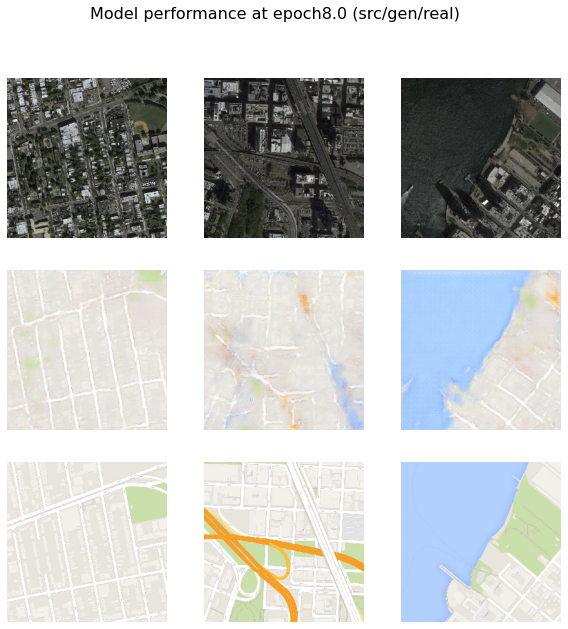

>Saved: plot_epoch8.0.png and model_epoch8.0.h5
step8769: d_loss_real[0.148] d_loss_fake[0.137] gan_loss[10.163]
step8770: d_loss_real[0.029] d_loss_fake[0.156] gan_loss[12.923]
step8771: d_loss_real[0.238] d_loss_fake[0.240] gan_loss[6.641]
step8772: d_loss_real[0.346] d_loss_fake[0.346] gan_loss[7.349]
step8773: d_loss_real[0.141] d_loss_fake[0.079] gan_loss[4.932]
step8774: d_loss_real[0.052] d_loss_fake[0.184] gan_loss[9.632]
step8775: d_loss_real[0.016] d_loss_fake[0.102] gan_loss[11.340]
step8776: d_loss_real[0.164] d_loss_fake[0.095] gan_loss[4.257]
step8777: d_loss_real[0.269] d_loss_fake[0.107] gan_loss[9.526]
step8778: d_loss_real[0.040] d_loss_fake[0.156] gan_loss[16.364]
step8779: d_loss_real[0.012] d_loss_fake[0.192] gan_loss[21.375]
step8780: d_loss_real[0.261] d_loss_fake[0.201] gan_loss[8.401]
step8781: d_loss_real[0.261] d_loss_fake[0.241] gan_loss[7.399]
step8782: d_loss_real[0.088] d_loss_fake[0.237] gan_loss[8.424]
step8783: d_loss_real[0.092] d_loss_fake[0.286] gan

step8894: d_loss_real[0.281] d_loss_fake[0.389] gan_loss[7.427]
step8895: d_loss_real[0.106] d_loss_fake[0.176] gan_loss[9.558]
step8896: d_loss_real[0.280] d_loss_fake[0.298] gan_loss[8.104]
step8897: d_loss_real[0.366] d_loss_fake[0.257] gan_loss[8.942]
step8898: d_loss_real[0.694] d_loss_fake[0.155] gan_loss[12.140]
step8899: d_loss_real[0.024] d_loss_fake[0.151] gan_loss[15.023]
step8900: d_loss_real[0.375] d_loss_fake[0.299] gan_loss[6.445]
step8901: d_loss_real[0.179] d_loss_fake[0.191] gan_loss[5.967]
step8902: d_loss_real[0.019] d_loss_fake[0.617] gan_loss[9.109]
step8903: d_loss_real[0.536] d_loss_fake[0.128] gan_loss[7.974]
step8904: d_loss_real[0.780] d_loss_fake[0.147] gan_loss[7.908]
step8905: d_loss_real[0.314] d_loss_fake[0.567] gan_loss[5.893]
step8906: d_loss_real[0.333] d_loss_fake[0.564] gan_loss[7.679]
step8907: d_loss_real[0.054] d_loss_fake[0.173] gan_loss[4.456]
step8908: d_loss_real[0.491] d_loss_fake[0.217] gan_loss[10.204]
step8909: d_loss_real[0.213] d_loss_f

step9022: d_loss_real[0.125] d_loss_fake[0.160] gan_loss[9.077]
step9023: d_loss_real[0.124] d_loss_fake[0.113] gan_loss[10.360]
step9024: d_loss_real[0.024] d_loss_fake[0.290] gan_loss[12.625]
step9025: d_loss_real[0.204] d_loss_fake[0.253] gan_loss[7.554]
step9026: d_loss_real[0.484] d_loss_fake[0.324] gan_loss[5.123]
step9027: d_loss_real[0.031] d_loss_fake[0.077] gan_loss[13.794]
step9028: d_loss_real[0.597] d_loss_fake[0.155] gan_loss[8.305]
step9029: d_loss_real[0.535] d_loss_fake[0.371] gan_loss[10.646]
step9030: d_loss_real[0.012] d_loss_fake[0.312] gan_loss[11.792]
step9031: d_loss_real[0.029] d_loss_fake[0.648] gan_loss[10.205]
step9032: d_loss_real[0.127] d_loss_fake[0.058] gan_loss[12.875]
step9033: d_loss_real[0.145] d_loss_fake[0.062] gan_loss[12.436]
step9034: d_loss_real[1.317] d_loss_fake[0.100] gan_loss[10.093]
step9035: d_loss_real[0.703] d_loss_fake[0.305] gan_loss[7.818]
step9036: d_loss_real[0.337] d_loss_fake[0.477] gan_loss[7.595]
step9037: d_loss_real[0.337] d_

step9150: d_loss_real[0.347] d_loss_fake[0.192] gan_loss[8.229]
step9151: d_loss_real[0.060] d_loss_fake[0.059] gan_loss[4.155]
step9152: d_loss_real[0.081] d_loss_fake[0.153] gan_loss[11.154]
step9153: d_loss_real[0.333] d_loss_fake[0.141] gan_loss[9.387]
step9154: d_loss_real[0.073] d_loss_fake[0.347] gan_loss[10.255]
step9155: d_loss_real[0.037] d_loss_fake[0.308] gan_loss[10.482]
step9156: d_loss_real[0.094] d_loss_fake[0.097] gan_loss[12.277]
step9157: d_loss_real[0.231] d_loss_fake[0.103] gan_loss[10.838]
step9158: d_loss_real[0.057] d_loss_fake[0.116] gan_loss[11.650]
step9159: d_loss_real[0.307] d_loss_fake[0.186] gan_loss[7.274]
step9160: d_loss_real[0.293] d_loss_fake[0.610] gan_loss[4.597]
step9161: d_loss_real[0.682] d_loss_fake[0.212] gan_loss[7.104]
step9162: d_loss_real[0.097] d_loss_fake[0.236] gan_loss[12.667]
step9163: d_loss_real[0.200] d_loss_fake[0.243] gan_loss[7.294]
step9164: d_loss_real[0.266] d_loss_fake[0.261] gan_loss[6.361]
step9165: d_loss_real[0.028] d_lo

step9278: d_loss_real[0.132] d_loss_fake[0.794] gan_loss[8.932]
step9279: d_loss_real[0.638] d_loss_fake[0.142] gan_loss[8.166]
step9280: d_loss_real[0.417] d_loss_fake[0.199] gan_loss[7.280]
step9281: d_loss_real[0.238] d_loss_fake[0.257] gan_loss[7.636]
step9282: d_loss_real[0.286] d_loss_fake[0.241] gan_loss[9.478]
step9283: d_loss_real[0.050] d_loss_fake[0.197] gan_loss[11.300]
step9284: d_loss_real[0.173] d_loss_fake[0.309] gan_loss[8.102]
step9285: d_loss_real[0.331] d_loss_fake[0.215] gan_loss[5.162]
step9286: d_loss_real[0.309] d_loss_fake[0.263] gan_loss[6.631]
step9287: d_loss_real[0.313] d_loss_fake[0.309] gan_loss[6.732]
step9288: d_loss_real[0.434] d_loss_fake[0.436] gan_loss[6.342]
step9289: d_loss_real[0.203] d_loss_fake[0.213] gan_loss[6.908]
step9290: d_loss_real[0.145] d_loss_fake[0.380] gan_loss[7.348]
step9291: d_loss_real[0.128] d_loss_fake[0.143] gan_loss[8.742]
step9292: d_loss_real[0.043] d_loss_fake[0.308] gan_loss[10.168]
step9293: d_loss_real[0.701] d_loss_fa

step9406: d_loss_real[0.041] d_loss_fake[0.382] gan_loss[10.095]
step9407: d_loss_real[0.353] d_loss_fake[0.281] gan_loss[11.955]
step9408: d_loss_real[0.383] d_loss_fake[0.359] gan_loss[7.895]
step9409: d_loss_real[0.255] d_loss_fake[0.293] gan_loss[9.889]
step9410: d_loss_real[0.123] d_loss_fake[0.199] gan_loss[8.895]
step9411: d_loss_real[0.304] d_loss_fake[0.348] gan_loss[7.770]
step9412: d_loss_real[0.245] d_loss_fake[0.191] gan_loss[6.887]
step9413: d_loss_real[0.248] d_loss_fake[0.372] gan_loss[6.610]
step9414: d_loss_real[0.266] d_loss_fake[0.222] gan_loss[8.174]
step9415: d_loss_real[0.198] d_loss_fake[0.224] gan_loss[6.965]
step9416: d_loss_real[0.087] d_loss_fake[0.430] gan_loss[7.127]
step9417: d_loss_real[0.209] d_loss_fake[0.098] gan_loss[7.460]
step9418: d_loss_real[0.034] d_loss_fake[0.185] gan_loss[11.233]
step9419: d_loss_real[0.135] d_loss_fake[0.148] gan_loss[6.723]
step9420: d_loss_real[0.205] d_loss_fake[0.060] gan_loss[5.020]
step9421: d_loss_real[0.102] d_loss_f

step9534: d_loss_real[0.485] d_loss_fake[0.293] gan_loss[5.000]
step9535: d_loss_real[0.335] d_loss_fake[0.344] gan_loss[3.470]
step9536: d_loss_real[0.255] d_loss_fake[0.606] gan_loss[3.471]
step9537: d_loss_real[0.139] d_loss_fake[0.204] gan_loss[7.011]
step9538: d_loss_real[0.184] d_loss_fake[0.326] gan_loss[11.187]
step9539: d_loss_real[0.039] d_loss_fake[0.224] gan_loss[11.764]
step9540: d_loss_real[0.335] d_loss_fake[0.157] gan_loss[11.225]
step9541: d_loss_real[0.035] d_loss_fake[0.147] gan_loss[13.221]
step9542: d_loss_real[0.105] d_loss_fake[0.105] gan_loss[10.823]
step9543: d_loss_real[0.368] d_loss_fake[0.199] gan_loss[7.904]
step9544: d_loss_real[0.250] d_loss_fake[0.236] gan_loss[7.584]
step9545: d_loss_real[0.202] d_loss_fake[0.254] gan_loss[9.514]
step9546: d_loss_real[0.215] d_loss_fake[0.291] gan_loss[7.374]
step9547: d_loss_real[0.244] d_loss_fake[0.202] gan_loss[7.077]
step9548: d_loss_real[0.116] d_loss_fake[0.229] gan_loss[9.422]
step9549: d_loss_real[0.260] d_loss

step9662: d_loss_real[0.252] d_loss_fake[0.245] gan_loss[6.660]
step9663: d_loss_real[0.391] d_loss_fake[0.181] gan_loss[6.932]
step9664: d_loss_real[0.259] d_loss_fake[0.726] gan_loss[4.647]
step9665: d_loss_real[0.157] d_loss_fake[0.248] gan_loss[8.713]
step9666: d_loss_real[0.389] d_loss_fake[0.266] gan_loss[7.581]
step9667: d_loss_real[0.228] d_loss_fake[0.262] gan_loss[6.440]
step9668: d_loss_real[0.107] d_loss_fake[0.174] gan_loss[11.441]
step9669: d_loss_real[0.159] d_loss_fake[0.181] gan_loss[9.648]
step9670: d_loss_real[0.037] d_loss_fake[0.170] gan_loss[10.176]
step9671: d_loss_real[0.636] d_loss_fake[0.158] gan_loss[5.017]
step9672: d_loss_real[0.022] d_loss_fake[0.809] gan_loss[9.461]
step9673: d_loss_real[0.920] d_loss_fake[0.096] gan_loss[7.606]
step9674: d_loss_real[0.386] d_loss_fake[0.282] gan_loss[7.005]
step9675: d_loss_real[0.215] d_loss_fake[0.186] gan_loss[10.091]
step9676: d_loss_real[0.136] d_loss_fake[0.263] gan_loss[6.615]
step9677: d_loss_real[0.092] d_loss_f

step9790: d_loss_real[0.636] d_loss_fake[0.269] gan_loss[6.900]
step9791: d_loss_real[0.094] d_loss_fake[0.263] gan_loss[10.180]
step9792: d_loss_real[0.251] d_loss_fake[0.192] gan_loss[8.468]
step9793: d_loss_real[0.770] d_loss_fake[0.301] gan_loss[5.497]
step9794: d_loss_real[0.269] d_loss_fake[0.245] gan_loss[8.341]
step9795: d_loss_real[0.185] d_loss_fake[0.165] gan_loss[8.433]
step9796: d_loss_real[0.026] d_loss_fake[0.245] gan_loss[19.892]
step9797: d_loss_real[0.031] d_loss_fake[0.170] gan_loss[11.603]
step9798: d_loss_real[0.334] d_loss_fake[0.214] gan_loss[6.683]
step9799: d_loss_real[0.110] d_loss_fake[0.255] gan_loss[10.630]
step9800: d_loss_real[0.328] d_loss_fake[0.279] gan_loss[8.670]
step9801: d_loss_real[0.029] d_loss_fake[0.123] gan_loss[11.055]
step9802: d_loss_real[0.256] d_loss_fake[0.216] gan_loss[6.372]
step9803: d_loss_real[0.057] d_loss_fake[0.234] gan_loss[3.508]
step9804: d_loss_real[0.229] d_loss_fake[0.256] gan_loss[8.527]
step9805: d_loss_real[0.047] d_loss

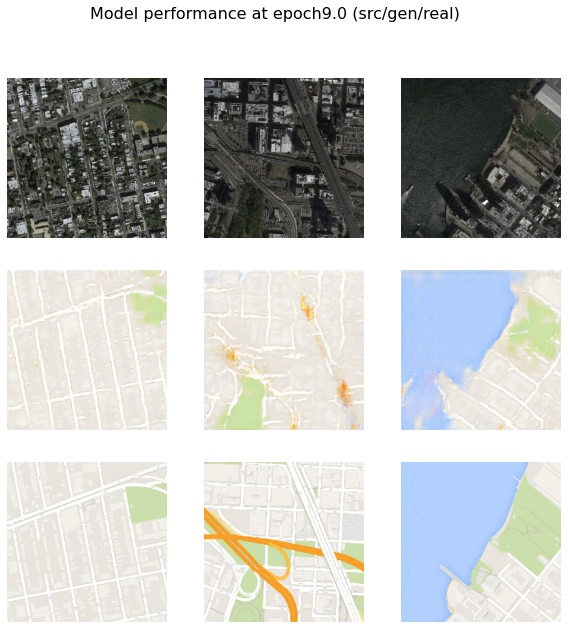

>Saved: plot_epoch9.0.png and model_epoch9.0.h5
step9865: d_loss_real[0.235] d_loss_fake[0.274] gan_loss[6.194]
step9866: d_loss_real[0.304] d_loss_fake[0.184] gan_loss[7.328]
step9867: d_loss_real[0.110] d_loss_fake[0.334] gan_loss[8.431]
step9868: d_loss_real[0.246] d_loss_fake[0.266] gan_loss[6.852]
step9869: d_loss_real[0.629] d_loss_fake[0.173] gan_loss[6.205]
step9870: d_loss_real[0.302] d_loss_fake[0.397] gan_loss[8.052]
step9871: d_loss_real[0.052] d_loss_fake[0.205] gan_loss[7.933]
step9872: d_loss_real[0.233] d_loss_fake[0.319] gan_loss[6.200]
step9873: d_loss_real[0.032] d_loss_fake[0.199] gan_loss[10.590]
step9874: d_loss_real[0.260] d_loss_fake[0.103] gan_loss[10.854]
step9875: d_loss_real[0.076] d_loss_fake[0.226] gan_loss[8.712]
step9876: d_loss_real[0.382] d_loss_fake[0.169] gan_loss[6.718]
step9877: d_loss_real[0.119] d_loss_fake[0.235] gan_loss[7.274]
step9878: d_loss_real[0.129] d_loss_fake[0.148] gan_loss[8.284]
step9879: d_loss_real[0.034] d_loss_fake[0.172] gan_lo

step9990: d_loss_real[0.154] d_loss_fake[0.173] gan_loss[7.034]
step9991: d_loss_real[0.227] d_loss_fake[0.186] gan_loss[7.897]
step9992: d_loss_real[0.105] d_loss_fake[0.369] gan_loss[8.579]
step9993: d_loss_real[0.556] d_loss_fake[0.139] gan_loss[9.422]
step9994: d_loss_real[0.099] d_loss_fake[0.259] gan_loss[8.914]
step9995: d_loss_real[0.074] d_loss_fake[0.197] gan_loss[11.591]
step9996: d_loss_real[0.101] d_loss_fake[0.100] gan_loss[12.693]
step9997: d_loss_real[0.353] d_loss_fake[0.193] gan_loss[6.735]
step9998: d_loss_real[0.073] d_loss_fake[0.076] gan_loss[8.306]
step9999: d_loss_real[0.143] d_loss_fake[0.324] gan_loss[7.906]
step10000: d_loss_real[0.035] d_loss_fake[0.140] gan_loss[11.294]
step10001: d_loss_real[0.044] d_loss_fake[0.098] gan_loss[10.892]
step10002: d_loss_real[0.179] d_loss_fake[0.119] gan_loss[9.697]
step10003: d_loss_real[0.345] d_loss_fake[0.112] gan_loss[7.398]
step10004: d_loss_real[0.056] d_loss_fake[0.097] gan_loss[9.400]
step10005: d_loss_real[0.107] d

step10116: d_loss_real[0.105] d_loss_fake[0.100] gan_loss[10.455]
step10117: d_loss_real[0.566] d_loss_fake[0.172] gan_loss[7.039]
step10118: d_loss_real[0.296] d_loss_fake[0.330] gan_loss[6.949]
step10119: d_loss_real[0.023] d_loss_fake[0.087] gan_loss[13.772]
step10120: d_loss_real[0.139] d_loss_fake[0.212] gan_loss[8.762]
step10121: d_loss_real[0.072] d_loss_fake[0.253] gan_loss[8.052]
step10122: d_loss_real[0.341] d_loss_fake[0.138] gan_loss[8.002]
step10123: d_loss_real[0.223] d_loss_fake[0.243] gan_loss[8.769]
step10124: d_loss_real[0.212] d_loss_fake[0.272] gan_loss[7.592]
step10125: d_loss_real[0.055] d_loss_fake[0.476] gan_loss[3.442]
step10126: d_loss_real[0.605] d_loss_fake[0.211] gan_loss[6.865]
step10127: d_loss_real[0.695] d_loss_fake[0.293] gan_loss[5.433]
step10128: d_loss_real[0.242] d_loss_fake[0.311] gan_loss[6.607]
step10129: d_loss_real[0.544] d_loss_fake[0.282] gan_loss[3.725]
step10130: d_loss_real[0.317] d_loss_fake[0.314] gan_loss[8.870]
step10131: d_loss_real[

step10242: d_loss_real[0.256] d_loss_fake[0.121] gan_loss[8.757]
step10243: d_loss_real[0.219] d_loss_fake[0.240] gan_loss[8.406]
step10244: d_loss_real[0.152] d_loss_fake[0.249] gan_loss[7.724]
step10245: d_loss_real[0.124] d_loss_fake[0.536] gan_loss[6.805]
step10246: d_loss_real[0.030] d_loss_fake[0.087] gan_loss[12.031]
step10247: d_loss_real[0.767] d_loss_fake[0.145] gan_loss[6.894]
step10248: d_loss_real[0.420] d_loss_fake[0.266] gan_loss[9.689]
step10249: d_loss_real[0.448] d_loss_fake[0.326] gan_loss[6.880]
step10250: d_loss_real[0.304] d_loss_fake[0.422] gan_loss[7.580]
step10251: d_loss_real[0.647] d_loss_fake[0.220] gan_loss[6.116]
step10252: d_loss_real[0.203] d_loss_fake[0.463] gan_loss[6.224]
step10253: d_loss_real[0.124] d_loss_fake[0.308] gan_loss[7.712]
step10254: d_loss_real[0.114] d_loss_fake[0.517] gan_loss[3.137]
step10255: d_loss_real[0.220] d_loss_fake[0.150] gan_loss[8.995]
step10256: d_loss_real[0.296] d_loss_fake[0.259] gan_loss[6.845]
step10257: d_loss_real[0

step10368: d_loss_real[0.175] d_loss_fake[0.212] gan_loss[7.171]
step10369: d_loss_real[0.285] d_loss_fake[0.259] gan_loss[6.008]
step10370: d_loss_real[0.123] d_loss_fake[0.150] gan_loss[5.313]
step10371: d_loss_real[0.090] d_loss_fake[0.478] gan_loss[7.517]
step10372: d_loss_real[0.040] d_loss_fake[0.144] gan_loss[9.901]
step10373: d_loss_real[0.287] d_loss_fake[0.190] gan_loss[7.414]
step10374: d_loss_real[0.517] d_loss_fake[0.137] gan_loss[5.744]
step10375: d_loss_real[0.225] d_loss_fake[0.292] gan_loss[6.062]
step10376: d_loss_real[0.113] d_loss_fake[0.248] gan_loss[7.483]
step10377: d_loss_real[0.244] d_loss_fake[0.287] gan_loss[6.122]
step10378: d_loss_real[0.223] d_loss_fake[0.248] gan_loss[8.222]
step10379: d_loss_real[0.187] d_loss_fake[0.196] gan_loss[7.162]
step10380: d_loss_real[0.067] d_loss_fake[0.468] gan_loss[7.054]
step10381: d_loss_real[0.626] d_loss_fake[0.150] gan_loss[7.724]
step10382: d_loss_real[0.186] d_loss_fake[0.265] gan_loss[6.565]
step10383: d_loss_real[0.

step10494: d_loss_real[0.260] d_loss_fake[0.294] gan_loss[6.654]
step10495: d_loss_real[0.062] d_loss_fake[0.635] gan_loss[8.124]
step10496: d_loss_real[0.422] d_loss_fake[0.108] gan_loss[7.743]
step10497: d_loss_real[0.432] d_loss_fake[0.207] gan_loss[6.083]
step10498: d_loss_real[0.132] d_loss_fake[0.152] gan_loss[14.724]
step10499: d_loss_real[0.238] d_loss_fake[0.294] gan_loss[7.385]
step10500: d_loss_real[0.218] d_loss_fake[0.213] gan_loss[8.014]
step10501: d_loss_real[0.430] d_loss_fake[0.268] gan_loss[7.439]
step10502: d_loss_real[0.113] d_loss_fake[0.313] gan_loss[8.186]
step10503: d_loss_real[0.050] d_loss_fake[0.172] gan_loss[11.156]
step10504: d_loss_real[0.184] d_loss_fake[0.120] gan_loss[7.547]
step10505: d_loss_real[0.210] d_loss_fake[0.260] gan_loss[6.276]
step10506: d_loss_real[0.193] d_loss_fake[0.124] gan_loss[6.102]
step10507: d_loss_real[0.201] d_loss_fake[0.209] gan_loss[6.367]
step10508: d_loss_real[0.043] d_loss_fake[0.310] gan_loss[8.046]
step10509: d_loss_real[

step10620: d_loss_real[0.350] d_loss_fake[0.221] gan_loss[8.542]
step10621: d_loss_real[0.160] d_loss_fake[0.254] gan_loss[7.768]
step10622: d_loss_real[0.115] d_loss_fake[0.176] gan_loss[10.889]
step10623: d_loss_real[0.056] d_loss_fake[0.281] gan_loss[8.902]
step10624: d_loss_real[0.102] d_loss_fake[0.130] gan_loss[11.111]
step10625: d_loss_real[0.606] d_loss_fake[0.142] gan_loss[9.056]
step10626: d_loss_real[0.309] d_loss_fake[0.302] gan_loss[7.240]
step10627: d_loss_real[0.238] d_loss_fake[0.466] gan_loss[6.465]
step10628: d_loss_real[0.388] d_loss_fake[0.204] gan_loss[8.813]
step10629: d_loss_real[0.212] d_loss_fake[0.293] gan_loss[8.539]
step10630: d_loss_real[0.126] d_loss_fake[0.522] gan_loss[8.039]
step10631: d_loss_real[0.162] d_loss_fake[0.226] gan_loss[9.587]
step10632: d_loss_real[0.093] d_loss_fake[0.094] gan_loss[10.603]
step10633: d_loss_real[0.039] d_loss_fake[0.076] gan_loss[18.733]
step10634: d_loss_real[0.078] d_loss_fake[0.186] gan_loss[9.766]
step10635: d_loss_rea

step10746: d_loss_real[0.191] d_loss_fake[0.174] gan_loss[10.608]
step10747: d_loss_real[0.317] d_loss_fake[0.327] gan_loss[8.687]
step10748: d_loss_real[0.111] d_loss_fake[0.077] gan_loss[8.828]
step10749: d_loss_real[0.054] d_loss_fake[0.139] gan_loss[10.103]
step10750: d_loss_real[0.059] d_loss_fake[0.120] gan_loss[9.371]
step10751: d_loss_real[0.343] d_loss_fake[0.147] gan_loss[4.591]
step10752: d_loss_real[0.224] d_loss_fake[0.355] gan_loss[6.562]
step10753: d_loss_real[0.165] d_loss_fake[0.180] gan_loss[8.275]
step10754: d_loss_real[0.137] d_loss_fake[0.254] gan_loss[7.005]
step10755: d_loss_real[0.200] d_loss_fake[0.236] gan_loss[7.614]
step10756: d_loss_real[0.643] d_loss_fake[0.216] gan_loss[9.167]
step10757: d_loss_real[0.262] d_loss_fake[0.488] gan_loss[4.405]
step10758: d_loss_real[0.213] d_loss_fake[0.279] gan_loss[7.184]
step10759: d_loss_real[0.070] d_loss_fake[0.090] gan_loss[7.865]
step10760: d_loss_real[0.580] d_loss_fake[0.205] gan_loss[5.729]
step10761: d_loss_real[

step10872: d_loss_real[0.159] d_loss_fake[0.368] gan_loss[7.496]
step10873: d_loss_real[0.405] d_loss_fake[0.223] gan_loss[14.494]
step10874: d_loss_real[0.277] d_loss_fake[0.462] gan_loss[5.542]
step10875: d_loss_real[0.304] d_loss_fake[0.250] gan_loss[7.709]
step10876: d_loss_real[0.065] d_loss_fake[0.334] gan_loss[3.288]
step10877: d_loss_real[0.327] d_loss_fake[0.230] gan_loss[8.517]
step10878: d_loss_real[0.047] d_loss_fake[0.268] gan_loss[9.889]
step10879: d_loss_real[0.640] d_loss_fake[0.132] gan_loss[6.116]
step10880: d_loss_real[0.147] d_loss_fake[0.291] gan_loss[8.846]
step10881: d_loss_real[0.295] d_loss_fake[0.139] gan_loss[12.618]
step10882: d_loss_real[0.330] d_loss_fake[0.267] gan_loss[7.287]
step10883: d_loss_real[0.141] d_loss_fake[0.292] gan_loss[7.843]
step10884: d_loss_real[0.451] d_loss_fake[0.320] gan_loss[7.339]
step10885: d_loss_real[0.245] d_loss_fake[0.362] gan_loss[8.058]
step10886: d_loss_real[0.158] d_loss_fake[0.326] gan_loss[8.211]
step10887: d_loss_real[

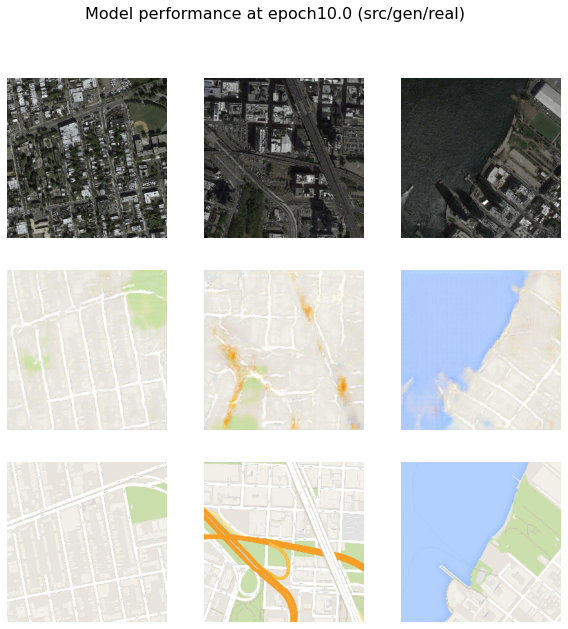

>Saved: plot_epoch10.0.png and model_epoch10.0.h5
step10961: d_loss_real[0.049] d_loss_fake[0.320] gan_loss[8.826]
step10962: d_loss_real[0.080] d_loss_fake[0.300] gan_loss[8.911]
step10963: d_loss_real[0.310] d_loss_fake[0.167] gan_loss[7.265]
step10964: d_loss_real[0.350] d_loss_fake[0.198] gan_loss[7.451]
step10965: d_loss_real[0.200] d_loss_fake[0.344] gan_loss[7.562]
step10966: d_loss_real[0.177] d_loss_fake[0.225] gan_loss[8.172]
step10967: d_loss_real[0.335] d_loss_fake[0.206] gan_loss[6.958]
step10968: d_loss_real[0.057] d_loss_fake[0.219] gan_loss[9.882]
step10969: d_loss_real[0.100] d_loss_fake[0.120] gan_loss[11.882]
step10970: d_loss_real[0.205] d_loss_fake[0.210] gan_loss[6.687]
step10971: d_loss_real[0.218] d_loss_fake[0.356] gan_loss[7.355]
step10972: d_loss_real[0.308] d_loss_fake[0.287] gan_loss[6.061]
step10973: d_loss_real[0.063] d_loss_fake[0.176] gan_loss[9.053]
step10974: d_loss_real[0.149] d_loss_fake[0.199] gan_loss[9.054]
step10975: d_loss_real[0.166] d_loss_fa

step11084: d_loss_real[0.160] d_loss_fake[0.120] gan_loss[5.348]
step11085: d_loss_real[0.129] d_loss_fake[0.092] gan_loss[3.341]
step11086: d_loss_real[0.143] d_loss_fake[0.204] gan_loss[4.749]
step11087: d_loss_real[0.139] d_loss_fake[0.222] gan_loss[9.936]
step11088: d_loss_real[0.108] d_loss_fake[0.147] gan_loss[10.349]
step11089: d_loss_real[0.050] d_loss_fake[0.116] gan_loss[10.996]
step11090: d_loss_real[0.211] d_loss_fake[0.224] gan_loss[8.967]
step11091: d_loss_real[0.092] d_loss_fake[0.184] gan_loss[7.886]
step11092: d_loss_real[0.076] d_loss_fake[0.285] gan_loss[7.463]
step11093: d_loss_real[0.343] d_loss_fake[0.216] gan_loss[7.730]
step11094: d_loss_real[0.327] d_loss_fake[0.150] gan_loss[8.600]
step11095: d_loss_real[0.216] d_loss_fake[0.236] gan_loss[7.887]
step11096: d_loss_real[0.270] d_loss_fake[0.326] gan_loss[6.081]
step11097: d_loss_real[0.098] d_loss_fake[0.309] gan_loss[7.493]
step11098: d_loss_real[0.255] d_loss_fake[0.191] gan_loss[9.821]
step11099: d_loss_real[

step11210: d_loss_real[0.497] d_loss_fake[0.290] gan_loss[5.944]
step11211: d_loss_real[0.154] d_loss_fake[0.291] gan_loss[8.292]
step11212: d_loss_real[0.077] d_loss_fake[0.226] gan_loss[12.547]
step11213: d_loss_real[0.291] d_loss_fake[0.201] gan_loss[8.336]
step11214: d_loss_real[0.250] d_loss_fake[0.487] gan_loss[7.791]
step11215: d_loss_real[0.709] d_loss_fake[0.170] gan_loss[7.141]
step11216: d_loss_real[0.285] d_loss_fake[0.237] gan_loss[8.373]
step11217: d_loss_real[0.076] d_loss_fake[0.279] gan_loss[9.744]
step11218: d_loss_real[0.355] d_loss_fake[0.437] gan_loss[6.329]
step11219: d_loss_real[0.361] d_loss_fake[0.212] gan_loss[6.826]
step11220: d_loss_real[0.260] d_loss_fake[0.317] gan_loss[6.338]
step11221: d_loss_real[0.211] d_loss_fake[0.390] gan_loss[6.691]
step11222: d_loss_real[0.207] d_loss_fake[0.193] gan_loss[8.226]
step11223: d_loss_real[0.175] d_loss_fake[0.308] gan_loss[7.161]
step11224: d_loss_real[0.035] d_loss_fake[0.189] gan_loss[14.448]
step11225: d_loss_real[

step11336: d_loss_real[0.293] d_loss_fake[0.218] gan_loss[6.655]
step11337: d_loss_real[0.201] d_loss_fake[0.137] gan_loss[6.592]
step11338: d_loss_real[0.157] d_loss_fake[0.509] gan_loss[6.424]
step11339: d_loss_real[0.056] d_loss_fake[0.155] gan_loss[8.690]
step11340: d_loss_real[0.077] d_loss_fake[0.118] gan_loss[7.956]
step11341: d_loss_real[0.569] d_loss_fake[0.157] gan_loss[3.942]
step11342: d_loss_real[0.180] d_loss_fake[0.532] gan_loss[8.296]
step11343: d_loss_real[0.323] d_loss_fake[0.268] gan_loss[6.805]
step11344: d_loss_real[0.704] d_loss_fake[0.383] gan_loss[6.445]
step11345: d_loss_real[0.320] d_loss_fake[0.304] gan_loss[5.803]
step11346: d_loss_real[0.379] d_loss_fake[0.219] gan_loss[6.746]
step11347: d_loss_real[0.364] d_loss_fake[0.542] gan_loss[6.382]
step11348: d_loss_real[0.379] d_loss_fake[0.203] gan_loss[5.607]
step11349: d_loss_real[0.048] d_loss_fake[0.327] gan_loss[9.082]
step11350: d_loss_real[0.240] d_loss_fake[0.215] gan_loss[6.097]
step11351: d_loss_real[0.

step11462: d_loss_real[0.237] d_loss_fake[0.222] gan_loss[7.050]
step11463: d_loss_real[0.055] d_loss_fake[0.384] gan_loss[6.839]
step11464: d_loss_real[0.080] d_loss_fake[0.290] gan_loss[5.888]
step11465: d_loss_real[0.659] d_loss_fake[0.143] gan_loss[7.344]
step11466: d_loss_real[0.392] d_loss_fake[0.253] gan_loss[8.594]
step11467: d_loss_real[0.607] d_loss_fake[0.299] gan_loss[4.271]
step11468: d_loss_real[0.214] d_loss_fake[0.359] gan_loss[5.933]
step11469: d_loss_real[0.215] d_loss_fake[0.330] gan_loss[6.443]
step11470: d_loss_real[0.100] d_loss_fake[0.256] gan_loss[7.374]
step11471: d_loss_real[0.095] d_loss_fake[0.239] gan_loss[8.128]
step11472: d_loss_real[0.375] d_loss_fake[0.165] gan_loss[7.600]
step11473: d_loss_real[0.196] d_loss_fake[0.413] gan_loss[6.782]
step11474: d_loss_real[0.316] d_loss_fake[0.194] gan_loss[6.136]
step11475: d_loss_real[0.324] d_loss_fake[0.234] gan_loss[6.873]
step11476: d_loss_real[0.401] d_loss_fake[0.357] gan_loss[5.727]
step11477: d_loss_real[0.

step11588: d_loss_real[0.334] d_loss_fake[0.218] gan_loss[6.661]
step11589: d_loss_real[0.397] d_loss_fake[0.304] gan_loss[7.505]
step11590: d_loss_real[0.352] d_loss_fake[0.205] gan_loss[3.342]
step11591: d_loss_real[0.061] d_loss_fake[0.254] gan_loss[8.362]
step11592: d_loss_real[0.150] d_loss_fake[0.238] gan_loss[6.453]
step11593: d_loss_real[0.084] d_loss_fake[0.134] gan_loss[11.126]
step11594: d_loss_real[0.120] d_loss_fake[0.340] gan_loss[7.691]
step11595: d_loss_real[0.313] d_loss_fake[0.221] gan_loss[6.201]
step11596: d_loss_real[0.250] d_loss_fake[0.358] gan_loss[6.592]
step11597: d_loss_real[0.074] d_loss_fake[0.180] gan_loss[13.656]
step11598: d_loss_real[0.194] d_loss_fake[0.357] gan_loss[5.639]
step11599: d_loss_real[0.238] d_loss_fake[0.142] gan_loss[9.927]
step11600: d_loss_real[0.473] d_loss_fake[0.264] gan_loss[6.779]
step11601: d_loss_real[0.263] d_loss_fake[0.369] gan_loss[5.841]
step11602: d_loss_real[0.040] d_loss_fake[0.104] gan_loss[9.884]
step11603: d_loss_real[

step11714: d_loss_real[0.231] d_loss_fake[0.228] gan_loss[8.400]
step11715: d_loss_real[0.350] d_loss_fake[0.224] gan_loss[6.826]
step11716: d_loss_real[0.217] d_loss_fake[0.251] gan_loss[7.506]
step11717: d_loss_real[0.110] d_loss_fake[0.167] gan_loss[9.047]
step11718: d_loss_real[0.189] d_loss_fake[0.228] gan_loss[8.285]
step11719: d_loss_real[0.062] d_loss_fake[0.121] gan_loss[11.494]
step11720: d_loss_real[0.457] d_loss_fake[0.266] gan_loss[7.653]
step11721: d_loss_real[0.185] d_loss_fake[0.273] gan_loss[9.161]
step11722: d_loss_real[0.123] d_loss_fake[0.144] gan_loss[5.852]
step11723: d_loss_real[0.073] d_loss_fake[0.320] gan_loss[9.178]
step11724: d_loss_real[0.222] d_loss_fake[0.275] gan_loss[6.920]
step11725: d_loss_real[0.212] d_loss_fake[0.230] gan_loss[7.920]
step11726: d_loss_real[0.352] d_loss_fake[0.211] gan_loss[6.515]
step11727: d_loss_real[0.248] d_loss_fake[0.240] gan_loss[7.423]
step11728: d_loss_real[0.180] d_loss_fake[0.259] gan_loss[6.665]
step11729: d_loss_real[0

step11840: d_loss_real[0.255] d_loss_fake[0.167] gan_loss[3.075]
step11841: d_loss_real[0.230] d_loss_fake[0.161] gan_loss[7.093]
step11842: d_loss_real[0.208] d_loss_fake[0.277] gan_loss[6.305]
step11843: d_loss_real[0.112] d_loss_fake[0.176] gan_loss[9.226]
step11844: d_loss_real[0.322] d_loss_fake[0.269] gan_loss[8.298]
step11845: d_loss_real[0.168] d_loss_fake[0.441] gan_loss[5.768]
step11846: d_loss_real[0.260] d_loss_fake[0.189] gan_loss[6.797]
step11847: d_loss_real[0.509] d_loss_fake[0.205] gan_loss[6.531]
step11848: d_loss_real[0.146] d_loss_fake[0.269] gan_loss[4.647]
step11849: d_loss_real[0.160] d_loss_fake[0.292] gan_loss[6.568]
step11850: d_loss_real[0.198] d_loss_fake[0.219] gan_loss[7.858]
step11851: d_loss_real[0.203] d_loss_fake[0.539] gan_loss[7.573]
step11852: d_loss_real[0.426] d_loss_fake[0.165] gan_loss[7.780]
step11853: d_loss_real[0.056] d_loss_fake[0.281] gan_loss[12.528]
step11854: d_loss_real[0.285] d_loss_fake[0.212] gan_loss[7.426]
step11855: d_loss_real[0

step11966: d_loss_real[0.103] d_loss_fake[0.228] gan_loss[8.215]
step11967: d_loss_real[0.052] d_loss_fake[0.114] gan_loss[9.762]
step11968: d_loss_real[0.239] d_loss_fake[0.157] gan_loss[7.571]
step11969: d_loss_real[0.137] d_loss_fake[0.148] gan_loss[4.895]
step11970: d_loss_real[0.236] d_loss_fake[0.321] gan_loss[6.194]
step11971: d_loss_real[0.062] d_loss_fake[0.289] gan_loss[9.778]
step11972: d_loss_real[0.052] d_loss_fake[0.171] gan_loss[13.227]
step11973: d_loss_real[0.227] d_loss_fake[0.181] gan_loss[6.903]
step11974: d_loss_real[0.254] d_loss_fake[0.194] gan_loss[7.931]
step11975: d_loss_real[0.258] d_loss_fake[0.220] gan_loss[6.450]
step11976: d_loss_real[0.035] d_loss_fake[0.323] gan_loss[13.178]
step11977: d_loss_real[0.182] d_loss_fake[0.144] gan_loss[9.843]
step11978: d_loss_real[0.320] d_loss_fake[0.208] gan_loss[6.321]
step11979: d_loss_real[0.159] d_loss_fake[0.333] gan_loss[6.823]
step11980: d_loss_real[0.115] d_loss_fake[0.145] gan_loss[9.750]
step11981: d_loss_real[

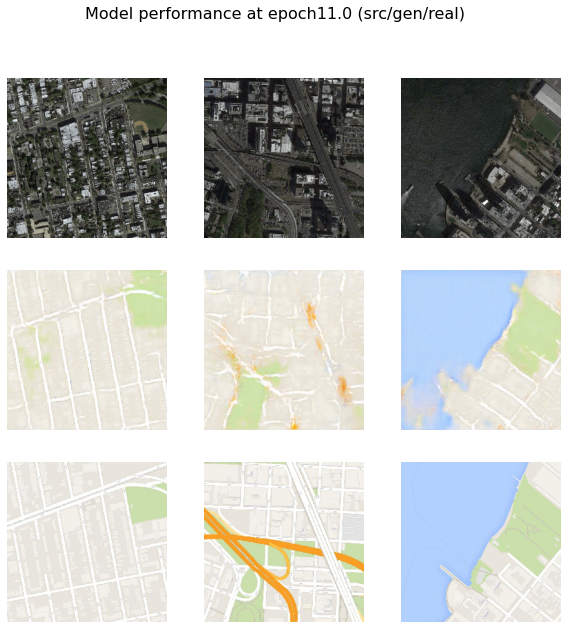

>Saved: plot_epoch11.0.png and model_epoch11.0.h5
step12057: d_loss_real[0.185] d_loss_fake[0.189] gan_loss[8.082]
step12058: d_loss_real[0.281] d_loss_fake[0.238] gan_loss[6.613]
step12059: d_loss_real[0.212] d_loss_fake[0.304] gan_loss[6.465]
step12060: d_loss_real[0.185] d_loss_fake[0.251] gan_loss[7.202]
step12061: d_loss_real[0.339] d_loss_fake[0.349] gan_loss[3.221]
step12062: d_loss_real[0.082] d_loss_fake[0.210] gan_loss[9.112]
step12063: d_loss_real[0.092] d_loss_fake[0.263] gan_loss[8.099]
step12064: d_loss_real[0.589] d_loss_fake[0.162] gan_loss[4.399]
step12065: d_loss_real[0.114] d_loss_fake[0.150] gan_loss[9.967]
step12066: d_loss_real[0.655] d_loss_fake[0.224] gan_loss[7.999]
step12067: d_loss_real[0.063] d_loss_fake[0.196] gan_loss[10.157]
step12068: d_loss_real[0.209] d_loss_fake[0.196] gan_loss[11.081]
step12069: d_loss_real[0.081] d_loss_fake[0.149] gan_loss[10.078]
step12070: d_loss_real[0.182] d_loss_fake[0.232] gan_loss[11.284]
step12071: d_loss_real[0.098] d_loss

step12180: d_loss_real[0.062] d_loss_fake[0.145] gan_loss[9.336]
step12181: d_loss_real[0.331] d_loss_fake[0.353] gan_loss[6.438]
step12182: d_loss_real[0.115] d_loss_fake[0.114] gan_loss[9.397]
step12183: d_loss_real[0.294] d_loss_fake[0.411] gan_loss[8.776]
step12184: d_loss_real[0.234] d_loss_fake[0.310] gan_loss[6.876]
step12185: d_loss_real[0.451] d_loss_fake[0.196] gan_loss[6.879]
step12186: d_loss_real[0.071] d_loss_fake[0.177] gan_loss[10.787]
step12187: d_loss_real[0.399] d_loss_fake[0.180] gan_loss[8.223]
step12188: d_loss_real[0.281] d_loss_fake[0.259] gan_loss[8.175]
step12189: d_loss_real[0.108] d_loss_fake[0.256] gan_loss[8.666]
step12190: d_loss_real[0.062] d_loss_fake[0.546] gan_loss[6.994]
step12191: d_loss_real[0.330] d_loss_fake[0.135] gan_loss[7.054]
step12192: d_loss_real[0.420] d_loss_fake[0.229] gan_loss[6.874]
step12193: d_loss_real[0.449] d_loss_fake[0.353] gan_loss[5.414]
step12194: d_loss_real[0.099] d_loss_fake[0.161] gan_loss[3.342]
step12195: d_loss_real[0

step12306: d_loss_real[0.399] d_loss_fake[0.297] gan_loss[7.963]
step12307: d_loss_real[0.061] d_loss_fake[0.263] gan_loss[7.915]
step12308: d_loss_real[0.322] d_loss_fake[0.304] gan_loss[6.439]
step12309: d_loss_real[0.054] d_loss_fake[0.114] gan_loss[5.672]
step12310: d_loss_real[0.295] d_loss_fake[0.404] gan_loss[4.092]
step12311: d_loss_real[0.178] d_loss_fake[0.295] gan_loss[7.435]
step12312: d_loss_real[0.369] d_loss_fake[0.376] gan_loss[6.118]
step12313: d_loss_real[0.506] d_loss_fake[0.210] gan_loss[6.357]
step12314: d_loss_real[0.166] d_loss_fake[0.216] gan_loss[7.502]
step12315: d_loss_real[0.161] d_loss_fake[0.172] gan_loss[10.276]
step12316: d_loss_real[0.142] d_loss_fake[0.299] gan_loss[6.954]
step12317: d_loss_real[0.066] d_loss_fake[0.154] gan_loss[9.880]
step12318: d_loss_real[0.368] d_loss_fake[0.338] gan_loss[6.034]
step12319: d_loss_real[0.341] d_loss_fake[0.233] gan_loss[7.236]
step12320: d_loss_real[0.241] d_loss_fake[0.279] gan_loss[7.047]
step12321: d_loss_real[0

step12432: d_loss_real[0.220] d_loss_fake[0.213] gan_loss[7.103]
step12433: d_loss_real[0.350] d_loss_fake[0.391] gan_loss[6.043]
step12434: d_loss_real[0.292] d_loss_fake[0.361] gan_loss[7.723]
step12435: d_loss_real[0.160] d_loss_fake[0.416] gan_loss[7.060]
step12436: d_loss_real[0.145] d_loss_fake[0.289] gan_loss[7.807]
step12437: d_loss_real[0.217] d_loss_fake[0.135] gan_loss[7.326]
step12438: d_loss_real[0.313] d_loss_fake[0.167] gan_loss[8.321]
step12439: d_loss_real[0.189] d_loss_fake[0.357] gan_loss[7.231]
step12440: d_loss_real[0.054] d_loss_fake[0.204] gan_loss[11.468]
step12441: d_loss_real[0.511] d_loss_fake[0.164] gan_loss[7.424]
step12442: d_loss_real[0.400] d_loss_fake[0.186] gan_loss[5.935]
step12443: d_loss_real[0.223] d_loss_fake[0.335] gan_loss[6.181]
step12444: d_loss_real[0.039] d_loss_fake[0.338] gan_loss[8.366]
step12445: d_loss_real[0.544] d_loss_fake[0.471] gan_loss[5.188]
step12446: d_loss_real[0.181] d_loss_fake[0.136] gan_loss[8.370]
step12447: d_loss_real[0

step12558: d_loss_real[0.366] d_loss_fake[0.185] gan_loss[6.878]
step12559: d_loss_real[0.293] d_loss_fake[0.223] gan_loss[3.409]
step12560: d_loss_real[0.088] d_loss_fake[0.892] gan_loss[1.767]
step12561: d_loss_real[0.260] d_loss_fake[0.196] gan_loss[7.800]
step12562: d_loss_real[0.209] d_loss_fake[0.326] gan_loss[7.440]
step12563: d_loss_real[0.368] d_loss_fake[0.140] gan_loss[5.708]
step12564: d_loss_real[0.136] d_loss_fake[0.139] gan_loss[6.995]
step12565: d_loss_real[0.088] d_loss_fake[0.206] gan_loss[7.533]
step12566: d_loss_real[0.151] d_loss_fake[0.244] gan_loss[8.736]
step12567: d_loss_real[0.305] d_loss_fake[0.210] gan_loss[9.909]
step12568: d_loss_real[0.067] d_loss_fake[0.148] gan_loss[9.207]
step12569: d_loss_real[0.341] d_loss_fake[0.175] gan_loss[7.244]
step12570: d_loss_real[0.059] d_loss_fake[0.160] gan_loss[11.119]
step12571: d_loss_real[0.118] d_loss_fake[0.435] gan_loss[8.231]
step12572: d_loss_real[0.294] d_loss_fake[0.185] gan_loss[5.624]
step12573: d_loss_real[0

step12684: d_loss_real[0.100] d_loss_fake[0.288] gan_loss[9.560]
step12685: d_loss_real[0.334] d_loss_fake[0.149] gan_loss[4.586]
step12686: d_loss_real[0.619] d_loss_fake[0.181] gan_loss[6.753]
step12687: d_loss_real[0.075] d_loss_fake[0.172] gan_loss[12.969]
step12688: d_loss_real[0.097] d_loss_fake[0.307] gan_loss[5.794]
step12689: d_loss_real[0.601] d_loss_fake[0.215] gan_loss[5.336]
step12690: d_loss_real[0.123] d_loss_fake[0.361] gan_loss[6.738]
step12691: d_loss_real[0.368] d_loss_fake[0.209] gan_loss[6.196]
step12692: d_loss_real[0.090] d_loss_fake[0.164] gan_loss[9.603]
step12693: d_loss_real[0.208] d_loss_fake[0.292] gan_loss[6.128]
step12694: d_loss_real[0.057] d_loss_fake[0.189] gan_loss[9.442]
step12695: d_loss_real[0.128] d_loss_fake[0.165] gan_loss[7.756]
step12696: d_loss_real[0.303] d_loss_fake[0.239] gan_loss[6.952]
step12697: d_loss_real[0.283] d_loss_fake[0.218] gan_loss[6.566]
step12698: d_loss_real[0.049] d_loss_fake[0.313] gan_loss[8.660]
step12699: d_loss_real[0

step12810: d_loss_real[0.171] d_loss_fake[0.182] gan_loss[8.354]
step12811: d_loss_real[0.082] d_loss_fake[0.313] gan_loss[9.222]
step12812: d_loss_real[0.128] d_loss_fake[0.126] gan_loss[11.864]
step12813: d_loss_real[0.340] d_loss_fake[0.439] gan_loss[3.066]
step12814: d_loss_real[0.101] d_loss_fake[0.179] gan_loss[7.499]
step12815: d_loss_real[0.575] d_loss_fake[0.179] gan_loss[7.121]
step12816: d_loss_real[0.255] d_loss_fake[0.270] gan_loss[7.731]
step12817: d_loss_real[0.478] d_loss_fake[0.284] gan_loss[6.593]
step12818: d_loss_real[0.282] d_loss_fake[0.246] gan_loss[7.504]
step12819: d_loss_real[0.092] d_loss_fake[0.376] gan_loss[8.888]
step12820: d_loss_real[0.088] d_loss_fake[0.154] gan_loss[16.324]
step12821: d_loss_real[0.311] d_loss_fake[0.210] gan_loss[9.908]
step12822: d_loss_real[0.245] d_loss_fake[0.236] gan_loss[7.424]
step12823: d_loss_real[0.073] d_loss_fake[0.168] gan_loss[9.591]
step12824: d_loss_real[0.384] d_loss_fake[0.221] gan_loss[6.121]
step12825: d_loss_real[

step12936: d_loss_real[0.528] d_loss_fake[0.183] gan_loss[7.222]
step12937: d_loss_real[0.094] d_loss_fake[0.147] gan_loss[12.676]
step12938: d_loss_real[0.288] d_loss_fake[0.245] gan_loss[7.254]
step12939: d_loss_real[0.254] d_loss_fake[0.214] gan_loss[4.120]
step12940: d_loss_real[0.295] d_loss_fake[0.410] gan_loss[5.743]
step12941: d_loss_real[0.234] d_loss_fake[0.226] gan_loss[7.391]
step12942: d_loss_real[0.098] d_loss_fake[0.387] gan_loss[7.548]
step12943: d_loss_real[0.429] d_loss_fake[0.206] gan_loss[6.335]
step12944: d_loss_real[0.094] d_loss_fake[0.190] gan_loss[10.605]
step12945: d_loss_real[0.069] d_loss_fake[0.172] gan_loss[7.968]
step12946: d_loss_real[0.330] d_loss_fake[0.285] gan_loss[6.570]
step12947: d_loss_real[0.084] d_loss_fake[0.221] gan_loss[11.241]
step12948: d_loss_real[0.493] d_loss_fake[0.202] gan_loss[6.563]
step12949: d_loss_real[0.223] d_loss_fake[0.196] gan_loss[9.127]
step12950: d_loss_real[0.339] d_loss_fake[0.432] gan_loss[6.828]
step12951: d_loss_real

step13062: d_loss_real[0.085] d_loss_fake[0.192] gan_loss[7.380]
step13063: d_loss_real[0.366] d_loss_fake[0.185] gan_loss[2.864]
step13064: d_loss_real[0.294] d_loss_fake[0.350] gan_loss[6.718]
step13065: d_loss_real[0.322] d_loss_fake[0.387] gan_loss[5.962]
step13066: d_loss_real[0.281] d_loss_fake[0.466] gan_loss[4.912]
step13067: d_loss_real[0.201] d_loss_fake[0.199] gan_loss[7.082]
step13068: d_loss_real[0.063] d_loss_fake[0.160] gan_loss[9.320]
step13069: d_loss_real[0.433] d_loss_fake[0.397] gan_loss[9.116]
step13070: d_loss_real[0.313] d_loss_fake[0.290] gan_loss[6.330]
step13071: d_loss_real[0.056] d_loss_fake[0.188] gan_loss[7.995]
step13072: d_loss_real[0.071] d_loss_fake[0.263] gan_loss[9.951]
step13073: d_loss_real[0.408] d_loss_fake[0.214] gan_loss[7.476]
step13074: d_loss_real[0.140] d_loss_fake[0.224] gan_loss[7.213]
step13075: d_loss_real[0.463] d_loss_fake[0.384] gan_loss[4.410]
step13076: d_loss_real[0.231] d_loss_fake[0.253] gan_loss[7.301]
step13077: d_loss_real[0.

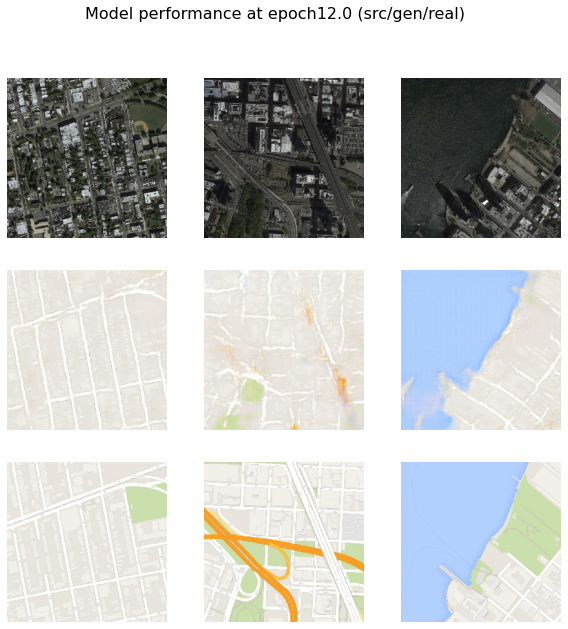

>Saved: plot_epoch12.0.png and model_epoch12.0.h5
step13153: d_loss_real[0.199] d_loss_fake[0.283] gan_loss[7.623]
step13154: d_loss_real[0.250] d_loss_fake[0.262] gan_loss[6.923]
step13155: d_loss_real[0.166] d_loss_fake[0.194] gan_loss[7.762]
step13156: d_loss_real[0.093] d_loss_fake[0.163] gan_loss[9.553]
step13157: d_loss_real[0.277] d_loss_fake[0.183] gan_loss[8.248]
step13158: d_loss_real[0.201] d_loss_fake[0.237] gan_loss[6.556]
step13159: d_loss_real[0.072] d_loss_fake[0.206] gan_loss[8.206]
step13160: d_loss_real[0.119] d_loss_fake[0.331] gan_loss[8.383]
step13161: d_loss_real[0.248] d_loss_fake[0.192] gan_loss[7.366]
step13162: d_loss_real[0.233] d_loss_fake[0.177] gan_loss[8.165]
step13163: d_loss_real[0.296] d_loss_fake[0.458] gan_loss[5.850]
step13164: d_loss_real[0.322] d_loss_fake[0.278] gan_loss[5.839]
step13165: d_loss_real[0.053] d_loss_fake[0.381] gan_loss[9.143]
step13166: d_loss_real[0.457] d_loss_fake[0.124] gan_loss[6.899]
step13167: d_loss_real[0.081] d_loss_fak

step13276: d_loss_real[0.175] d_loss_fake[0.255] gan_loss[7.216]
step13277: d_loss_real[0.140] d_loss_fake[0.169] gan_loss[7.730]
step13278: d_loss_real[0.381] d_loss_fake[0.226] gan_loss[6.948]
step13279: d_loss_real[0.305] d_loss_fake[0.307] gan_loss[5.712]
step13280: d_loss_real[0.101] d_loss_fake[0.560] gan_loss[2.801]
step13281: d_loss_real[0.202] d_loss_fake[0.383] gan_loss[7.151]
step13282: d_loss_real[0.561] d_loss_fake[0.175] gan_loss[8.342]
step13283: d_loss_real[0.266] d_loss_fake[0.269] gan_loss[7.139]
step13284: d_loss_real[0.451] d_loss_fake[0.439] gan_loss[8.806]
step13285: d_loss_real[0.244] d_loss_fake[0.316] gan_loss[7.592]
step13286: d_loss_real[0.205] d_loss_fake[0.369] gan_loss[6.515]
step13287: d_loss_real[0.060] d_loss_fake[0.218] gan_loss[8.859]
step13288: d_loss_real[0.413] d_loss_fake[0.230] gan_loss[8.240]
step13289: d_loss_real[0.342] d_loss_fake[0.243] gan_loss[6.379]
step13290: d_loss_real[0.064] d_loss_fake[0.228] gan_loss[12.141]
step13291: d_loss_real[0

step13402: d_loss_real[0.060] d_loss_fake[0.220] gan_loss[10.207]
step13403: d_loss_real[0.244] d_loss_fake[0.191] gan_loss[6.925]
step13404: d_loss_real[0.388] d_loss_fake[0.229] gan_loss[6.045]
step13405: d_loss_real[0.452] d_loss_fake[0.297] gan_loss[5.747]
step13406: d_loss_real[0.112] d_loss_fake[0.289] gan_loss[5.360]
step13407: d_loss_real[0.127] d_loss_fake[0.337] gan_loss[4.578]
step13408: d_loss_real[0.188] d_loss_fake[0.212] gan_loss[7.199]
step13409: d_loss_real[0.123] d_loss_fake[0.345] gan_loss[6.720]
step13410: d_loss_real[0.148] d_loss_fake[0.180] gan_loss[10.718]
step13411: d_loss_real[0.068] d_loss_fake[0.150] gan_loss[9.773]
step13412: d_loss_real[0.349] d_loss_fake[0.258] gan_loss[7.139]
step13413: d_loss_real[0.205] d_loss_fake[0.254] gan_loss[7.861]
step13414: d_loss_real[0.235] d_loss_fake[0.385] gan_loss[5.993]
step13415: d_loss_real[0.046] d_loss_fake[0.224] gan_loss[8.552]
step13416: d_loss_real[0.367] d_loss_fake[0.177] gan_loss[6.583]
step13417: d_loss_real[

step13528: d_loss_real[0.364] d_loss_fake[0.342] gan_loss[5.611]
step13529: d_loss_real[0.120] d_loss_fake[0.167] gan_loss[5.250]
step13530: d_loss_real[0.116] d_loss_fake[0.661] gan_loss[2.607]
step13531: d_loss_real[0.285] d_loss_fake[0.269] gan_loss[7.857]
step13532: d_loss_real[0.074] d_loss_fake[0.155] gan_loss[8.450]
step13533: d_loss_real[0.153] d_loss_fake[0.157] gan_loss[7.810]
step13534: d_loss_real[0.245] d_loss_fake[0.414] gan_loss[4.835]
step13535: d_loss_real[0.066] d_loss_fake[0.129] gan_loss[8.910]
step13536: d_loss_real[0.131] d_loss_fake[0.126] gan_loss[9.010]
step13537: d_loss_real[0.085] d_loss_fake[0.227] gan_loss[9.803]
step13538: d_loss_real[0.157] d_loss_fake[0.148] gan_loss[9.765]
step13539: d_loss_real[0.661] d_loss_fake[0.120] gan_loss[6.941]
step13540: d_loss_real[0.217] d_loss_fake[0.169] gan_loss[10.146]
step13541: d_loss_real[0.231] d_loss_fake[0.339] gan_loss[6.337]
step13542: d_loss_real[0.067] d_loss_fake[0.310] gan_loss[8.211]
step13543: d_loss_real[0

step13654: d_loss_real[0.316] d_loss_fake[0.225] gan_loss[8.490]
step13655: d_loss_real[0.154] d_loss_fake[0.453] gan_loss[8.177]
step13656: d_loss_real[0.068] d_loss_fake[0.185] gan_loss[11.103]
step13657: d_loss_real[0.289] d_loss_fake[0.219] gan_loss[7.833]
step13658: d_loss_real[0.479] d_loss_fake[0.205] gan_loss[6.719]
step13659: d_loss_real[0.230] d_loss_fake[0.203] gan_loss[4.381]
step13660: d_loss_real[0.323] d_loss_fake[0.542] gan_loss[5.866]
step13661: d_loss_real[0.174] d_loss_fake[0.478] gan_loss[7.056]
step13662: d_loss_real[0.304] d_loss_fake[0.255] gan_loss[6.249]
step13663: d_loss_real[0.279] d_loss_fake[0.273] gan_loss[8.094]
step13664: d_loss_real[0.287] d_loss_fake[0.186] gan_loss[7.131]
step13665: d_loss_real[0.220] d_loss_fake[0.234] gan_loss[6.971]
step13666: d_loss_real[0.372] d_loss_fake[0.408] gan_loss[6.862]
step13667: d_loss_real[0.524] d_loss_fake[0.323] gan_loss[6.223]
step13668: d_loss_real[0.111] d_loss_fake[0.283] gan_loss[8.025]
step13669: d_loss_real[0

step13780: d_loss_real[0.652] d_loss_fake[0.240] gan_loss[7.847]
step13781: d_loss_real[0.493] d_loss_fake[0.196] gan_loss[7.807]
step13782: d_loss_real[0.240] d_loss_fake[0.273] gan_loss[7.478]
step13783: d_loss_real[0.051] d_loss_fake[0.205] gan_loss[9.909]
step13784: d_loss_real[0.182] d_loss_fake[0.205] gan_loss[7.319]
step13785: d_loss_real[0.344] d_loss_fake[0.231] gan_loss[7.892]
step13786: d_loss_real[0.067] d_loss_fake[0.281] gan_loss[9.766]
step13787: d_loss_real[0.173] d_loss_fake[0.324] gan_loss[6.902]
step13788: d_loss_real[0.220] d_loss_fake[0.202] gan_loss[5.436]
step13789: d_loss_real[0.511] d_loss_fake[0.209] gan_loss[6.436]
step13790: d_loss_real[0.183] d_loss_fake[0.431] gan_loss[6.479]
step13791: d_loss_real[0.053] d_loss_fake[0.132] gan_loss[12.448]
step13792: d_loss_real[0.286] d_loss_fake[0.172] gan_loss[8.438]
step13793: d_loss_real[0.138] d_loss_fake[0.219] gan_loss[7.226]
step13794: d_loss_real[0.297] d_loss_fake[0.421] gan_loss[6.645]
step13795: d_loss_real[0

step13906: d_loss_real[0.345] d_loss_fake[0.172] gan_loss[6.610]
step13907: d_loss_real[0.068] d_loss_fake[0.136] gan_loss[10.665]
step13908: d_loss_real[0.217] d_loss_fake[0.191] gan_loss[5.814]
step13909: d_loss_real[0.243] d_loss_fake[0.389] gan_loss[3.720]
step13910: d_loss_real[0.228] d_loss_fake[0.257] gan_loss[7.746]
step13911: d_loss_real[0.082] d_loss_fake[0.247] gan_loss[6.317]
step13912: d_loss_real[0.327] d_loss_fake[0.228] gan_loss[7.177]
step13913: d_loss_real[0.143] d_loss_fake[0.190] gan_loss[12.474]
step13914: d_loss_real[0.243] d_loss_fake[0.387] gan_loss[6.000]
step13915: d_loss_real[0.093] d_loss_fake[0.311] gan_loss[8.359]
step13916: d_loss_real[0.434] d_loss_fake[0.272] gan_loss[5.497]
step13917: d_loss_real[0.276] d_loss_fake[0.154] gan_loss[8.154]
step13918: d_loss_real[0.460] d_loss_fake[0.141] gan_loss[3.625]
step13919: d_loss_real[0.105] d_loss_fake[0.586] gan_loss[7.526]
step13920: d_loss_real[0.205] d_loss_fake[0.315] gan_loss[7.076]
step13921: d_loss_real[

step14032: d_loss_real[0.047] d_loss_fake[0.325] gan_loss[11.223]
step14033: d_loss_real[0.162] d_loss_fake[0.188] gan_loss[7.407]
step14034: d_loss_real[0.301] d_loss_fake[0.402] gan_loss[8.114]
step14035: d_loss_real[0.248] d_loss_fake[0.216] gan_loss[8.190]
step14036: d_loss_real[0.541] d_loss_fake[0.526] gan_loss[4.183]
step14037: d_loss_real[0.244] d_loss_fake[0.394] gan_loss[7.559]
step14038: d_loss_real[0.310] d_loss_fake[0.334] gan_loss[6.047]
step14039: d_loss_real[0.393] d_loss_fake[0.254] gan_loss[6.106]
step14040: d_loss_real[0.113] d_loss_fake[0.216] gan_loss[8.871]
step14041: d_loss_real[0.111] d_loss_fake[0.180] gan_loss[7.676]
step14042: d_loss_real[0.252] d_loss_fake[0.262] gan_loss[4.637]
step14043: d_loss_real[0.059] d_loss_fake[0.171] gan_loss[9.023]
step14044: d_loss_real[0.078] d_loss_fake[0.201] gan_loss[11.278]
step14045: d_loss_real[0.120] d_loss_fake[0.187] gan_loss[9.788]
step14046: d_loss_real[0.177] d_loss_fake[0.218] gan_loss[7.358]
step14047: d_loss_real[

step14158: d_loss_real[0.337] d_loss_fake[0.267] gan_loss[6.289]
step14159: d_loss_real[0.326] d_loss_fake[0.310] gan_loss[5.843]
step14160: d_loss_real[0.055] d_loss_fake[0.457] gan_loss[7.303]
step14161: d_loss_real[0.231] d_loss_fake[0.208] gan_loss[6.772]
step14162: d_loss_real[0.312] d_loss_fake[0.252] gan_loss[5.998]
step14163: d_loss_real[0.382] d_loss_fake[0.169] gan_loss[3.049]
step14164: d_loss_real[0.241] d_loss_fake[0.185] gan_loss[7.008]
step14165: d_loss_real[0.231] d_loss_fake[0.402] gan_loss[5.975]
step14166: d_loss_real[0.287] d_loss_fake[0.291] gan_loss[6.001]
step14167: d_loss_real[0.130] d_loss_fake[0.247] gan_loss[8.596]
step14168: d_loss_real[0.080] d_loss_fake[0.173] gan_loss[11.958]
step14169: d_loss_real[0.442] d_loss_fake[0.330] gan_loss[3.312]
step14170: d_loss_real[0.264] d_loss_fake[0.434] gan_loss[6.481]
step14171: d_loss_real[0.255] d_loss_fake[0.305] gan_loss[5.748]
step14172: d_loss_real[0.109] d_loss_fake[0.178] gan_loss[7.282]
step14173: d_loss_real[0

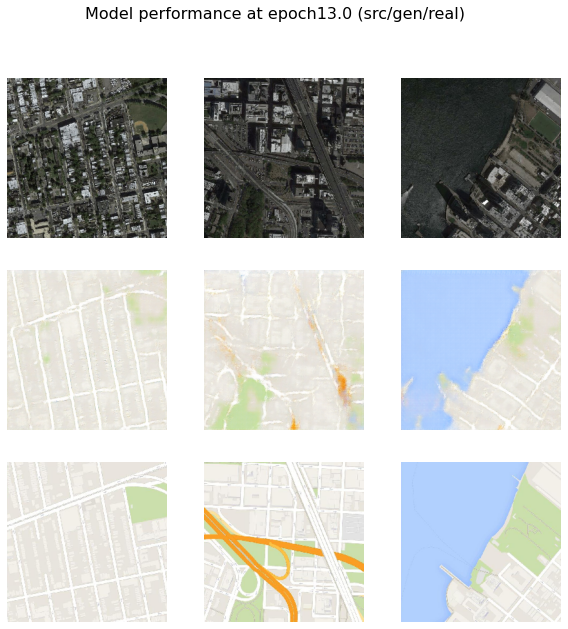

>Saved: plot_epoch13.0.png and model_epoch13.0.h5
step14249: d_loss_real[0.084] d_loss_fake[0.286] gan_loss[7.784]
step14250: d_loss_real[0.605] d_loss_fake[0.218] gan_loss[5.541]
step14251: d_loss_real[0.353] d_loss_fake[0.190] gan_loss[8.104]
step14252: d_loss_real[0.082] d_loss_fake[0.227] gan_loss[12.883]
step14253: d_loss_real[0.115] d_loss_fake[0.306] gan_loss[5.364]
step14254: d_loss_real[0.258] d_loss_fake[0.341] gan_loss[6.611]
step14255: d_loss_real[0.515] d_loss_fake[0.247] gan_loss[5.497]
step14256: d_loss_real[0.326] d_loss_fake[0.213] gan_loss[6.017]
step14257: d_loss_real[0.258] d_loss_fake[0.253] gan_loss[6.631]
step14258: d_loss_real[0.241] d_loss_fake[0.385] gan_loss[5.872]
step14259: d_loss_real[0.228] d_loss_fake[0.277] gan_loss[6.103]
step14260: d_loss_real[0.080] d_loss_fake[0.219] gan_loss[7.272]
step14261: d_loss_real[0.299] d_loss_fake[0.518] gan_loss[4.563]
step14262: d_loss_real[0.137] d_loss_fake[0.196] gan_loss[10.535]
step14263: d_loss_real[0.105] d_loss_f

step14372: d_loss_real[0.080] d_loss_fake[0.190] gan_loss[7.126]
step14373: d_loss_real[0.104] d_loss_fake[0.296] gan_loss[6.703]
step14374: d_loss_real[0.063] d_loss_fake[0.134] gan_loss[8.283]
step14375: d_loss_real[0.351] d_loss_fake[0.248] gan_loss[8.229]
step14376: d_loss_real[0.359] d_loss_fake[0.657] gan_loss[2.387]
step14377: d_loss_real[0.127] d_loss_fake[0.149] gan_loss[8.101]
step14378: d_loss_real[0.441] d_loss_fake[0.230] gan_loss[5.573]
step14379: d_loss_real[0.093] d_loss_fake[0.211] gan_loss[9.842]
step14380: d_loss_real[0.430] d_loss_fake[0.175] gan_loss[3.808]
step14381: d_loss_real[0.188] d_loss_fake[0.467] gan_loss[7.249]
step14382: d_loss_real[0.183] d_loss_fake[0.306] gan_loss[6.472]
step14383: d_loss_real[0.105] d_loss_fake[0.147] gan_loss[8.807]
step14384: d_loss_real[0.091] d_loss_fake[0.152] gan_loss[8.424]
step14385: d_loss_real[0.091] d_loss_fake[0.149] gan_loss[9.116]
step14386: d_loss_real[0.532] d_loss_fake[0.196] gan_loss[6.316]
step14387: d_loss_real[0.

step14498: d_loss_real[0.126] d_loss_fake[0.359] gan_loss[6.757]
step14499: d_loss_real[0.098] d_loss_fake[0.136] gan_loss[10.221]
step14500: d_loss_real[0.353] d_loss_fake[0.220] gan_loss[6.202]
step14501: d_loss_real[0.259] d_loss_fake[0.295] gan_loss[6.258]
step14502: d_loss_real[0.349] d_loss_fake[0.337] gan_loss[7.502]
step14503: d_loss_real[0.211] d_loss_fake[0.272] gan_loss[6.671]
step14504: d_loss_real[0.045] d_loss_fake[0.252] gan_loss[8.082]
step14505: d_loss_real[0.327] d_loss_fake[0.206] gan_loss[6.843]
step14506: d_loss_real[0.235] d_loss_fake[0.377] gan_loss[6.363]
step14507: d_loss_real[0.302] d_loss_fake[0.278] gan_loss[6.397]
step14508: d_loss_real[0.114] d_loss_fake[0.157] gan_loss[10.333]
step14509: d_loss_real[0.051] d_loss_fake[0.140] gan_loss[11.799]
step14510: d_loss_real[0.432] d_loss_fake[0.271] gan_loss[5.196]
step14511: d_loss_real[0.420] d_loss_fake[0.408] gan_loss[7.184]
step14512: d_loss_real[0.269] d_loss_fake[0.333] gan_loss[5.845]
step14513: d_loss_real

step14624: d_loss_real[0.331] d_loss_fake[0.304] gan_loss[6.549]
step14625: d_loss_real[0.111] d_loss_fake[0.349] gan_loss[7.712]
step14626: d_loss_real[0.333] d_loss_fake[0.221] gan_loss[6.361]
step14627: d_loss_real[0.278] d_loss_fake[0.281] gan_loss[5.204]
step14628: d_loss_real[0.475] d_loss_fake[0.216] gan_loss[7.687]
step14629: d_loss_real[0.126] d_loss_fake[0.709] gan_loss[2.307]
step14630: d_loss_real[0.210] d_loss_fake[0.417] gan_loss[7.052]
step14631: d_loss_real[0.453] d_loss_fake[0.164] gan_loss[7.794]
step14632: d_loss_real[0.720] d_loss_fake[0.201] gan_loss[4.592]
step14633: d_loss_real[0.277] d_loss_fake[0.330] gan_loss[5.966]
step14634: d_loss_real[0.160] d_loss_fake[0.294] gan_loss[6.608]
step14635: d_loss_real[0.630] d_loss_fake[0.222] gan_loss[2.893]
step14636: d_loss_real[0.117] d_loss_fake[0.323] gan_loss[5.969]
step14637: d_loss_real[0.374] d_loss_fake[0.387] gan_loss[5.691]
step14638: d_loss_real[0.077] d_loss_fake[0.189] gan_loss[6.631]
step14639: d_loss_real[0.

step14750: d_loss_real[0.195] d_loss_fake[0.215] gan_loss[6.016]
step14751: d_loss_real[0.059] d_loss_fake[0.127] gan_loss[9.684]
step14752: d_loss_real[0.061] d_loss_fake[0.121] gan_loss[7.318]
step14753: d_loss_real[0.081] d_loss_fake[0.115] gan_loss[7.386]
step14754: d_loss_real[0.322] d_loss_fake[0.287] gan_loss[7.085]
step14755: d_loss_real[0.170] d_loss_fake[0.230] gan_loss[6.164]
step14756: d_loss_real[0.146] d_loss_fake[0.250] gan_loss[6.356]
step14757: d_loss_real[0.110] d_loss_fake[0.338] gan_loss[8.134]
step14758: d_loss_real[0.599] d_loss_fake[0.142] gan_loss[8.921]
step14759: d_loss_real[0.095] d_loss_fake[0.292] gan_loss[7.200]
step14760: d_loss_real[0.479] d_loss_fake[0.177] gan_loss[6.029]
step14761: d_loss_real[0.525] d_loss_fake[0.225] gan_loss[3.614]
step14762: d_loss_real[0.189] d_loss_fake[0.531] gan_loss[3.737]
step14763: d_loss_real[0.288] d_loss_fake[0.245] gan_loss[5.762]
step14764: d_loss_real[0.186] d_loss_fake[0.222] gan_loss[5.360]
step14765: d_loss_real[0.

step14876: d_loss_real[0.100] d_loss_fake[0.257] gan_loss[4.965]
step14877: d_loss_real[0.473] d_loss_fake[0.214] gan_loss[6.432]
step14878: d_loss_real[0.147] d_loss_fake[0.212] gan_loss[6.537]
step14879: d_loss_real[0.197] d_loss_fake[0.320] gan_loss[6.482]
step14880: d_loss_real[0.119] d_loss_fake[0.577] gan_loss[6.664]
step14881: d_loss_real[0.238] d_loss_fake[0.193] gan_loss[5.273]
step14882: d_loss_real[0.582] d_loss_fake[0.208] gan_loss[7.265]
step14883: d_loss_real[0.422] d_loss_fake[0.196] gan_loss[7.563]
step14884: d_loss_real[0.389] d_loss_fake[0.263] gan_loss[6.553]
step14885: d_loss_real[0.378] d_loss_fake[0.469] gan_loss[5.053]
step14886: d_loss_real[0.180] d_loss_fake[0.407] gan_loss[7.741]
step14887: d_loss_real[0.170] d_loss_fake[0.327] gan_loss[7.827]
step14888: d_loss_real[0.123] d_loss_fake[0.146] gan_loss[10.253]
step14889: d_loss_real[0.519] d_loss_fake[0.181] gan_loss[6.673]
step14890: d_loss_real[0.341] d_loss_fake[0.229] gan_loss[6.608]
step14891: d_loss_real[0

step15002: d_loss_real[0.383] d_loss_fake[0.228] gan_loss[6.236]
step15003: d_loss_real[0.107] d_loss_fake[0.249] gan_loss[8.426]
step15004: d_loss_real[0.173] d_loss_fake[0.405] gan_loss[8.924]
step15005: d_loss_real[0.352] d_loss_fake[0.272] gan_loss[6.023]
step15006: d_loss_real[0.284] d_loss_fake[0.334] gan_loss[6.461]
step15007: d_loss_real[0.224] d_loss_fake[0.328] gan_loss[6.452]
step15008: d_loss_real[0.064] d_loss_fake[0.234] gan_loss[10.658]
step15009: d_loss_real[0.067] d_loss_fake[0.121] gan_loss[9.090]
step15010: d_loss_real[0.389] d_loss_fake[0.184] gan_loss[7.987]
step15011: d_loss_real[0.207] d_loss_fake[0.512] gan_loss[7.509]
step15012: d_loss_real[0.173] d_loss_fake[0.187] gan_loss[8.454]
step15013: d_loss_real[0.102] d_loss_fake[0.117] gan_loss[7.499]
step15014: d_loss_real[0.571] d_loss_fake[0.176] gan_loss[7.091]
step15015: d_loss_real[0.214] d_loss_fake[0.336] gan_loss[6.517]
step15016: d_loss_real[0.072] d_loss_fake[0.226] gan_loss[9.340]
step15017: d_loss_real[0

step15128: d_loss_real[0.183] d_loss_fake[0.386] gan_loss[7.483]
step15129: d_loss_real[0.141] d_loss_fake[0.199] gan_loss[7.510]
step15130: d_loss_real[0.104] d_loss_fake[0.166] gan_loss[8.340]
step15131: d_loss_real[0.087] d_loss_fake[0.103] gan_loss[8.273]
step15132: d_loss_real[0.498] d_loss_fake[0.149] gan_loss[7.423]
step15133: d_loss_real[0.212] d_loss_fake[0.170] gan_loss[5.534]
step15134: d_loss_real[0.173] d_loss_fake[0.318] gan_loss[5.696]
step15135: d_loss_real[0.170] d_loss_fake[0.115] gan_loss[3.890]
step15136: d_loss_real[0.071] d_loss_fake[0.138] gan_loss[8.476]
step15137: d_loss_real[0.051] d_loss_fake[0.125] gan_loss[7.172]
step15138: d_loss_real[0.209] d_loss_fake[0.288] gan_loss[7.671]
step15139: d_loss_real[0.224] d_loss_fake[0.303] gan_loss[6.504]
step15140: d_loss_real[0.145] d_loss_fake[0.230] gan_loss[5.591]
step15141: d_loss_real[0.280] d_loss_fake[0.254] gan_loss[7.800]
step15142: d_loss_real[0.060] d_loss_fake[0.103] gan_loss[4.691]
step15143: d_loss_real[0.

step15254: d_loss_real[0.518] d_loss_fake[0.346] gan_loss[4.686]
step15255: d_loss_real[0.232] d_loss_fake[0.290] gan_loss[5.709]
step15256: d_loss_real[0.078] d_loss_fake[0.240] gan_loss[7.239]
step15257: d_loss_real[0.127] d_loss_fake[0.377] gan_loss[6.969]
step15258: d_loss_real[0.169] d_loss_fake[0.218] gan_loss[7.093]
step15259: d_loss_real[0.509] d_loss_fake[0.209] gan_loss[5.642]
step15260: d_loss_real[0.390] d_loss_fake[0.268] gan_loss[5.306]
step15261: d_loss_real[0.067] d_loss_fake[0.182] gan_loss[10.539]
step15262: d_loss_real[0.182] d_loss_fake[0.425] gan_loss[3.046]
step15263: d_loss_real[0.414] d_loss_fake[0.244] gan_loss[6.541]
step15264: d_loss_real[0.469] d_loss_fake[0.475] gan_loss[3.034]
step15265: d_loss_real[0.146] d_loss_fake[0.396] gan_loss[6.636]
step15266: d_loss_real[0.371] d_loss_fake[0.228] gan_loss[6.362]
step15267: d_loss_real[0.164] d_loss_fake[0.190] gan_loss[9.167]
step15268: d_loss_real[0.210] d_loss_fake[0.368] gan_loss[5.601]
step15269: d_loss_real[0

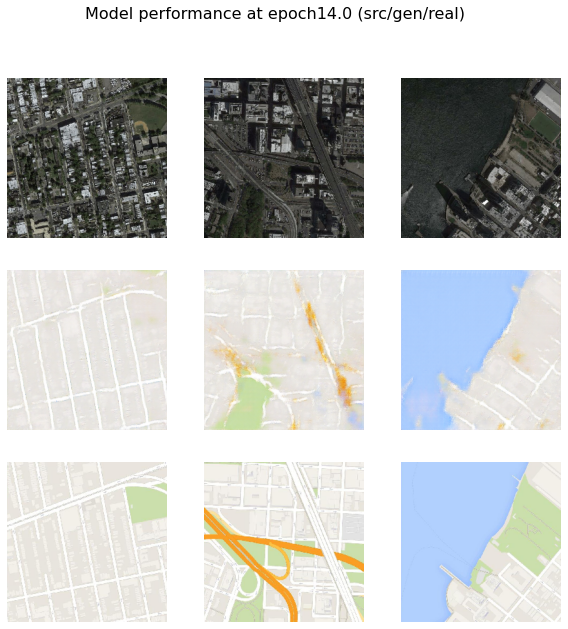

>Saved: plot_epoch14.0.png and model_epoch14.0.h5
step15345: d_loss_real[0.373] d_loss_fake[0.255] gan_loss[6.203]
step15346: d_loss_real[0.068] d_loss_fake[0.289] gan_loss[7.074]
step15347: d_loss_real[0.164] d_loss_fake[0.254] gan_loss[8.016]
step15348: d_loss_real[0.100] d_loss_fake[0.143] gan_loss[9.454]
step15349: d_loss_real[0.248] d_loss_fake[0.132] gan_loss[8.134]
step15350: d_loss_real[0.309] d_loss_fake[0.488] gan_loss[5.878]
step15351: d_loss_real[0.239] d_loss_fake[0.327] gan_loss[5.767]
step15352: d_loss_real[0.053] d_loss_fake[0.299] gan_loss[9.030]
step15353: d_loss_real[0.109] d_loss_fake[0.210] gan_loss[8.476]
step15354: d_loss_real[0.303] d_loss_fake[0.202] gan_loss[9.002]
step15355: d_loss_real[0.487] d_loss_fake[0.496] gan_loss[2.355]
step15356: d_loss_real[0.156] d_loss_fake[0.299] gan_loss[6.841]
step15357: d_loss_real[0.145] d_loss_fake[0.243] gan_loss[6.174]
step15358: d_loss_real[0.726] d_loss_fake[0.162] gan_loss[5.592]
step15359: d_loss_real[0.180] d_loss_fak

step15468: d_loss_real[0.251] d_loss_fake[0.265] gan_loss[3.880]
step15469: d_loss_real[0.202] d_loss_fake[0.321] gan_loss[4.145]
step15470: d_loss_real[0.254] d_loss_fake[0.302] gan_loss[7.754]
step15471: d_loss_real[0.198] d_loss_fake[0.189] gan_loss[7.232]
step15472: d_loss_real[0.206] d_loss_fake[0.357] gan_loss[6.126]
step15473: d_loss_real[0.302] d_loss_fake[0.267] gan_loss[4.399]
step15474: d_loss_real[0.176] d_loss_fake[0.355] gan_loss[8.489]
step15475: d_loss_real[0.078] d_loss_fake[0.110] gan_loss[9.429]
step15476: d_loss_real[0.753] d_loss_fake[0.173] gan_loss[4.207]
step15477: d_loss_real[0.123] d_loss_fake[0.166] gan_loss[11.184]
step15478: d_loss_real[0.517] d_loss_fake[0.163] gan_loss[7.364]
step15479: d_loss_real[0.059] d_loss_fake[0.251] gan_loss[7.115]
step15480: d_loss_real[0.429] d_loss_fake[0.217] gan_loss[7.036]
step15481: d_loss_real[0.256] d_loss_fake[0.369] gan_loss[6.118]
step15482: d_loss_real[0.165] d_loss_fake[0.348] gan_loss[7.249]
step15483: d_loss_real[0

step15594: d_loss_real[0.234] d_loss_fake[0.191] gan_loss[7.875]
step15595: d_loss_real[0.057] d_loss_fake[0.165] gan_loss[18.317]
step15596: d_loss_real[0.055] d_loss_fake[0.225] gan_loss[8.171]
step15597: d_loss_real[0.086] d_loss_fake[0.137] gan_loss[12.929]
step15598: d_loss_real[0.481] d_loss_fake[0.252] gan_loss[6.119]
step15599: d_loss_real[0.069] d_loss_fake[0.157] gan_loss[12.585]
step15600: d_loss_real[0.155] d_loss_fake[0.155] gan_loss[4.208]
step15601: d_loss_real[0.143] d_loss_fake[0.252] gan_loss[6.788]
step15602: d_loss_real[0.113] d_loss_fake[0.149] gan_loss[8.779]
step15603: d_loss_real[0.253] d_loss_fake[0.353] gan_loss[6.666]
step15604: d_loss_real[0.317] d_loss_fake[0.201] gan_loss[7.056]
step15605: d_loss_real[0.322] d_loss_fake[0.453] gan_loss[5.340]
step15606: d_loss_real[0.183] d_loss_fake[0.217] gan_loss[9.278]
step15607: d_loss_real[0.213] d_loss_fake[0.357] gan_loss[6.944]
step15608: d_loss_real[0.149] d_loss_fake[0.249] gan_loss[9.981]
step15609: d_loss_real

step15720: d_loss_real[0.287] d_loss_fake[0.303] gan_loss[6.668]
step15721: d_loss_real[0.218] d_loss_fake[0.332] gan_loss[6.933]
step15722: d_loss_real[0.103] d_loss_fake[0.183] gan_loss[7.262]
step15723: d_loss_real[0.557] d_loss_fake[0.198] gan_loss[5.887]
step15724: d_loss_real[0.385] d_loss_fake[0.297] gan_loss[6.867]
step15725: d_loss_real[0.277] d_loss_fake[0.131] gan_loss[2.787]
step15726: d_loss_real[0.095] d_loss_fake[0.269] gan_loss[7.536]
step15727: d_loss_real[0.122] d_loss_fake[0.167] gan_loss[7.217]
step15728: d_loss_real[0.148] d_loss_fake[0.490] gan_loss[6.990]
step15729: d_loss_real[0.069] d_loss_fake[0.239] gan_loss[9.741]
step15730: d_loss_real[0.446] d_loss_fake[0.195] gan_loss[7.817]
step15731: d_loss_real[0.389] d_loss_fake[0.521] gan_loss[4.835]
step15732: d_loss_real[0.449] d_loss_fake[0.352] gan_loss[3.308]
step15733: d_loss_real[0.189] d_loss_fake[0.287] gan_loss[7.486]
step15734: d_loss_real[0.121] d_loss_fake[0.138] gan_loss[9.935]
step15735: d_loss_real[0.

step15846: d_loss_real[0.131] d_loss_fake[0.265] gan_loss[10.410]
step15847: d_loss_real[0.626] d_loss_fake[0.224] gan_loss[5.191]
step15848: d_loss_real[0.223] d_loss_fake[0.312] gan_loss[7.591]
step15849: d_loss_real[0.146] d_loss_fake[0.427] gan_loss[6.107]
step15850: d_loss_real[0.128] d_loss_fake[0.294] gan_loss[8.445]
step15851: d_loss_real[0.220] d_loss_fake[0.154] gan_loss[7.538]
step15852: d_loss_real[0.407] d_loss_fake[0.263] gan_loss[6.279]
step15853: d_loss_real[0.497] d_loss_fake[0.389] gan_loss[3.382]
step15854: d_loss_real[0.107] d_loss_fake[0.172] gan_loss[7.346]
step15855: d_loss_real[0.307] d_loss_fake[0.280] gan_loss[5.852]
step15856: d_loss_real[0.204] d_loss_fake[0.294] gan_loss[6.266]
step15857: d_loss_real[0.208] d_loss_fake[0.259] gan_loss[6.049]
step15858: d_loss_real[0.279] d_loss_fake[0.381] gan_loss[5.591]
step15859: d_loss_real[0.211] d_loss_fake[0.266] gan_loss[5.891]
step15860: d_loss_real[0.216] d_loss_fake[0.246] gan_loss[3.580]
step15861: d_loss_real[0

step15972: d_loss_real[0.416] d_loss_fake[0.190] gan_loss[7.818]
step15973: d_loss_real[0.355] d_loss_fake[0.261] gan_loss[3.247]
step15974: d_loss_real[0.131] d_loss_fake[0.213] gan_loss[7.680]
step15975: d_loss_real[0.447] d_loss_fake[0.240] gan_loss[5.721]
step15976: d_loss_real[0.356] d_loss_fake[0.333] gan_loss[6.354]
step15977: d_loss_real[0.355] d_loss_fake[0.366] gan_loss[6.065]
step15978: d_loss_real[0.067] d_loss_fake[0.233] gan_loss[14.263]
step15979: d_loss_real[0.513] d_loss_fake[0.339] gan_loss[5.191]
step15980: d_loss_real[0.160] d_loss_fake[0.295] gan_loss[7.318]
step15981: d_loss_real[0.323] d_loss_fake[0.305] gan_loss[6.021]
step15982: d_loss_real[0.366] d_loss_fake[0.319] gan_loss[5.997]
step15983: d_loss_real[0.156] d_loss_fake[0.275] gan_loss[6.636]
step15984: d_loss_real[0.138] d_loss_fake[0.363] gan_loss[8.190]
step15985: d_loss_real[0.214] d_loss_fake[0.238] gan_loss[8.926]
step15986: d_loss_real[0.193] d_loss_fake[0.288] gan_loss[6.968]
step15987: d_loss_real[0

step16098: d_loss_real[0.180] d_loss_fake[0.299] gan_loss[7.928]
step16099: d_loss_real[0.239] d_loss_fake[0.222] gan_loss[4.824]
step16100: d_loss_real[0.506] d_loss_fake[0.168] gan_loss[6.985]
step16101: d_loss_real[0.267] d_loss_fake[0.136] gan_loss[6.108]
step16102: d_loss_real[0.305] d_loss_fake[0.336] gan_loss[7.376]
step16103: d_loss_real[0.155] d_loss_fake[0.455] gan_loss[7.176]
step16104: d_loss_real[0.337] d_loss_fake[0.211] gan_loss[6.546]
step16105: d_loss_real[0.233] d_loss_fake[0.205] gan_loss[2.790]
step16106: d_loss_real[0.139] d_loss_fake[0.246] gan_loss[7.664]
step16107: d_loss_real[0.320] d_loss_fake[0.278] gan_loss[7.107]
step16108: d_loss_real[0.193] d_loss_fake[0.336] gan_loss[6.924]
step16109: d_loss_real[0.246] d_loss_fake[0.294] gan_loss[6.497]
step16110: d_loss_real[0.217] d_loss_fake[0.157] gan_loss[5.400]
step16111: d_loss_real[0.148] d_loss_fake[0.224] gan_loss[3.330]
step16112: d_loss_real[0.280] d_loss_fake[0.328] gan_loss[7.258]
step16113: d_loss_real[0.

step16224: d_loss_real[0.147] d_loss_fake[0.227] gan_loss[8.911]
step16225: d_loss_real[0.283] d_loss_fake[0.352] gan_loss[5.826]
step16226: d_loss_real[0.175] d_loss_fake[0.261] gan_loss[7.230]
step16227: d_loss_real[0.297] d_loss_fake[0.263] gan_loss[6.213]
step16228: d_loss_real[0.273] d_loss_fake[0.540] gan_loss[3.548]
step16229: d_loss_real[0.451] d_loss_fake[0.218] gan_loss[6.235]
step16230: d_loss_real[0.105] d_loss_fake[0.165] gan_loss[8.028]
step16231: d_loss_real[0.095] d_loss_fake[0.180] gan_loss[9.913]
step16232: d_loss_real[0.303] d_loss_fake[0.348] gan_loss[6.449]
step16233: d_loss_real[0.275] d_loss_fake[0.239] gan_loss[6.211]
step16234: d_loss_real[0.368] d_loss_fake[0.443] gan_loss[5.236]
step16235: d_loss_real[0.230] d_loss_fake[0.293] gan_loss[2.394]
step16236: d_loss_real[0.136] d_loss_fake[0.204] gan_loss[4.901]
step16237: d_loss_real[0.649] d_loss_fake[0.230] gan_loss[7.622]
step16238: d_loss_real[0.135] d_loss_fake[0.223] gan_loss[6.098]
step16239: d_loss_real[0.

step16350: d_loss_real[0.444] d_loss_fake[0.296] gan_loss[5.031]
step16351: d_loss_real[0.299] d_loss_fake[0.343] gan_loss[3.503]
step16352: d_loss_real[0.135] d_loss_fake[0.619] gan_loss[1.973]
step16353: d_loss_real[0.200] d_loss_fake[0.388] gan_loss[6.639]
step16354: d_loss_real[0.437] d_loss_fake[0.233] gan_loss[5.809]
step16355: d_loss_real[0.555] d_loss_fake[0.203] gan_loss[2.854]
step16356: d_loss_real[0.220] d_loss_fake[0.281] gan_loss[6.151]
step16357: d_loss_real[0.145] d_loss_fake[0.228] gan_loss[6.548]
step16358: d_loss_real[0.255] d_loss_fake[0.450] gan_loss[5.244]
step16359: d_loss_real[0.269] d_loss_fake[0.270] gan_loss[5.804]
step16360: d_loss_real[0.247] d_loss_fake[0.471] gan_loss[4.272]
step16361: d_loss_real[0.398] d_loss_fake[0.353] gan_loss[5.495]
step16362: d_loss_real[0.237] d_loss_fake[0.354] gan_loss[6.060]
step16363: d_loss_real[0.256] d_loss_fake[0.217] gan_loss[6.698]
step16364: d_loss_real[0.353] d_loss_fake[0.352] gan_loss[5.656]
step16365: d_loss_real[0.

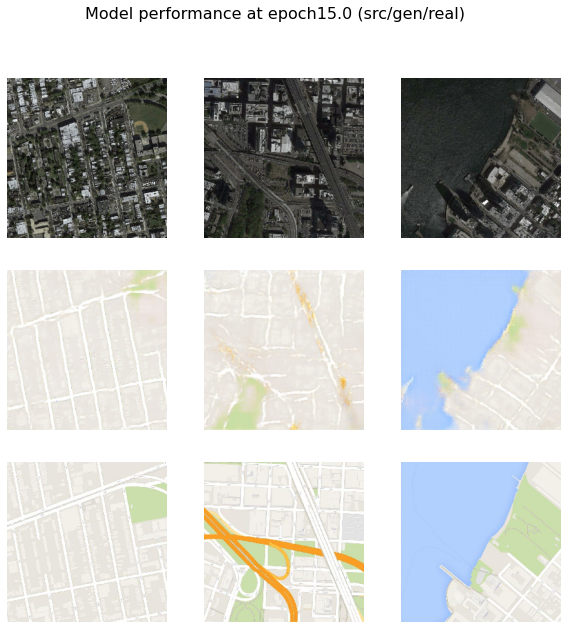

>Saved: plot_epoch15.0.png and model_epoch15.0.h5
step16441: d_loss_real[0.547] d_loss_fake[0.178] gan_loss[6.411]
step16442: d_loss_real[0.254] d_loss_fake[0.238] gan_loss[5.960]
step16443: d_loss_real[0.281] d_loss_fake[0.293] gan_loss[6.238]
step16444: d_loss_real[0.266] d_loss_fake[0.187] gan_loss[7.455]
step16445: d_loss_real[0.117] d_loss_fake[0.601] gan_loss[6.101]
step16446: d_loss_real[0.233] d_loss_fake[0.325] gan_loss[6.380]
step16447: d_loss_real[0.498] d_loss_fake[0.440] gan_loss[2.373]
step16448: d_loss_real[0.201] d_loss_fake[0.310] gan_loss[7.985]
step16449: d_loss_real[0.466] d_loss_fake[0.197] gan_loss[7.227]
step16450: d_loss_real[0.504] d_loss_fake[0.195] gan_loss[9.139]
step16451: d_loss_real[0.060] d_loss_fake[0.404] gan_loss[10.349]
step16452: d_loss_real[0.565] d_loss_fake[0.259] gan_loss[4.502]
step16453: d_loss_real[0.236] d_loss_fake[0.338] gan_loss[7.697]
step16454: d_loss_real[0.226] d_loss_fake[0.255] gan_loss[8.197]
step16455: d_loss_real[0.275] d_loss_fa

step16564: d_loss_real[0.199] d_loss_fake[0.332] gan_loss[7.140]
step16565: d_loss_real[0.159] d_loss_fake[0.200] gan_loss[8.428]
step16566: d_loss_real[0.154] d_loss_fake[0.147] gan_loss[13.166]
step16567: d_loss_real[0.292] d_loss_fake[0.338] gan_loss[6.309]
step16568: d_loss_real[0.188] d_loss_fake[0.223] gan_loss[8.436]
step16569: d_loss_real[0.120] d_loss_fake[0.227] gan_loss[8.556]
step16570: d_loss_real[0.265] d_loss_fake[0.265] gan_loss[6.627]
step16571: d_loss_real[0.334] d_loss_fake[0.301] gan_loss[6.106]
step16572: d_loss_real[0.129] d_loss_fake[0.226] gan_loss[6.628]
step16573: d_loss_real[0.155] d_loss_fake[0.146] gan_loss[9.341]
step16574: d_loss_real[0.290] d_loss_fake[0.387] gan_loss[6.868]
step16575: d_loss_real[0.106] d_loss_fake[0.235] gan_loss[7.851]
step16576: d_loss_real[0.346] d_loss_fake[0.176] gan_loss[5.383]
step16577: d_loss_real[0.171] d_loss_fake[0.261] gan_loss[7.348]
step16578: d_loss_real[0.436] d_loss_fake[0.310] gan_loss[5.751]
step16579: d_loss_real[0

step16690: d_loss_real[0.155] d_loss_fake[0.337] gan_loss[7.147]
step16691: d_loss_real[0.425] d_loss_fake[0.230] gan_loss[6.476]
step16692: d_loss_real[0.321] d_loss_fake[0.308] gan_loss[6.670]
step16693: d_loss_real[0.658] d_loss_fake[0.185] gan_loss[5.514]
step16694: d_loss_real[0.266] d_loss_fake[0.235] gan_loss[2.716]
step16695: d_loss_real[0.209] d_loss_fake[0.297] gan_loss[7.576]
step16696: d_loss_real[0.106] d_loss_fake[0.279] gan_loss[5.816]
step16697: d_loss_real[0.414] d_loss_fake[0.217] gan_loss[5.199]
step16698: d_loss_real[0.203] d_loss_fake[0.350] gan_loss[5.460]
step16699: d_loss_real[0.570] d_loss_fake[0.194] gan_loss[5.345]
step16700: d_loss_real[0.054] d_loss_fake[0.176] gan_loss[7.125]
step16701: d_loss_real[0.226] d_loss_fake[0.298] gan_loss[6.171]
step16702: d_loss_real[0.153] d_loss_fake[0.301] gan_loss[7.229]
step16703: d_loss_real[0.063] d_loss_fake[0.182] gan_loss[8.485]
step16704: d_loss_real[0.281] d_loss_fake[0.255] gan_loss[6.522]
step16705: d_loss_real[0.

step16816: d_loss_real[0.345] d_loss_fake[0.259] gan_loss[5.891]
step16817: d_loss_real[0.304] d_loss_fake[0.292] gan_loss[5.284]
step16818: d_loss_real[0.328] d_loss_fake[0.217] gan_loss[6.072]
step16819: d_loss_real[0.321] d_loss_fake[0.451] gan_loss[5.729]
step16820: d_loss_real[0.367] d_loss_fake[0.408] gan_loss[2.355]
step16821: d_loss_real[0.222] d_loss_fake[0.368] gan_loss[5.997]
step16822: d_loss_real[0.496] d_loss_fake[0.235] gan_loss[2.729]
step16823: d_loss_real[0.236] d_loss_fake[0.305] gan_loss[6.904]
step16824: d_loss_real[0.164] d_loss_fake[0.307] gan_loss[7.218]
step16825: d_loss_real[0.641] d_loss_fake[0.234] gan_loss[5.697]
step16826: d_loss_real[0.374] d_loss_fake[0.298] gan_loss[6.041]
step16827: d_loss_real[0.375] d_loss_fake[0.383] gan_loss[2.770]
step16828: d_loss_real[0.235] d_loss_fake[0.285] gan_loss[6.296]
step16829: d_loss_real[0.361] d_loss_fake[0.263] gan_loss[5.010]
step16830: d_loss_real[0.138] d_loss_fake[0.477] gan_loss[6.694]
step16831: d_loss_real[0.

step16942: d_loss_real[0.095] d_loss_fake[0.167] gan_loss[9.704]
step16943: d_loss_real[0.411] d_loss_fake[0.368] gan_loss[5.291]
step16944: d_loss_real[0.107] d_loss_fake[0.163] gan_loss[6.471]
step16945: d_loss_real[0.220] d_loss_fake[0.292] gan_loss[7.116]
step16946: d_loss_real[0.469] d_loss_fake[0.243] gan_loss[5.515]
step16947: d_loss_real[0.173] d_loss_fake[0.247] gan_loss[7.135]
step16948: d_loss_real[0.182] d_loss_fake[0.231] gan_loss[2.755]
step16949: d_loss_real[0.247] d_loss_fake[0.254] gan_loss[6.355]
step16950: d_loss_real[0.101] d_loss_fake[0.300] gan_loss[10.170]
step16951: d_loss_real[0.583] d_loss_fake[0.232] gan_loss[7.303]
step16952: d_loss_real[0.354] d_loss_fake[0.309] gan_loss[6.096]
step16953: d_loss_real[0.219] d_loss_fake[0.351] gan_loss[6.039]
step16954: d_loss_real[0.214] d_loss_fake[0.298] gan_loss[6.766]
step16955: d_loss_real[0.349] d_loss_fake[0.294] gan_loss[5.654]
step16956: d_loss_real[0.189] d_loss_fake[0.360] gan_loss[8.096]
step16957: d_loss_real[0

step17068: d_loss_real[0.072] d_loss_fake[0.259] gan_loss[7.443]
step17069: d_loss_real[0.505] d_loss_fake[0.310] gan_loss[4.921]
step17070: d_loss_real[0.445] d_loss_fake[0.406] gan_loss[4.355]
step17071: d_loss_real[0.613] d_loss_fake[0.187] gan_loss[5.110]
step17072: d_loss_real[0.405] d_loss_fake[0.256] gan_loss[5.456]
step17073: d_loss_real[0.080] d_loss_fake[0.402] gan_loss[6.976]
step17074: d_loss_real[0.353] d_loss_fake[0.331] gan_loss[5.793]
step17075: d_loss_real[0.416] d_loss_fake[0.287] gan_loss[5.153]
step17076: d_loss_real[0.241] d_loss_fake[0.305] gan_loss[5.336]
step17077: d_loss_real[0.222] d_loss_fake[0.317] gan_loss[6.055]
step17078: d_loss_real[0.155] d_loss_fake[0.321] gan_loss[7.554]
step17079: d_loss_real[0.464] d_loss_fake[0.211] gan_loss[8.777]
step17080: d_loss_real[0.292] d_loss_fake[0.323] gan_loss[6.558]
step17081: d_loss_real[0.197] d_loss_fake[0.296] gan_loss[6.502]
step17082: d_loss_real[0.284] d_loss_fake[0.332] gan_loss[5.256]
step17083: d_loss_real[0.

step17195: d_loss_real[0.154] d_loss_fake[0.293] gan_loss[7.965]
step17196: d_loss_real[0.159] d_loss_fake[0.288] gan_loss[7.572]
step17197: d_loss_real[0.449] d_loss_fake[0.299] gan_loss[6.037]
step17198: d_loss_real[0.414] d_loss_fake[0.263] gan_loss[5.576]
step17199: d_loss_real[0.228] d_loss_fake[0.512] gan_loss[6.328]
step17200: d_loss_real[0.271] d_loss_fake[0.247] gan_loss[9.446]
step17201: d_loss_real[0.376] d_loss_fake[0.243] gan_loss[3.913]
step17202: d_loss_real[0.265] d_loss_fake[0.358] gan_loss[5.747]
step17203: d_loss_real[0.243] d_loss_fake[0.277] gan_loss[7.155]
step17204: d_loss_real[0.173] d_loss_fake[0.389] gan_loss[9.063]
step17205: d_loss_real[0.576] d_loss_fake[0.333] gan_loss[4.866]
step17206: d_loss_real[0.217] d_loss_fake[0.189] gan_loss[8.794]
step17207: d_loss_real[0.154] d_loss_fake[0.162] gan_loss[7.503]
step17208: d_loss_real[0.347] d_loss_fake[0.389] gan_loss[6.201]
step17209: d_loss_real[0.216] d_loss_fake[0.432] gan_loss[6.401]
step17210: d_loss_real[0.

step17322: d_loss_real[0.342] d_loss_fake[0.266] gan_loss[5.531]
step17323: d_loss_real[0.071] d_loss_fake[0.161] gan_loss[8.730]
step17324: d_loss_real[0.091] d_loss_fake[0.333] gan_loss[6.931]
step17325: d_loss_real[0.633] d_loss_fake[0.198] gan_loss[4.679]
step17326: d_loss_real[0.543] d_loss_fake[0.307] gan_loss[1.728]
step17327: d_loss_real[0.275] d_loss_fake[0.304] gan_loss[6.815]
step17328: d_loss_real[0.313] d_loss_fake[0.295] gan_loss[6.195]
step17329: d_loss_real[0.098] d_loss_fake[0.258] gan_loss[6.836]
step17330: d_loss_real[0.474] d_loss_fake[0.198] gan_loss[5.896]
step17331: d_loss_real[0.263] d_loss_fake[0.356] gan_loss[6.086]
step17332: d_loss_real[0.232] d_loss_fake[0.287] gan_loss[9.067]
step17333: d_loss_real[0.100] d_loss_fake[0.210] gan_loss[6.959]
step17334: d_loss_real[0.150] d_loss_fake[0.275] gan_loss[5.994]
step17335: d_loss_real[0.134] d_loss_fake[0.164] gan_loss[8.396]
step17336: d_loss_real[0.208] d_loss_fake[0.169] gan_loss[7.731]
step17337: d_loss_real[0.

step17449: d_loss_real[0.268] d_loss_fake[0.247] gan_loss[8.101]
step17450: d_loss_real[0.370] d_loss_fake[0.332] gan_loss[5.081]
step17451: d_loss_real[0.260] d_loss_fake[0.334] gan_loss[6.588]
step17452: d_loss_real[0.127] d_loss_fake[0.215] gan_loss[7.105]
step17453: d_loss_real[0.497] d_loss_fake[0.225] gan_loss[5.485]
step17454: d_loss_real[0.224] d_loss_fake[0.271] gan_loss[2.940]
step17455: d_loss_real[0.138] d_loss_fake[0.289] gan_loss[6.715]
step17456: d_loss_real[0.277] d_loss_fake[0.235] gan_loss[6.584]
step17457: d_loss_real[0.076] d_loss_fake[0.208] gan_loss[9.689]
step17458: d_loss_real[0.133] d_loss_fake[0.290] gan_loss[6.905]
step17459: d_loss_real[0.378] d_loss_fake[0.246] gan_loss[5.677]
step17460: d_loss_real[0.300] d_loss_fake[0.298] gan_loss[5.715]
step17461: d_loss_real[0.216] d_loss_fake[0.299] gan_loss[5.960]
step17462: d_loss_real[0.299] d_loss_fake[0.277] gan_loss[6.229]
step17463: d_loss_real[0.071] d_loss_fake[0.167] gan_loss[7.902]
step17464: d_loss_real[0.

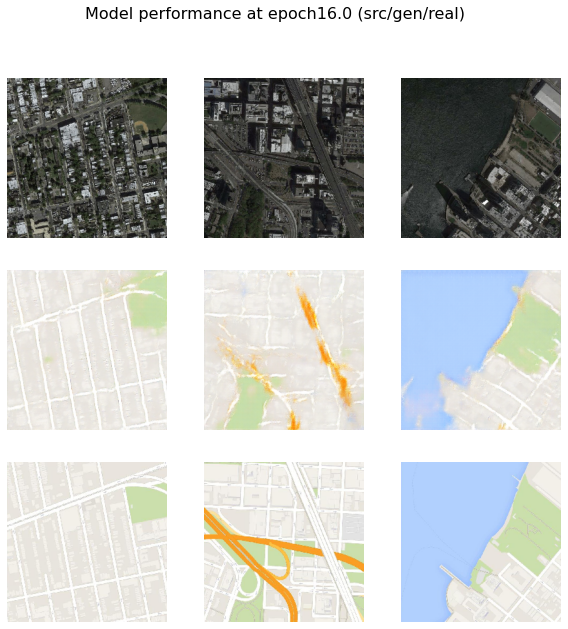

>Saved: plot_epoch16.0.png and model_epoch16.0.h5
step17537: d_loss_real[0.211] d_loss_fake[0.348] gan_loss[6.022]
step17538: d_loss_real[0.101] d_loss_fake[0.242] gan_loss[6.765]
step17539: d_loss_real[0.382] d_loss_fake[0.339] gan_loss[5.287]
step17540: d_loss_real[0.305] d_loss_fake[0.308] gan_loss[6.758]
step17541: d_loss_real[0.350] d_loss_fake[0.264] gan_loss[7.256]
step17542: d_loss_real[0.175] d_loss_fake[0.391] gan_loss[7.813]
step17543: d_loss_real[0.493] d_loss_fake[0.190] gan_loss[5.733]
step17544: d_loss_real[0.280] d_loss_fake[0.176] gan_loss[6.953]
step17545: d_loss_real[0.217] d_loss_fake[0.701] gan_loss[4.363]
step17546: d_loss_real[0.096] d_loss_fake[0.226] gan_loss[8.848]
step17547: d_loss_real[0.596] d_loss_fake[0.171] gan_loss[6.934]
step17548: d_loss_real[0.402] d_loss_fake[0.257] gan_loss[6.575]
step17549: d_loss_real[0.610] d_loss_fake[0.199] gan_loss[5.085]
step17550: d_loss_real[0.140] d_loss_fake[0.539] gan_loss[6.080]
step17551: d_loss_real[0.189] d_loss_fak

step17660: d_loss_real[0.667] d_loss_fake[0.175] gan_loss[6.036]
step17661: d_loss_real[0.105] d_loss_fake[0.204] gan_loss[13.762]
step17662: d_loss_real[0.533] d_loss_fake[0.275] gan_loss[3.440]
step17663: d_loss_real[0.405] d_loss_fake[0.405] gan_loss[5.913]
step17664: d_loss_real[0.348] d_loss_fake[0.348] gan_loss[5.642]
step17665: d_loss_real[0.283] d_loss_fake[0.311] gan_loss[4.802]
step17666: d_loss_real[0.357] d_loss_fake[0.360] gan_loss[5.119]
step17667: d_loss_real[0.302] d_loss_fake[0.291] gan_loss[5.449]
step17668: d_loss_real[0.268] d_loss_fake[0.332] gan_loss[5.401]
step17669: d_loss_real[0.113] d_loss_fake[0.186] gan_loss[7.030]
step17670: d_loss_real[0.180] d_loss_fake[0.438] gan_loss[6.984]
step17671: d_loss_real[0.350] d_loss_fake[0.209] gan_loss[6.379]
step17672: d_loss_real[0.167] d_loss_fake[0.205] gan_loss[7.246]
step17673: d_loss_real[0.130] d_loss_fake[0.201] gan_loss[4.937]
step17674: d_loss_real[0.153] d_loss_fake[0.281] gan_loss[9.454]
step17675: d_loss_real[0

step17786: d_loss_real[0.368] d_loss_fake[0.513] gan_loss[5.336]
step17787: d_loss_real[0.471] d_loss_fake[0.211] gan_loss[5.314]
step17788: d_loss_real[0.224] d_loss_fake[0.309] gan_loss[5.772]
step17789: d_loss_real[0.356] d_loss_fake[0.379] gan_loss[3.377]
step17790: d_loss_real[0.180] d_loss_fake[0.197] gan_loss[5.092]
step17791: d_loss_real[0.079] d_loss_fake[0.266] gan_loss[6.950]
step17792: d_loss_real[0.328] d_loss_fake[0.371] gan_loss[6.028]
step17793: d_loss_real[0.347] d_loss_fake[0.265] gan_loss[5.421]
step17794: d_loss_real[0.103] d_loss_fake[0.256] gan_loss[6.533]
step17795: d_loss_real[0.446] d_loss_fake[0.180] gan_loss[6.597]
step17796: d_loss_real[0.306] d_loss_fake[0.285] gan_loss[5.980]
step17797: d_loss_real[0.214] d_loss_fake[0.392] gan_loss[6.810]
step17798: d_loss_real[0.233] d_loss_fake[0.258] gan_loss[5.812]
step17799: d_loss_real[0.361] d_loss_fake[0.307] gan_loss[5.976]
step17800: d_loss_real[0.290] d_loss_fake[0.331] gan_loss[5.846]
step17801: d_loss_real[0.

step17912: d_loss_real[0.120] d_loss_fake[0.476] gan_loss[8.085]
step17913: d_loss_real[0.281] d_loss_fake[0.206] gan_loss[7.045]
step17914: d_loss_real[0.378] d_loss_fake[0.253] gan_loss[5.787]
step17915: d_loss_real[0.181] d_loss_fake[0.435] gan_loss[6.777]
step17916: d_loss_real[0.479] d_loss_fake[0.260] gan_loss[5.209]
step17917: d_loss_real[0.523] d_loss_fake[0.337] gan_loss[3.729]
step17918: d_loss_real[0.226] d_loss_fake[0.367] gan_loss[7.518]
step17919: d_loss_real[0.457] d_loss_fake[0.208] gan_loss[5.405]
step17920: d_loss_real[0.459] d_loss_fake[0.294] gan_loss[6.415]
step17921: d_loss_real[0.105] d_loss_fake[0.171] gan_loss[8.089]
step17922: d_loss_real[0.221] d_loss_fake[0.329] gan_loss[5.780]
step17923: d_loss_real[0.121] d_loss_fake[0.286] gan_loss[6.471]
step17924: d_loss_real[0.403] d_loss_fake[0.225] gan_loss[5.725]
step17925: d_loss_real[0.387] d_loss_fake[0.317] gan_loss[5.337]
step17926: d_loss_real[0.413] d_loss_fake[0.478] gan_loss[2.833]
step17927: d_loss_real[0.

step18039: d_loss_real[0.105] d_loss_fake[0.218] gan_loss[7.292]
step18040: d_loss_real[0.185] d_loss_fake[0.209] gan_loss[6.349]
step18041: d_loss_real[0.183] d_loss_fake[0.347] gan_loss[6.027]
step18042: d_loss_real[0.251] d_loss_fake[0.351] gan_loss[6.190]
step18043: d_loss_real[0.143] d_loss_fake[0.156] gan_loss[8.333]
step18044: d_loss_real[0.483] d_loss_fake[0.169] gan_loss[5.877]
step18045: d_loss_real[0.154] d_loss_fake[0.412] gan_loss[3.879]
step18046: d_loss_real[0.417] d_loss_fake[0.368] gan_loss[4.366]
step18047: d_loss_real[0.302] d_loss_fake[0.339] gan_loss[5.787]
step18048: d_loss_real[0.165] d_loss_fake[0.336] gan_loss[5.945]
step18049: d_loss_real[0.483] d_loss_fake[0.217] gan_loss[5.816]
step18050: d_loss_real[0.374] d_loss_fake[0.305] gan_loss[6.764]
step18051: d_loss_real[0.324] d_loss_fake[0.319] gan_loss[6.446]
step18052: d_loss_real[0.197] d_loss_fake[0.308] gan_loss[6.126]
step18053: d_loss_real[0.384] d_loss_fake[0.216] gan_loss[5.580]
step18054: d_loss_real[0.

step18165: d_loss_real[0.544] d_loss_fake[0.259] gan_loss[2.416]
step18166: d_loss_real[0.083] d_loss_fake[0.417] gan_loss[6.960]
step18167: d_loss_real[0.136] d_loss_fake[0.217] gan_loss[8.189]
step18168: d_loss_real[0.317] d_loss_fake[0.347] gan_loss[5.824]
step18169: d_loss_real[0.375] d_loss_fake[0.275] gan_loss[5.638]
step18170: d_loss_real[0.340] d_loss_fake[0.386] gan_loss[5.169]
step18171: d_loss_real[0.081] d_loss_fake[0.264] gan_loss[7.241]
step18172: d_loss_real[0.211] d_loss_fake[0.358] gan_loss[6.812]
step18173: d_loss_real[0.219] d_loss_fake[0.260] gan_loss[5.537]
step18174: d_loss_real[0.195] d_loss_fake[0.294] gan_loss[6.112]
step18175: d_loss_real[0.221] d_loss_fake[0.401] gan_loss[6.719]
step18176: d_loss_real[0.303] d_loss_fake[0.272] gan_loss[6.650]
step18177: d_loss_real[0.232] d_loss_fake[0.209] gan_loss[7.175]
step18178: d_loss_real[0.362] d_loss_fake[0.369] gan_loss[7.187]
step18179: d_loss_real[0.209] d_loss_fake[0.222] gan_loss[3.414]
step18180: d_loss_real[0.

step18291: d_loss_real[0.428] d_loss_fake[0.309] gan_loss[2.755]
step18292: d_loss_real[0.095] d_loss_fake[0.298] gan_loss[7.119]
step18293: d_loss_real[0.177] d_loss_fake[0.186] gan_loss[7.096]
step18294: d_loss_real[0.444] d_loss_fake[0.207] gan_loss[5.902]
step18295: d_loss_real[0.251] d_loss_fake[0.499] gan_loss[4.585]
step18296: d_loss_real[0.291] d_loss_fake[0.264] gan_loss[6.495]
step18297: d_loss_real[0.216] d_loss_fake[0.298] gan_loss[5.724]
step18298: d_loss_real[0.625] d_loss_fake[0.244] gan_loss[3.421]
step18299: d_loss_real[0.558] d_loss_fake[0.269] gan_loss[5.065]
step18300: d_loss_real[0.247] d_loss_fake[0.449] gan_loss[7.331]
step18301: d_loss_real[0.095] d_loss_fake[0.239] gan_loss[6.422]
step18302: d_loss_real[0.182] d_loss_fake[0.191] gan_loss[8.021]
step18303: d_loss_real[0.253] d_loss_fake[0.236] gan_loss[5.794]
step18304: d_loss_real[0.209] d_loss_fake[0.342] gan_loss[6.072]
step18305: d_loss_real[0.184] d_loss_fake[0.283] gan_loss[9.343]
step18306: d_loss_real[0.

step18417: d_loss_real[0.204] d_loss_fake[0.406] gan_loss[6.262]
step18418: d_loss_real[0.103] d_loss_fake[0.139] gan_loss[10.152]
step18419: d_loss_real[0.286] d_loss_fake[0.240] gan_loss[9.354]
step18420: d_loss_real[0.428] d_loss_fake[0.409] gan_loss[2.721]
step18421: d_loss_real[0.183] d_loss_fake[0.213] gan_loss[11.391]
step18422: d_loss_real[0.133] d_loss_fake[0.261] gan_loss[8.435]
step18423: d_loss_real[0.155] d_loss_fake[0.281] gan_loss[7.430]
step18424: d_loss_real[0.315] d_loss_fake[0.194] gan_loss[9.752]
step18425: d_loss_real[0.624] d_loss_fake[0.172] gan_loss[7.173]
step18426: d_loss_real[0.510] d_loss_fake[0.483] gan_loss[4.618]
step18427: d_loss_real[0.180] d_loss_fake[0.462] gan_loss[6.199]
step18428: d_loss_real[0.147] d_loss_fake[0.209] gan_loss[8.159]
step18429: d_loss_real[0.506] d_loss_fake[0.202] gan_loss[5.623]
step18430: d_loss_real[0.424] d_loss_fake[0.263] gan_loss[4.895]
step18431: d_loss_real[0.265] d_loss_fake[0.298] gan_loss[4.710]
step18432: d_loss_real[

step18543: d_loss_real[0.111] d_loss_fake[0.243] gan_loss[8.798]
step18544: d_loss_real[0.354] d_loss_fake[0.341] gan_loss[6.002]
step18545: d_loss_real[0.119] d_loss_fake[0.229] gan_loss[7.082]
step18546: d_loss_real[0.098] d_loss_fake[0.163] gan_loss[8.090]
step18547: d_loss_real[0.645] d_loss_fake[0.248] gan_loss[3.164]
step18548: d_loss_real[0.293] d_loss_fake[0.350] gan_loss[7.324]
step18549: d_loss_real[0.296] d_loss_fake[0.323] gan_loss[6.037]
step18550: d_loss_real[0.233] d_loss_fake[0.398] gan_loss[6.388]
step18551: d_loss_real[0.168] d_loss_fake[0.345] gan_loss[7.234]
step18552: d_loss_real[0.477] d_loss_fake[0.206] gan_loss[5.313]
step18553: d_loss_real[0.353] d_loss_fake[0.290] gan_loss[5.525]
step18554: d_loss_real[0.239] d_loss_fake[0.284] gan_loss[6.917]
step18555: d_loss_real[0.350] d_loss_fake[0.333] gan_loss[4.899]
step18556: d_loss_real[0.341] d_loss_fake[0.348] gan_loss[5.205]
step18557: d_loss_real[0.348] d_loss_fake[0.388] gan_loss[4.225]
step18558: d_loss_real[0.

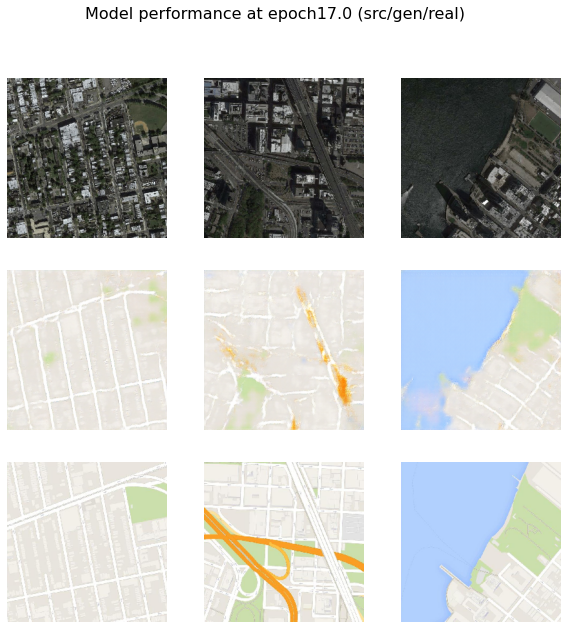

>Saved: plot_epoch17.0.png and model_epoch17.0.h5
step18633: d_loss_real[0.096] d_loss_fake[0.279] gan_loss[7.853]
step18634: d_loss_real[0.342] d_loss_fake[0.194] gan_loss[5.026]
step18635: d_loss_real[0.182] d_loss_fake[0.544] gan_loss[4.137]
step18636: d_loss_real[0.349] d_loss_fake[0.256] gan_loss[7.136]
step18637: d_loss_real[0.168] d_loss_fake[0.393] gan_loss[6.536]
step18638: d_loss_real[0.319] d_loss_fake[0.204] gan_loss[6.580]
step18639: d_loss_real[0.264] d_loss_fake[0.385] gan_loss[5.827]
step18640: d_loss_real[0.133] d_loss_fake[0.244] gan_loss[8.433]
step18641: d_loss_real[0.154] d_loss_fake[0.163] gan_loss[7.422]
step18642: d_loss_real[0.296] d_loss_fake[0.178] gan_loss[6.706]
step18643: d_loss_real[0.106] d_loss_fake[0.213] gan_loss[9.830]
step18644: d_loss_real[0.340] d_loss_fake[0.311] gan_loss[5.600]
step18645: d_loss_real[0.101] d_loss_fake[0.490] gan_loss[7.587]
step18646: d_loss_real[0.141] d_loss_fake[0.157] gan_loss[8.872]
step18647: d_loss_real[0.447] d_loss_fak

step18756: d_loss_real[0.393] d_loss_fake[0.186] gan_loss[6.193]
step18757: d_loss_real[0.289] d_loss_fake[0.531] gan_loss[5.765]
step18758: d_loss_real[0.165] d_loss_fake[0.339] gan_loss[6.932]
step18759: d_loss_real[0.225] d_loss_fake[0.300] gan_loss[6.049]
step18760: d_loss_real[0.589] d_loss_fake[0.213] gan_loss[6.182]
step18761: d_loss_real[0.424] d_loss_fake[0.171] gan_loss[8.695]
step18762: d_loss_real[0.109] d_loss_fake[0.192] gan_loss[12.564]
step18763: d_loss_real[0.353] d_loss_fake[0.286] gan_loss[3.199]
step18764: d_loss_real[0.297] d_loss_fake[0.290] gan_loss[6.495]
step18765: d_loss_real[0.173] d_loss_fake[0.402] gan_loss[6.024]
step18766: d_loss_real[0.110] d_loss_fake[0.326] gan_loss[5.434]
step18767: d_loss_real[0.477] d_loss_fake[0.182] gan_loss[6.745]
step18768: d_loss_real[0.374] d_loss_fake[0.219] gan_loss[6.345]
step18769: d_loss_real[0.141] d_loss_fake[0.303] gan_loss[6.484]
step18770: d_loss_real[0.468] d_loss_fake[0.415] gan_loss[4.385]
step18771: d_loss_real[0

step18883: d_loss_real[0.579] d_loss_fake[0.241] gan_loss[3.922]
step18884: d_loss_real[0.412] d_loss_fake[0.352] gan_loss[2.198]
step18885: d_loss_real[0.106] d_loss_fake[0.278] gan_loss[9.733]
step18886: d_loss_real[0.220] d_loss_fake[0.294] gan_loss[6.557]
step18887: d_loss_real[0.459] d_loss_fake[0.228] gan_loss[5.869]
step18888: d_loss_real[0.418] d_loss_fake[0.330] gan_loss[4.813]
step18889: d_loss_real[0.128] d_loss_fake[0.249] gan_loss[5.971]
step18890: d_loss_real[0.190] d_loss_fake[0.375] gan_loss[6.729]
step18891: d_loss_real[0.493] d_loss_fake[0.255] gan_loss[2.702]
step18892: d_loss_real[0.154] d_loss_fake[0.175] gan_loss[7.052]
step18893: d_loss_real[0.377] d_loss_fake[0.241] gan_loss[5.263]
step18894: d_loss_real[0.101] d_loss_fake[0.318] gan_loss[7.581]
step18895: d_loss_real[0.268] d_loss_fake[0.283] gan_loss[5.339]
step18896: d_loss_real[0.130] d_loss_fake[0.229] gan_loss[7.495]
step18897: d_loss_real[0.104] d_loss_fake[0.154] gan_loss[4.904]
step18898: d_loss_real[0.

step19009: d_loss_real[0.458] d_loss_fake[0.226] gan_loss[5.249]
step19010: d_loss_real[0.145] d_loss_fake[0.283] gan_loss[6.294]
step19011: d_loss_real[0.246] d_loss_fake[0.242] gan_loss[6.613]
step19012: d_loss_real[0.424] d_loss_fake[0.284] gan_loss[4.753]
step19013: d_loss_real[0.143] d_loss_fake[0.470] gan_loss[6.288]
step19014: d_loss_real[0.093] d_loss_fake[0.210] gan_loss[10.541]
step19015: d_loss_real[0.461] d_loss_fake[0.226] gan_loss[4.921]
step19016: d_loss_real[0.129] d_loss_fake[0.246] gan_loss[7.344]
step19017: d_loss_real[0.083] d_loss_fake[0.169] gan_loss[5.028]
step19018: d_loss_real[0.287] d_loss_fake[0.379] gan_loss[2.195]
step19019: d_loss_real[0.089] d_loss_fake[0.185] gan_loss[5.821]
step19020: d_loss_real[0.420] d_loss_fake[0.241] gan_loss[3.531]
step19021: d_loss_real[0.113] d_loss_fake[0.185] gan_loss[8.617]
step19022: d_loss_real[0.110] d_loss_fake[0.266] gan_loss[7.833]
step19023: d_loss_real[0.412] d_loss_fake[0.258] gan_loss[5.645]
step19024: d_loss_real[0

step19136: d_loss_real[0.423] d_loss_fake[0.232] gan_loss[5.114]
step19137: d_loss_real[0.152] d_loss_fake[0.235] gan_loss[5.843]
step19138: d_loss_real[0.296] d_loss_fake[0.543] gan_loss[5.760]
step19139: d_loss_real[0.274] d_loss_fake[0.400] gan_loss[5.987]
step19140: d_loss_real[0.472] d_loss_fake[0.336] gan_loss[5.431]
step19141: d_loss_real[0.134] d_loss_fake[0.245] gan_loss[6.257]
step19142: d_loss_real[0.348] d_loss_fake[0.345] gan_loss[2.293]
step19143: d_loss_real[0.168] d_loss_fake[0.206] gan_loss[6.597]
step19144: d_loss_real[0.262] d_loss_fake[0.316] gan_loss[6.354]
step19145: d_loss_real[0.099] d_loss_fake[0.191] gan_loss[9.180]
step19146: d_loss_real[0.154] d_loss_fake[0.282] gan_loss[6.209]
step19147: d_loss_real[0.504] d_loss_fake[0.179] gan_loss[5.596]
step19148: d_loss_real[0.343] d_loss_fake[0.183] gan_loss[5.239]
step19149: d_loss_real[0.094] d_loss_fake[0.269] gan_loss[9.507]
step19150: d_loss_real[0.315] d_loss_fake[0.325] gan_loss[4.583]
step19151: d_loss_real[0.

step19263: d_loss_real[0.092] d_loss_fake[0.285] gan_loss[7.807]
step19264: d_loss_real[0.210] d_loss_fake[0.374] gan_loss[7.500]
step19265: d_loss_real[0.258] d_loss_fake[0.178] gan_loss[2.873]
step19266: d_loss_real[0.182] d_loss_fake[0.307] gan_loss[7.315]
step19267: d_loss_real[0.326] d_loss_fake[0.207] gan_loss[6.575]
step19268: d_loss_real[0.409] d_loss_fake[0.228] gan_loss[5.444]
step19269: d_loss_real[0.314] d_loss_fake[0.582] gan_loss[5.242]
step19270: d_loss_real[0.120] d_loss_fake[0.413] gan_loss[6.502]
step19271: d_loss_real[0.444] d_loss_fake[0.241] gan_loss[5.242]
step19272: d_loss_real[0.382] d_loss_fake[0.247] gan_loss[6.398]
step19273: d_loss_real[0.154] d_loss_fake[0.201] gan_loss[6.622]
step19274: d_loss_real[0.169] d_loss_fake[0.267] gan_loss[5.682]
step19275: d_loss_real[0.293] d_loss_fake[0.392] gan_loss[5.087]
step19276: d_loss_real[0.321] d_loss_fake[0.329] gan_loss[5.548]
step19277: d_loss_real[0.097] d_loss_fake[0.185] gan_loss[7.128]
step19278: d_loss_real[0.

step19390: d_loss_real[0.276] d_loss_fake[0.601] gan_loss[4.528]
step19391: d_loss_real[0.090] d_loss_fake[0.225] gan_loss[9.072]
step19392: d_loss_real[0.389] d_loss_fake[0.301] gan_loss[5.719]
step19393: d_loss_real[0.222] d_loss_fake[0.203] gan_loss[3.587]
step19394: d_loss_real[0.336] d_loss_fake[0.305] gan_loss[5.967]
step19395: d_loss_real[0.099] d_loss_fake[0.184] gan_loss[6.004]
step19396: d_loss_real[0.098] d_loss_fake[0.303] gan_loss[6.630]
step19397: d_loss_real[0.456] d_loss_fake[0.235] gan_loss[4.984]
step19398: d_loss_real[0.312] d_loss_fake[0.295] gan_loss[5.855]
step19399: d_loss_real[0.198] d_loss_fake[0.205] gan_loss[8.216]
step19400: d_loss_real[0.125] d_loss_fake[0.499] gan_loss[5.704]
step19401: d_loss_real[0.175] d_loss_fake[0.265] gan_loss[6.151]
step19402: d_loss_real[0.108] d_loss_fake[0.172] gan_loss[7.062]
step19403: d_loss_real[0.100] d_loss_fake[0.150] gan_loss[6.331]
step19404: d_loss_real[0.555] d_loss_fake[0.329] gan_loss[3.271]
step19405: d_loss_real[0.

step19517: d_loss_real[0.101] d_loss_fake[0.232] gan_loss[9.163]
step19518: d_loss_real[0.532] d_loss_fake[0.284] gan_loss[4.518]
step19519: d_loss_real[0.085] d_loss_fake[0.324] gan_loss[5.896]
step19520: d_loss_real[0.413] d_loss_fake[0.261] gan_loss[6.165]
step19521: d_loss_real[0.224] d_loss_fake[0.225] gan_loss[7.585]
step19522: d_loss_real[0.275] d_loss_fake[0.403] gan_loss[5.151]
step19523: d_loss_real[0.240] d_loss_fake[0.406] gan_loss[5.982]
step19524: d_loss_real[0.217] d_loss_fake[0.248] gan_loss[6.454]
step19525: d_loss_real[0.074] d_loss_fake[0.383] gan_loss[7.838]
step19526: d_loss_real[0.193] d_loss_fake[0.255] gan_loss[7.723]
step19527: d_loss_real[0.534] d_loss_fake[0.216] gan_loss[4.807]
step19528: d_loss_real[0.436] d_loss_fake[0.216] gan_loss[5.746]
step19529: d_loss_real[0.345] d_loss_fake[0.270] gan_loss[6.143]
step19530: d_loss_real[0.136] d_loss_fake[0.338] gan_loss[5.366]
step19531: d_loss_real[0.130] d_loss_fake[0.297] gan_loss[6.197]
step19532: d_loss_real[0.

step19644: d_loss_real[0.592] d_loss_fake[0.197] gan_loss[4.090]
step19645: d_loss_real[0.337] d_loss_fake[0.247] gan_loss[5.561]
step19646: d_loss_real[0.144] d_loss_fake[0.393] gan_loss[6.398]
step19647: d_loss_real[0.318] d_loss_fake[0.242] gan_loss[1.915]
step19648: d_loss_real[0.249] d_loss_fake[0.304] gan_loss[6.180]
step19649: d_loss_real[0.328] d_loss_fake[0.243] gan_loss[6.174]
step19650: d_loss_real[0.214] d_loss_fake[0.603] gan_loss[4.981]
step19651: d_loss_real[0.140] d_loss_fake[0.232] gan_loss[7.095]
step19652: d_loss_real[0.448] d_loss_fake[0.287] gan_loss[3.125]
step19653: d_loss_real[0.345] d_loss_fake[0.298] gan_loss[5.754]
step19654: d_loss_real[0.233] d_loss_fake[0.654] gan_loss[1.595]
step19655: d_loss_real[0.329] d_loss_fake[0.292] gan_loss[5.701]
step19656: d_loss_real[0.356] d_loss_fake[0.387] gan_loss[4.991]
step19657: d_loss_real[0.165] d_loss_fake[0.436] gan_loss[5.838]
step19658: d_loss_real[0.110] d_loss_fake[0.250] gan_loss[7.252]
step19659: d_loss_real[0.

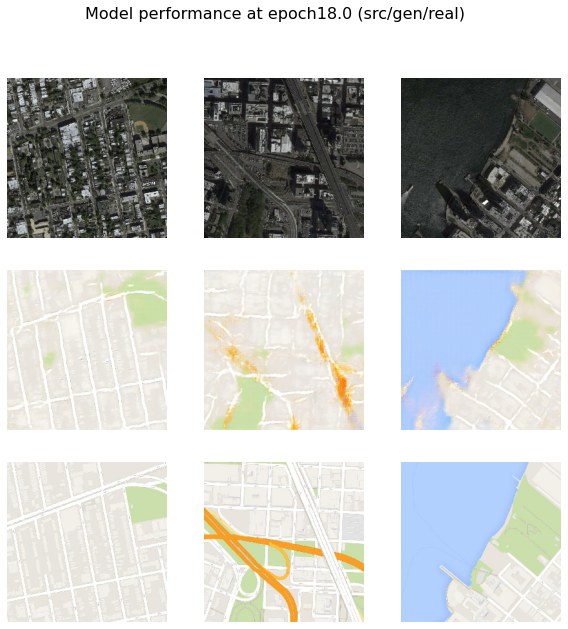

>Saved: plot_epoch18.0.png and model_epoch18.0.h5
step19729: d_loss_real[0.112] d_loss_fake[0.143] gan_loss[3.397]
step19730: d_loss_real[0.604] d_loss_fake[0.205] gan_loss[5.084]
step19731: d_loss_real[0.476] d_loss_fake[0.252] gan_loss[6.080]
step19732: d_loss_real[0.097] d_loss_fake[0.199] gan_loss[5.724]
step19733: d_loss_real[0.087] d_loss_fake[0.182] gan_loss[7.620]
step19734: d_loss_real[0.129] d_loss_fake[0.199] gan_loss[6.427]
step19735: d_loss_real[0.333] d_loss_fake[0.250] gan_loss[6.591]
step19736: d_loss_real[0.228] d_loss_fake[0.294] gan_loss[3.485]
step19737: d_loss_real[0.291] d_loss_fake[0.260] gan_loss[2.103]
step19738: d_loss_real[0.139] d_loss_fake[0.229] gan_loss[6.908]
step19739: d_loss_real[0.105] d_loss_fake[0.292] gan_loss[8.933]
step19740: d_loss_real[0.274] d_loss_fake[0.418] gan_loss[3.633]
step19741: d_loss_real[0.506] d_loss_fake[0.218] gan_loss[5.413]
step19742: d_loss_real[0.095] d_loss_fake[0.230] gan_loss[7.893]
step19743: d_loss_real[0.289] d_loss_fak

step19852: d_loss_real[0.503] d_loss_fake[0.302] gan_loss[2.349]
step19853: d_loss_real[0.355] d_loss_fake[0.277] gan_loss[2.471]
step19854: d_loss_real[0.395] d_loss_fake[0.292] gan_loss[7.090]
step19855: d_loss_real[0.284] d_loss_fake[0.327] gan_loss[5.399]
step19856: d_loss_real[0.311] d_loss_fake[0.304] gan_loss[3.480]
step19857: d_loss_real[0.097] d_loss_fake[0.212] gan_loss[6.485]
step19858: d_loss_real[0.232] d_loss_fake[0.431] gan_loss[6.012]
step19859: d_loss_real[0.128] d_loss_fake[0.216] gan_loss[7.126]
step19860: d_loss_real[0.249] d_loss_fake[0.318] gan_loss[6.249]
step19861: d_loss_real[0.204] d_loss_fake[0.315] gan_loss[6.655]
step19862: d_loss_real[0.320] d_loss_fake[0.166] gan_loss[7.883]
step19863: d_loss_real[0.632] d_loss_fake[0.187] gan_loss[4.552]
step19864: d_loss_real[0.187] d_loss_fake[0.278] gan_loss[5.846]
step19865: d_loss_real[0.240] d_loss_fake[0.647] gan_loss[2.981]
step19866: d_loss_real[0.228] d_loss_fake[0.246] gan_loss[5.571]
step19867: d_loss_real[0.

step19979: d_loss_real[0.112] d_loss_fake[0.193] gan_loss[7.199]
step19980: d_loss_real[0.461] d_loss_fake[0.286] gan_loss[4.593]
step19981: d_loss_real[0.094] d_loss_fake[0.163] gan_loss[9.792]
step19982: d_loss_real[0.227] d_loss_fake[0.386] gan_loss[6.385]
step19983: d_loss_real[0.347] d_loss_fake[0.420] gan_loss[4.381]
step19984: d_loss_real[0.325] d_loss_fake[0.250] gan_loss[5.554]
step19985: d_loss_real[0.437] d_loss_fake[0.413] gan_loss[3.780]
step19986: d_loss_real[0.353] d_loss_fake[0.298] gan_loss[5.976]
step19987: d_loss_real[0.124] d_loss_fake[0.525] gan_loss[7.324]
step19988: d_loss_real[0.132] d_loss_fake[0.181] gan_loss[5.647]
step19989: d_loss_real[0.198] d_loss_fake[0.229] gan_loss[8.076]
step19990: d_loss_real[0.374] d_loss_fake[0.197] gan_loss[3.825]
step19991: d_loss_real[0.153] d_loss_fake[0.435] gan_loss[5.894]
step19992: d_loss_real[0.330] d_loss_fake[0.194] gan_loss[6.798]
step19993: d_loss_real[0.469] d_loss_fake[0.282] gan_loss[5.666]
step19994: d_loss_real[0.

step20105: d_loss_real[0.431] d_loss_fake[0.233] gan_loss[5.270]
step20106: d_loss_real[0.301] d_loss_fake[0.354] gan_loss[5.699]
step20107: d_loss_real[0.203] d_loss_fake[0.531] gan_loss[2.655]
step20108: d_loss_real[0.270] d_loss_fake[0.267] gan_loss[6.111]
step20109: d_loss_real[0.360] d_loss_fake[0.436] gan_loss[6.075]
step20110: d_loss_real[0.146] d_loss_fake[0.379] gan_loss[7.305]
step20111: d_loss_real[0.418] d_loss_fake[0.221] gan_loss[6.675]
step20112: d_loss_real[0.191] d_loss_fake[0.222] gan_loss[6.922]
step20113: d_loss_real[0.127] d_loss_fake[0.206] gan_loss[4.989]
step20114: d_loss_real[0.116] d_loss_fake[0.172] gan_loss[6.538]
step20115: d_loss_real[0.266] d_loss_fake[0.200] gan_loss[6.970]
step20116: d_loss_real[0.231] d_loss_fake[0.378] gan_loss[4.572]
step20117: d_loss_real[0.206] d_loss_fake[0.290] gan_loss[5.727]
step20118: d_loss_real[0.199] d_loss_fake[0.265] gan_loss[5.443]
step20119: d_loss_real[0.398] d_loss_fake[0.639] gan_loss[2.921]
step20120: d_loss_real[0.

step20232: d_loss_real[0.108] d_loss_fake[0.171] gan_loss[6.356]
step20233: d_loss_real[0.090] d_loss_fake[0.182] gan_loss[6.882]
step20234: d_loss_real[0.091] d_loss_fake[0.232] gan_loss[6.176]
step20235: d_loss_real[0.439] d_loss_fake[0.219] gan_loss[6.011]
step20236: d_loss_real[0.111] d_loss_fake[0.279] gan_loss[8.563]
step20237: d_loss_real[0.374] d_loss_fake[0.237] gan_loss[7.763]
step20238: d_loss_real[0.279] d_loss_fake[0.466] gan_loss[3.136]
step20239: d_loss_real[0.225] d_loss_fake[0.386] gan_loss[5.950]
step20240: d_loss_real[0.169] d_loss_fake[0.348] gan_loss[5.963]
step20241: d_loss_real[0.333] d_loss_fake[0.223] gan_loss[7.200]
step20242: d_loss_real[0.386] d_loss_fake[0.338] gan_loss[6.573]
step20243: d_loss_real[0.122] d_loss_fake[0.178] gan_loss[7.958]
step20244: d_loss_real[0.101] d_loss_fake[0.186] gan_loss[11.127]
step20245: d_loss_real[0.317] d_loss_fake[0.257] gan_loss[5.227]
step20246: d_loss_real[0.122] d_loss_fake[0.235] gan_loss[6.520]
step20247: d_loss_real[0

step20359: d_loss_real[0.243] d_loss_fake[0.202] gan_loss[6.777]
step20360: d_loss_real[0.129] d_loss_fake[0.228] gan_loss[6.602]
step20361: d_loss_real[0.270] d_loss_fake[0.435] gan_loss[6.564]
step20362: d_loss_real[0.547] d_loss_fake[0.268] gan_loss[4.051]
step20363: d_loss_real[0.558] d_loss_fake[0.230] gan_loss[6.182]
step20364: d_loss_real[0.138] d_loss_fake[0.188] gan_loss[5.757]
step20365: d_loss_real[0.414] d_loss_fake[0.261] gan_loss[6.047]
step20366: d_loss_real[0.246] d_loss_fake[0.444] gan_loss[4.097]
step20367: d_loss_real[0.353] d_loss_fake[0.300] gan_loss[6.574]
step20368: d_loss_real[0.264] d_loss_fake[0.327] gan_loss[6.628]
step20369: d_loss_real[0.235] d_loss_fake[0.336] gan_loss[6.153]
step20370: d_loss_real[0.186] d_loss_fake[0.241] gan_loss[3.620]
step20371: d_loss_real[0.122] d_loss_fake[0.227] gan_loss[7.330]
step20372: d_loss_real[0.488] d_loss_fake[0.239] gan_loss[6.538]
step20373: d_loss_real[0.331] d_loss_fake[0.482] gan_loss[2.603]
step20374: d_loss_real[0.

step20486: d_loss_real[0.230] d_loss_fake[0.226] gan_loss[7.078]
step20487: d_loss_real[0.093] d_loss_fake[0.356] gan_loss[9.283]
step20488: d_loss_real[0.385] d_loss_fake[0.408] gan_loss[6.574]
step20489: d_loss_real[0.200] d_loss_fake[0.248] gan_loss[6.831]
step20490: d_loss_real[0.586] d_loss_fake[0.232] gan_loss[4.184]
step20491: d_loss_real[0.466] d_loss_fake[0.215] gan_loss[6.841]
step20492: d_loss_real[0.122] d_loss_fake[0.339] gan_loss[6.393]
step20493: d_loss_real[0.126] d_loss_fake[0.215] gan_loss[11.606]
step20494: d_loss_real[0.538] d_loss_fake[0.199] gan_loss[5.880]
step20495: d_loss_real[0.100] d_loss_fake[0.230] gan_loss[6.339]
step20496: d_loss_real[0.387] d_loss_fake[0.265] gan_loss[3.880]
step20497: d_loss_real[0.194] d_loss_fake[0.447] gan_loss[5.558]
step20498: d_loss_real[0.152] d_loss_fake[0.280] gan_loss[7.857]
step20499: d_loss_real[0.258] d_loss_fake[0.266] gan_loss[5.953]
step20500: d_loss_real[0.319] d_loss_fake[0.320] gan_loss[5.704]
step20501: d_loss_real[0

step20612: d_loss_real[0.397] d_loss_fake[0.494] gan_loss[4.872]
step20613: d_loss_real[0.101] d_loss_fake[0.211] gan_loss[8.959]
step20614: d_loss_real[0.236] d_loss_fake[0.202] gan_loss[5.552]
step20615: d_loss_real[0.224] d_loss_fake[0.448] gan_loss[2.576]
step20616: d_loss_real[0.097] d_loss_fake[0.178] gan_loss[8.036]
step20617: d_loss_real[0.425] d_loss_fake[0.290] gan_loss[5.387]
step20618: d_loss_real[0.154] d_loss_fake[0.249] gan_loss[6.593]
step20619: d_loss_real[0.128] d_loss_fake[0.225] gan_loss[6.578]
step20620: d_loss_real[0.211] d_loss_fake[0.530] gan_loss[4.582]
step20621: d_loss_real[0.219] d_loss_fake[0.215] gan_loss[6.680]
step20622: d_loss_real[0.586] d_loss_fake[0.193] gan_loss[7.580]
step20623: d_loss_real[0.126] d_loss_fake[0.245] gan_loss[6.316]
step20624: d_loss_real[0.590] d_loss_fake[0.206] gan_loss[4.459]
step20625: d_loss_real[0.248] d_loss_fake[0.226] gan_loss[6.369]
step20626: d_loss_real[0.113] d_loss_fake[0.191] gan_loss[7.800]
step20627: d_loss_real[0.

step20739: d_loss_real[0.110] d_loss_fake[0.226] gan_loss[12.631]
step20740: d_loss_real[0.167] d_loss_fake[0.192] gan_loss[8.578]
step20741: d_loss_real[0.107] d_loss_fake[0.208] gan_loss[9.920]
step20742: d_loss_real[0.174] d_loss_fake[0.200] gan_loss[5.614]
step20743: d_loss_real[0.330] d_loss_fake[0.373] gan_loss[4.872]
step20744: d_loss_real[0.098] d_loss_fake[0.214] gan_loss[6.410]
step20745: d_loss_real[0.102] d_loss_fake[0.194] gan_loss[8.249]
step20746: d_loss_real[0.439] d_loss_fake[0.254] gan_loss[5.794]
step20747: d_loss_real[0.275] d_loss_fake[0.280] gan_loss[5.380]
step20748: d_loss_real[0.217] d_loss_fake[0.439] gan_loss[5.962]
step20749: d_loss_real[0.104] d_loss_fake[0.245] gan_loss[4.636]
step20750: d_loss_real[0.365] d_loss_fake[0.288] gan_loss[4.955]
step20751: d_loss_real[0.212] d_loss_fake[0.229] gan_loss[6.982]
step20752: d_loss_real[0.144] d_loss_fake[0.189] gan_loss[7.154]
step20753: d_loss_real[0.303] d_loss_fake[0.454] gan_loss[1.602]
step20754: d_loss_real[0

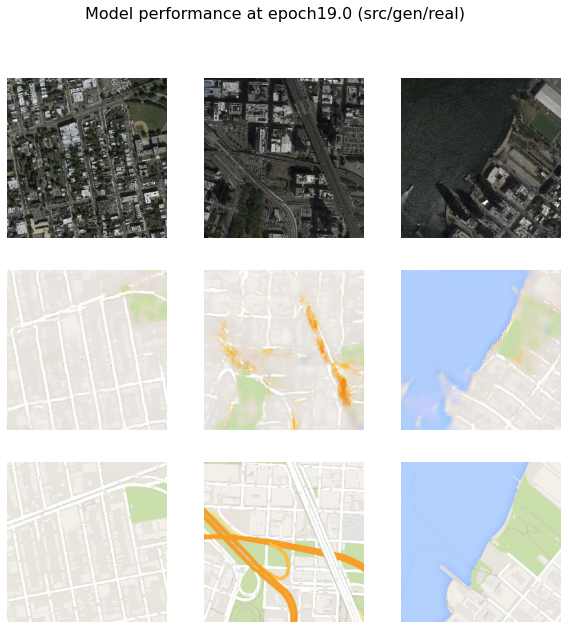

>Saved: plot_epoch19.0.png and model_epoch19.0.h5
step20825: d_loss_real[0.135] d_loss_fake[0.196] gan_loss[7.164]
step20826: d_loss_real[0.556] d_loss_fake[0.194] gan_loss[4.979]
step20827: d_loss_real[0.100] d_loss_fake[0.184] gan_loss[6.655]
step20828: d_loss_real[0.383] d_loss_fake[0.261] gan_loss[6.682]
step20829: d_loss_real[0.114] d_loss_fake[0.254] gan_loss[6.677]
step20830: d_loss_real[0.122] d_loss_fake[0.169] gan_loss[7.480]
step20831: d_loss_real[0.234] d_loss_fake[0.555] gan_loss[2.660]
step20832: d_loss_real[0.286] d_loss_fake[0.233] gan_loss[6.106]
step20833: d_loss_real[0.376] d_loss_fake[0.390] gan_loss[3.506]
step20834: d_loss_real[0.111] d_loss_fake[0.182] gan_loss[11.788]
step20835: d_loss_real[0.344] d_loss_fake[0.209] gan_loss[5.972]
step20836: d_loss_real[0.110] d_loss_fake[0.256] gan_loss[9.074]
step20837: d_loss_real[0.112] d_loss_fake[0.262] gan_loss[7.566]
step20838: d_loss_real[0.252] d_loss_fake[0.178] gan_loss[6.525]
step20839: d_loss_real[0.331] d_loss_fa

step20948: d_loss_real[0.108] d_loss_fake[0.195] gan_loss[8.152]
step20949: d_loss_real[0.379] d_loss_fake[0.281] gan_loss[5.101]
step20950: d_loss_real[0.460] d_loss_fake[0.299] gan_loss[5.096]
step20951: d_loss_real[0.114] d_loss_fake[0.319] gan_loss[5.562]
step20952: d_loss_real[0.182] d_loss_fake[0.275] gan_loss[5.246]
step20953: d_loss_real[0.197] d_loss_fake[0.290] gan_loss[5.676]
step20954: d_loss_real[0.323] d_loss_fake[0.342] gan_loss[5.455]
step20955: d_loss_real[0.110] d_loss_fake[0.270] gan_loss[6.444]
step20956: d_loss_real[0.301] d_loss_fake[0.239] gan_loss[6.137]
step20957: d_loss_real[0.187] d_loss_fake[0.300] gan_loss[5.940]
step20958: d_loss_real[0.146] d_loss_fake[0.348] gan_loss[5.211]
step20959: d_loss_real[0.508] d_loss_fake[0.237] gan_loss[4.854]
step20960: d_loss_real[0.167] d_loss_fake[0.638] gan_loss[5.163]
step20961: d_loss_real[0.422] d_loss_fake[0.211] gan_loss[5.787]
step20962: d_loss_real[0.312] d_loss_fake[0.416] gan_loss[5.190]
step20963: d_loss_real[0.

step21075: d_loss_real[0.324] d_loss_fake[0.208] gan_loss[6.550]
step21076: d_loss_real[0.480] d_loss_fake[0.241] gan_loss[6.575]
step21077: d_loss_real[0.157] d_loss_fake[0.473] gan_loss[5.813]
step21078: d_loss_real[0.370] d_loss_fake[0.219] gan_loss[5.959]
step21079: d_loss_real[0.295] d_loss_fake[0.211] gan_loss[3.964]
step21080: d_loss_real[0.298] d_loss_fake[0.600] gan_loss[3.363]
step21081: d_loss_real[0.117] d_loss_fake[0.396] gan_loss[5.816]
step21082: d_loss_real[0.351] d_loss_fake[0.209] gan_loss[7.164]
step21083: d_loss_real[0.116] d_loss_fake[0.235] gan_loss[8.619]
step21084: d_loss_real[0.117] d_loss_fake[0.187] gan_loss[7.069]
step21085: d_loss_real[0.314] d_loss_fake[0.366] gan_loss[5.522]
step21086: d_loss_real[0.269] d_loss_fake[0.296] gan_loss[5.381]
step21087: d_loss_real[0.262] d_loss_fake[0.299] gan_loss[5.452]
step21088: d_loss_real[0.315] d_loss_fake[0.234] gan_loss[6.908]
step21089: d_loss_real[0.119] d_loss_fake[0.366] gan_loss[6.870]
step21090: d_loss_real[0.

step21202: d_loss_real[0.125] d_loss_fake[0.303] gan_loss[5.579]
step21203: d_loss_real[0.300] d_loss_fake[0.346] gan_loss[5.310]
step21204: d_loss_real[0.174] d_loss_fake[0.310] gan_loss[5.910]
step21205: d_loss_real[0.310] d_loss_fake[0.247] gan_loss[5.703]
step21206: d_loss_real[0.219] d_loss_fake[0.241] gan_loss[5.845]
step21207: d_loss_real[0.124] d_loss_fake[0.387] gan_loss[6.650]
step21208: d_loss_real[0.524] d_loss_fake[0.235] gan_loss[2.335]
step21209: d_loss_real[0.429] d_loss_fake[0.246] gan_loss[5.674]
step21210: d_loss_real[0.312] d_loss_fake[0.342] gan_loss[4.864]
step21211: d_loss_real[0.314] d_loss_fake[0.341] gan_loss[3.353]
step21212: d_loss_real[0.340] d_loss_fake[0.322] gan_loss[2.600]
step21213: d_loss_real[0.105] d_loss_fake[0.239] gan_loss[9.708]
step21214: d_loss_real[0.138] d_loss_fake[0.297] gan_loss[7.345]
step21215: d_loss_real[0.248] d_loss_fake[0.225] gan_loss[5.645]
step21216: d_loss_real[0.383] d_loss_fake[0.338] gan_loss[3.243]
step21217: d_loss_real[0.

step21329: d_loss_real[0.137] d_loss_fake[0.449] gan_loss[5.904]
step21330: d_loss_real[0.348] d_loss_fake[0.245] gan_loss[5.855]
step21331: d_loss_real[0.154] d_loss_fake[0.261] gan_loss[5.605]
step21332: d_loss_real[0.506] d_loss_fake[0.277] gan_loss[4.335]
step21333: d_loss_real[0.178] d_loss_fake[0.213] gan_loss[11.205]
step21334: d_loss_real[0.172] d_loss_fake[0.460] gan_loss[6.885]
step21335: d_loss_real[0.255] d_loss_fake[0.215] gan_loss[7.130]
step21336: d_loss_real[0.175] d_loss_fake[0.222] gan_loss[5.814]
step21337: d_loss_real[0.179] d_loss_fake[0.409] gan_loss[6.077]
step21338: d_loss_real[0.430] d_loss_fake[0.317] gan_loss[7.290]
step21339: d_loss_real[0.468] d_loss_fake[0.215] gan_loss[5.306]
step21340: d_loss_real[0.493] d_loss_fake[0.289] gan_loss[4.476]
step21341: d_loss_real[0.264] d_loss_fake[0.343] gan_loss[5.202]
step21342: d_loss_real[0.112] d_loss_fake[0.264] gan_loss[7.448]
step21343: d_loss_real[0.154] d_loss_fake[0.207] gan_loss[7.803]
step21344: d_loss_real[0

step21456: d_loss_real[0.205] d_loss_fake[0.297] gan_loss[5.971]
step21457: d_loss_real[0.162] d_loss_fake[0.292] gan_loss[6.582]
step21458: d_loss_real[0.259] d_loss_fake[0.270] gan_loss[4.899]
step21459: d_loss_real[0.253] d_loss_fake[0.207] gan_loss[5.693]
step21460: d_loss_real[0.107] d_loss_fake[0.251] gan_loss[9.887]
step21461: d_loss_real[0.112] d_loss_fake[0.219] gan_loss[8.764]
step21462: d_loss_real[0.297] d_loss_fake[0.245] gan_loss[6.365]
step21463: d_loss_real[0.374] d_loss_fake[0.599] gan_loss[2.023]
step21464: d_loss_real[0.576] d_loss_fake[0.247] gan_loss[3.922]
step21465: d_loss_real[0.231] d_loss_fake[0.206] gan_loss[5.813]
step21466: d_loss_real[0.184] d_loss_fake[0.454] gan_loss[5.529]
step21467: d_loss_real[0.117] d_loss_fake[0.185] gan_loss[7.612]
step21468: d_loss_real[0.165] d_loss_fake[0.230] gan_loss[7.286]
step21469: d_loss_real[0.412] d_loss_fake[0.255] gan_loss[5.332]
step21470: d_loss_real[0.161] d_loss_fake[0.296] gan_loss[5.328]
step21471: d_loss_real[0.

step21583: d_loss_real[0.102] d_loss_fake[0.369] gan_loss[7.409]
step21584: d_loss_real[0.316] d_loss_fake[0.349] gan_loss[3.916]
step21585: d_loss_real[0.231] d_loss_fake[0.219] gan_loss[6.562]
step21586: d_loss_real[0.187] d_loss_fake[0.258] gan_loss[5.595]
step21587: d_loss_real[0.476] d_loss_fake[0.279] gan_loss[4.845]
step21588: d_loss_real[0.302] d_loss_fake[0.214] gan_loss[6.436]
step21589: d_loss_real[0.110] d_loss_fake[0.585] gan_loss[5.819]
step21590: d_loss_real[0.397] d_loss_fake[0.216] gan_loss[6.638]
step21591: d_loss_real[0.318] d_loss_fake[0.287] gan_loss[4.583]
step21592: d_loss_real[0.189] d_loss_fake[0.291] gan_loss[5.767]
step21593: d_loss_real[0.312] d_loss_fake[0.275] gan_loss[5.992]
step21594: d_loss_real[0.180] d_loss_fake[0.349] gan_loss[6.061]
step21595: d_loss_real[0.168] d_loss_fake[0.618] gan_loss[1.837]
step21596: d_loss_real[0.522] d_loss_fake[0.285] gan_loss[4.591]
step21597: d_loss_real[0.334] d_loss_fake[0.349] gan_loss[5.780]
step21598: d_loss_real[0.

step21710: d_loss_real[0.556] d_loss_fake[0.294] gan_loss[3.348]
step21711: d_loss_real[0.292] d_loss_fake[0.451] gan_loss[1.706]
step21712: d_loss_real[0.180] d_loss_fake[0.217] gan_loss[6.906]
step21713: d_loss_real[0.142] d_loss_fake[0.214] gan_loss[7.330]
step21714: d_loss_real[0.321] d_loss_fake[0.373] gan_loss[4.977]
step21715: d_loss_real[0.434] d_loss_fake[0.289] gan_loss[4.210]
step21716: d_loss_real[0.426] d_loss_fake[0.348] gan_loss[5.551]
step21717: d_loss_real[0.379] d_loss_fake[0.231] gan_loss[5.500]
step21718: d_loss_real[0.364] d_loss_fake[0.336] gan_loss[3.892]
step21719: d_loss_real[0.152] d_loss_fake[0.388] gan_loss[5.660]
step21720: d_loss_real[0.138] d_loss_fake[0.307] gan_loss[6.342]
step21721: d_loss_real[0.352] d_loss_fake[0.239] gan_loss[5.570]
step21722: d_loss_real[0.246] d_loss_fake[0.394] gan_loss[4.344]
step21723: d_loss_real[0.177] d_loss_fake[0.290] gan_loss[5.867]
step21724: d_loss_real[0.199] d_loss_fake[0.239] gan_loss[5.471]
step21725: d_loss_real[0.

step21837: d_loss_real[0.421] d_loss_fake[0.230] gan_loss[5.537]
step21838: d_loss_real[0.266] d_loss_fake[0.497] gan_loss[4.766]
step21839: d_loss_real[0.273] d_loss_fake[0.327] gan_loss[3.653]
step21840: d_loss_real[0.199] d_loss_fake[0.262] gan_loss[6.473]
step21841: d_loss_real[0.153] d_loss_fake[0.239] gan_loss[6.285]
step21842: d_loss_real[0.118] d_loss_fake[0.279] gan_loss[6.235]
step21843: d_loss_real[0.345] d_loss_fake[0.257] gan_loss[5.153]
step21844: d_loss_real[0.143] d_loss_fake[0.358] gan_loss[5.480]
step21845: d_loss_real[0.111] d_loss_fake[0.198] gan_loss[7.622]
step21846: d_loss_real[0.131] d_loss_fake[0.201] gan_loss[7.319]
step21847: d_loss_real[0.185] d_loss_fake[0.204] gan_loss[9.017]
step21848: d_loss_real[0.264] d_loss_fake[0.540] gan_loss[1.869]
step21849: d_loss_real[0.156] d_loss_fake[0.242] gan_loss[6.598]
step21850: d_loss_real[0.468] d_loss_fake[0.373] gan_loss[6.471]
step21851: d_loss_real[0.524] d_loss_fake[0.247] gan_loss[3.988]
step21852: d_loss_real[0.

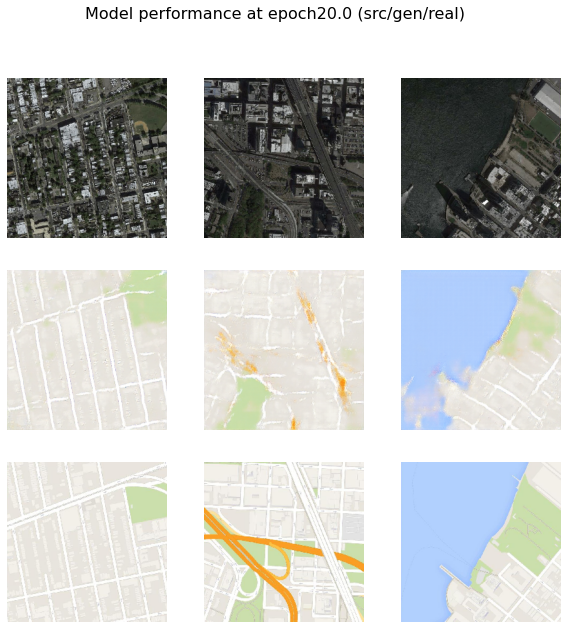

>Saved: plot_epoch20.0.png and model_epoch20.0.h5
Execution time is:  1:58:04.921367


In [12]:
start1 = datetime.now() 

train(d_model, g_model, gan_model, dataset_train, dataset_test, n_epochs=20, n_batch=1) 
#Reports parameters for each batch (total 1096) for each epoch.
#For 10 epochs we should see 10960

stop1 = datetime.now()
execution_time = stop1-start1
print("Execution time is: ", execution_time)

## Loading a saved model

The trainned model after 20 epochs can be downloaded from here: https://drive.google.com/file/d/1LvZ5izBhOUAh1qDHDHUK-ZlV703kwzmi/view?usp=sharing

In [18]:
model = g_model

In [14]:
# model = load_model('model_epoch20.0.h5') # the model after 20 epochs

## Test the model on few images

In [19]:
def plot_images(src_img, gen_img, tar_img):
    """
    plot source, generated and target images
    """
    images = vstack((src_img, gen_img, tar_img))
    images = (images + 1) / 2.0 # scale from [-1,1] to [0,1]
    titles = ['Source', 'Generated', 'Expected']
    # plot images row by row
    for i in range(len(images)):
        plt.subplot(1, 3, 1 + i)
        plt.axis('off')
        plt.imshow(images[i])
        plt.title(titles[i])
    plt.show()

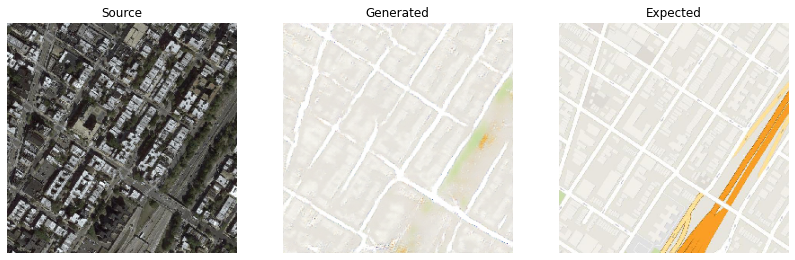

In [27]:
[X1, X2] = dataset_test
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = model.predict(src_image)

plt.figure(figsize=(14,8))
plot_images(src_image, gen_image, tar_image)

# Discussion
Looking into the evolution of the model with training, the improvement is slow after the first 10 epochs. The training is short (only 20 epochs), but already delivered promising results. Possible and practical improvement might be to use several satellite images, taken during different season/camera angle/light direction. <br>
pix2pix model is used to translate image from one domain to another. It was demonstrated how to train and convert satellite images to the corresponding maps images.

# References
- paper: https://arxiv.org/abs/1611.07004
- online tool for demonstration: https://phillipi.github.io/pix2pix/
- data from: http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz<br>
- tf tutorial: https://www.tensorflow.org/tutorials/generative/pix2pix
- used code from: https://github.com/bnsreenu/python_for_microscopists/tree/master/251_satellite_image_to_maps_translation